<a href="https://colab.research.google.com/github/Haikal7090/TUBES-LIDEA-K7/blob/main/Tubes_lidea_ril.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Dependecies

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import zscore
from scipy import stats

# Load Data

In [ ]:
!pip install gdown
!gdown --fuzzy "https://docs.google.com/spreadsheets/d/1mhDBGeIt2b6-FFKrolccp6Jog7ZvhrZN/edit?usp=sharing&ouid=116842443111305752575&rtpof=true&sd=true"

Downloading...
From: https://drive.google.com/uc?id=1mhDBGeIt2b6-FFKrolccp6Jog7ZvhrZN
To: /content/1744774003471_Data_Tugas_Besar_FINAL.xlsx
100% 1.40M/1.40M [00:00<00:00, 52.5MB/s]


In [ ]:
df_raw = pd.read_excel("1744774003471_Data_Tugas_Besar_FINAL.xlsx")
df_raw.head()

,NAME,DESCRIPTION,VALUE,UNITS,DATE_TIME,TAG,DATE_NO,Amount Comp_01
0,AA1,AA1_91_9500062414,0.0,Sm3/d,20210401,91_9500062414,44287,0.0
1,AA1,AA1_91_9500062414,0.0,Sm3/d,20210402,91_9500062414,44288,0.0
2,AA1,AA1_91_9500062414,0.0,Sm3/d,20210403,91_9500062414,44289,0.0
3,AA1,AA1_91_9500062414,0.0,Sm3/d,20210404,91_9500062414,44290,0.0
4,AA1,AA1_91_9500062414,0.0,Sm3/d,20210405,91_9500062414,44291,0.0


In [ ]:
df_raw.shape

(35200, 8)

# Data Wrangling

In [ ]:
# Hapus kolom yang tidak diperlukan
df = df_raw.copy()
df.drop(columns=['DATE_NO', 'TAG', 'Amount Comp_01', 'NAME'], inplace=True, errors='ignore')

# Pivot: setiap kolom adalah satu DESCRIPTION, isinya VALUE, baris berdasarkan DATE_TIME
pivot_df = df.pivot(index='DATE_TIME', columns='DESCRIPTION', values='VALUE')

# Ambil hanya 640 baris pertama dari index 0
pivot_df = pivot_df.iloc[0:640]

# Simpan ke file Excel baru
output_pivot = "pivot_55_description_640rows.xlsx"
pivot_df.to_excel(output_pivot)

print(f"Data pivot dengan 55 kolom DESCRIPTION dan 640 baris DATE_TIME telah disimpan di: {output_pivot}")

Data pivot dengan 55 kolom DESCRIPTION dan 640 baris DATE_TIME telah disimpan di: pivot_55_description_640rows.xlsx


In [ ]:
df = pd.read_excel('pivot_55_description_640rows.xlsx')
df.head()

,DATE_TIME,AA1_91_9500062414,AA1_91_EP_NATURAL_GAS,AA1_ANPR,AA1_ANTP,AA1_C_OP,AA1_C_PR,AA1_C_TE,AA1_FBHP,AA1_FBHT,...,AA5_91_EP_NATURAL_GAS,AA5_ANPR,AA5_ANTP,AA5_C_OP,AA5_C_PR,AA5_C_TE,AA5_FBHP,AA5_FBHT,AA5_FTHP,AA5_FTHT
0,20210401,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,20210402,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,20210403,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,20210404,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,20210405,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# Convert DATE_TIME to datetime
df['DATE_TIME'] = pd.to_datetime(df['DATE_TIME'], format='%Y%m%d')

In [ ]:
df.shape

(640, 56)

# DATA CLEANING

In [ ]:
# prompt: Hapus nilai outlier berdasarkan tiap kolom menggunakan metode iqr berdasarkan parameter kolom "DATE_TIME"

# Calculate IQR for each column except 'DATE_TIME'
Q1 = df.drop(columns=['DATE_TIME']).quantile(0.25)
Q3 = df.drop(columns=['DATE_TIME']).quantile(0.75)
IQR = Q3 - Q1

# Define bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Initialize a boolean mask with all values as True
outlier_mask = pd.Series(True, index=df.index)

# Iterate through each column (excluding 'DATE_TIME') to create the mask
for col in df.columns.drop('DATE_TIME'):
    col_outlier_mask = (df[col] >= lower_bound[col]) & (df[col] <= upper_bound[col])
    outlier_mask = outlier_mask & col_outlier_mask

# Filter the DataFrame based on the combined outlier mask
df_cleaned = df[outlier_mask].copy()

print(f"Original shape: {df.shape}")
print(f"Shape after removing outliers: {df_cleaned.shape}")

Original shape: (640, 56)
Shape after removing outliers: (320, 56)


In [ ]:
# # Function to remove outliers using z-score
# def remove_outliers(df, columns, z_threshold=3):
#     for col in columns:
#         if df[col].dtype in ['int64', 'float64']:
#             z_scores = np.abs(stats.zscore(df[col], nan_policy='omit'))
#             df.loc[z_scores > z_threshold, col] = np.nan
#     return df

# Get numerical columns excluding DATE_TIME
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns

# # Remove outliers
# df = remove_outliers(df, numerical_cols)

# Interpolate missing values
df = df.interpolate(method='linear', limit_direction='both')

# Replace remaining zeros with interpolated values
for col in numerical_cols:
    mask = df[col] == 0
    df.loc[mask, col] = np.nan
    df[col] = df[col].interpolate(method='linear', limit_direction='both')

# Show results
print("Shape after cleaning:", df.shape)
print("\nMissing values after interpolation:", df.isnull().sum().sum())
print("\nSample of cleaned data:")
print(df.head())

Shape after cleaning: (640, 56)

Missing values after interpolation: 0

Sample of cleaned data:
   DATE_TIME  AA1_91_9500062414  AA1_91_EP_NATURAL_GAS  AA1_ANPR  AA1_ANTP  \
0 2021-04-01               1.34               0.446937    148.05       3.4   
1 2021-04-02               1.34               0.446937    148.05       3.4   
2 2021-04-03               1.34               0.446937    148.05       3.4   
3 2021-04-04               1.34               0.446937    148.05       3.4   
4 2021-04-05               1.34               0.446937    148.05       3.4   

   AA1_C_OP  AA1_C_PR  AA1_C_TE  AA1_FBHP  AA1_FBHT  ...  \
0     18.27    168.28       2.6    262.13      28.8  ...   
1     18.27    168.28       2.6    262.13      28.8  ...   
2     18.27    168.28       2.6    262.13      28.8  ...   
3     18.27    168.28       2.6    262.13      28.8  ...   
4     18.27    168.28       2.6    262.13      28.8  ...   

   AA5_91_EP_NATURAL_GAS  AA5_ANPR  AA5_ANTP  AA5_C_OP  AA5_C_PR  AA5_C_TE

In [ ]:
df.shape

(171, 56)

In [ ]:
df.head()

,DATE_TIME,AA1_91_9500062414,AA1_91_EP_NATURAL_GAS,AA1_ANPR,AA1_ANTP,AA1_C_OP,AA1_C_PR,AA1_C_TE,AA1_FBHP,AA1_FBHT,...,AA5_91_EP_NATURAL_GAS,AA5_ANPR,AA5_ANTP,AA5_C_OP,AA5_C_PR,AA5_C_TE,AA5_FBHP,AA5_FBHT,AA5_FTHP,AA5_FTHT
0,2021-04-01,1.34,0.446937,148.05,3.4,18.27,168.28,2.6,262.13,28.8,...,0.581439,267.47,6.3,27.88,160.53,12.5,254.54,29.0,245.98,22.2
1,2021-04-02,1.34,0.446937,148.05,3.4,18.27,168.28,2.6,262.13,28.8,...,0.581439,267.47,6.3,27.88,160.53,12.5,254.54,29.0,245.98,22.2
2,2021-04-03,1.34,0.446937,148.05,3.4,18.27,168.28,2.6,262.13,28.8,...,0.581439,267.47,6.3,27.88,160.53,12.5,254.54,29.0,245.98,22.2
3,2021-04-04,1.34,0.446937,148.05,3.4,18.27,168.28,2.6,262.13,28.8,...,0.581439,267.47,6.3,27.88,160.53,12.5,254.54,29.0,245.98,22.2
4,2021-04-05,1.34,0.446937,148.05,3.4,18.27,168.28,2.6,262.13,28.8,...,0.581439,267.47,6.3,27.88,160.53,12.5,254.54,29.0,245.98,22.2


In [ ]:
df.shape

(640, 56)


--- Summary Statistics for AA1 ---

--- Summary Statistics for AA1_91_9500062414 ---
count      640.000000
mean       380.928969
std        801.040246
min          0.200000
25%          1.260000
50%          1.340000
75%        931.000000
max      15302.000000
Name: AA1_91_9500062414, dtype: float64


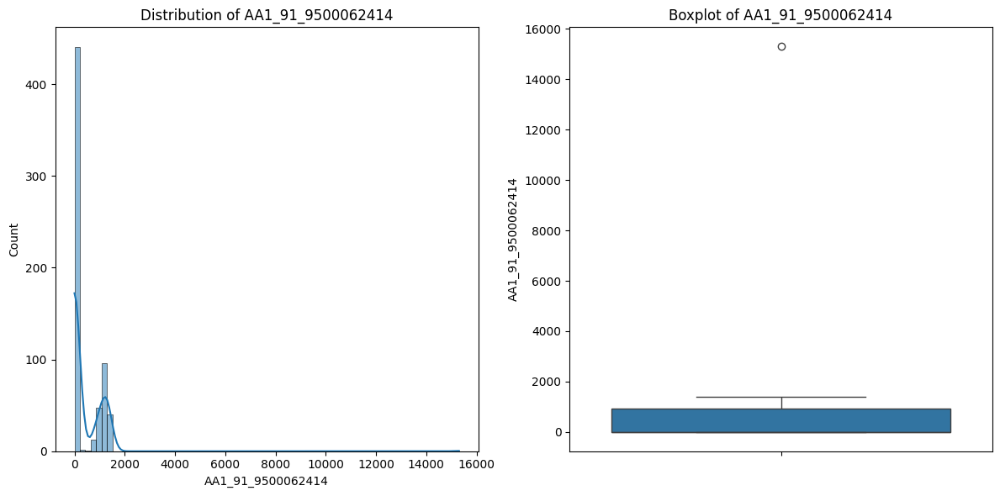


--- Summary Statistics for AA1_91_EP_NATURAL_GAS ---
count    640.000000
mean       0.701610
std        0.120362
min        0.110346
25%        0.713450
50%        0.731820
75%        0.754668
max        0.837520
Name: AA1_91_EP_NATURAL_GAS, dtype: float64


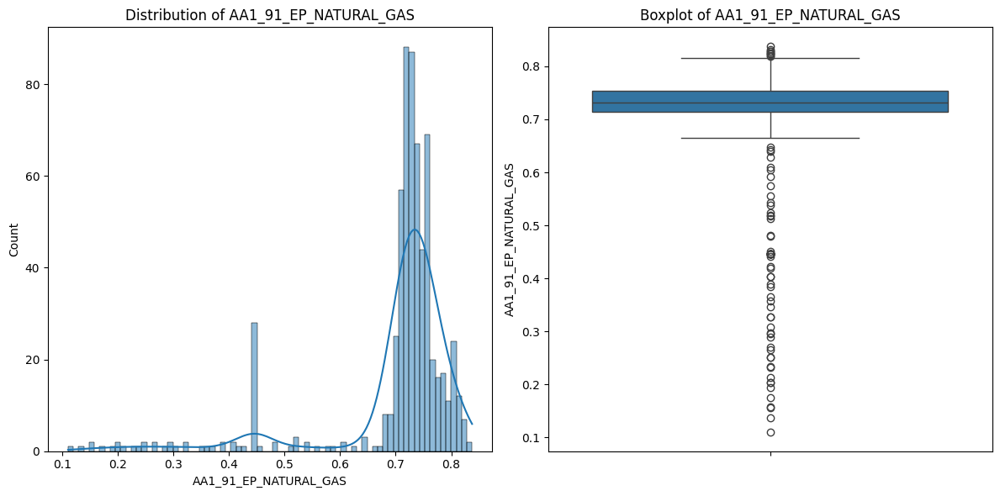


--- Summary Statistics for AA1_ANPR ---
count    640.000000
mean     233.629758
std       26.900387
min      113.360000
25%      235.140000
50%      238.725000
75%      242.872500
max      289.280000
Name: AA1_ANPR, dtype: float64


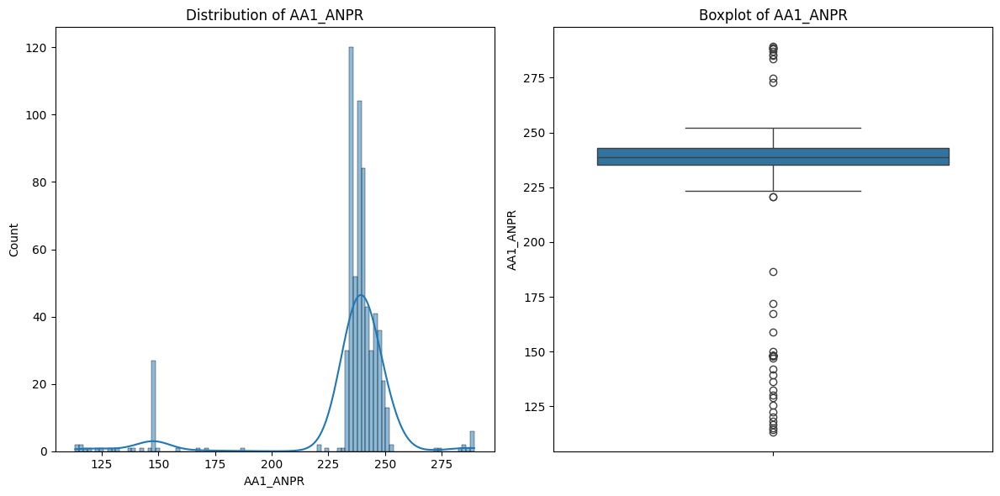


--- Summary Statistics for AA1_C_PR ---
count    640.000000
mean     153.416977
std        6.287389
min      141.510000
25%      150.242500
50%      151.570000
75%      152.795000
max      178.150000
Name: AA1_C_PR, dtype: float64


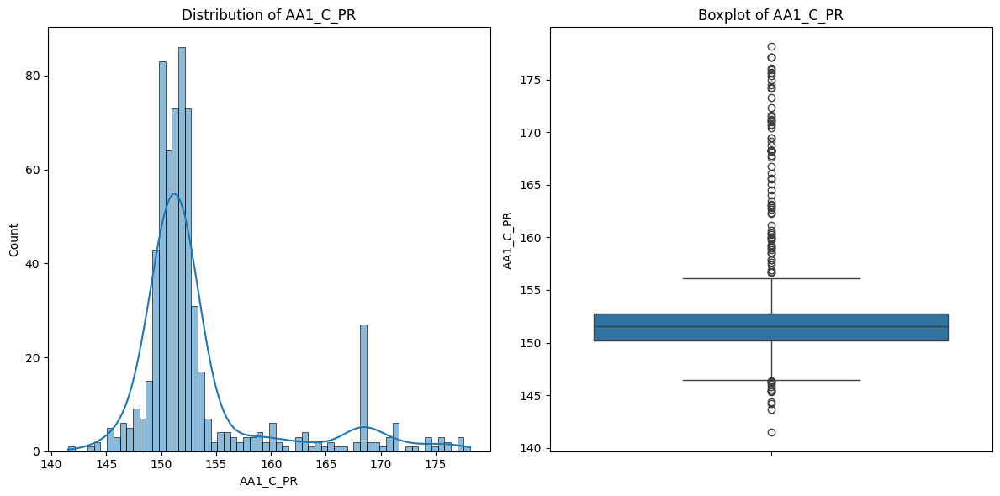


--- Summary Statistics for AA1_FBHP ---
count    640.000000
mean     243.718016
std        9.066104
min      231.520000
25%      235.845000
50%      242.125000
75%      250.420000
max      262.130000
Name: AA1_FBHP, dtype: float64


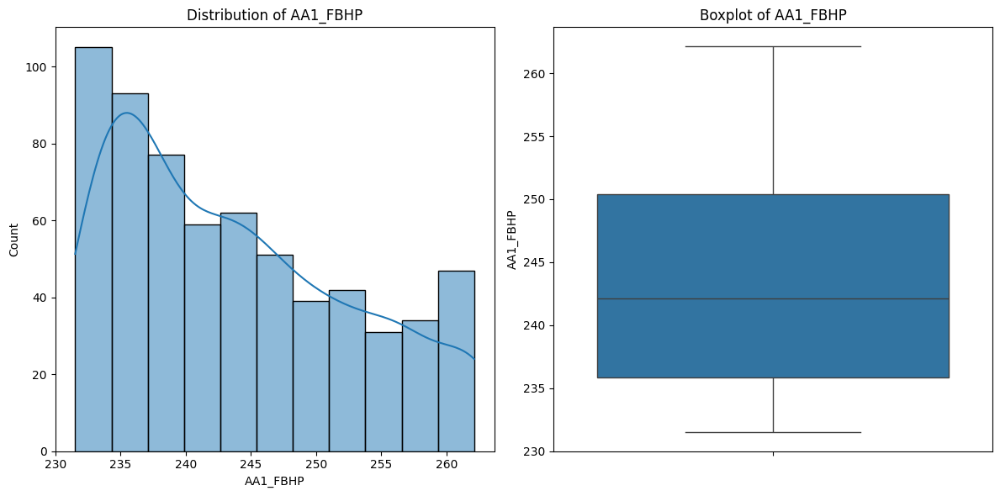


--- Summary Statistics for AA1_ANTP ---
count    640.000000
mean       7.069375
std        1.481381
min        2.800000
25%        6.900000
50%        7.400000
75%        8.000000
max       10.200000
Name: AA1_ANTP, dtype: float64


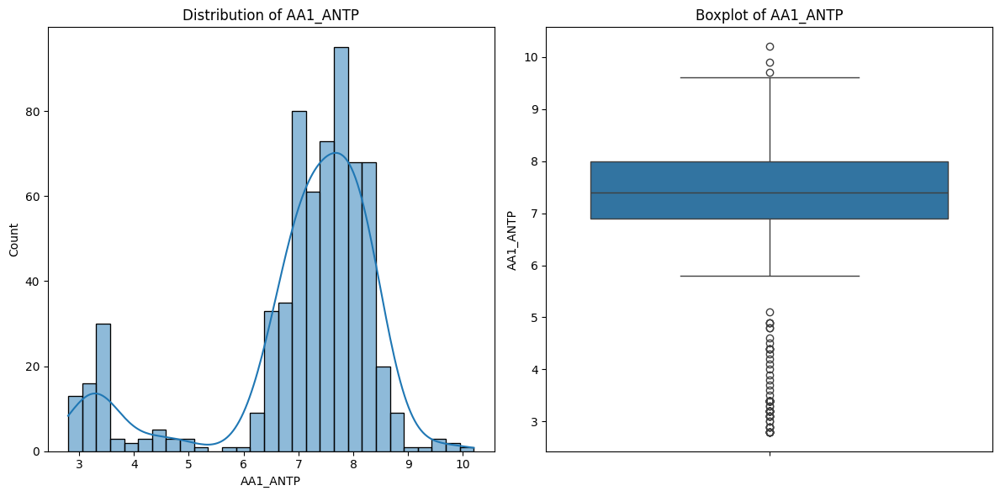


--- Summary Statistics for AA1_C_TE ---
count    640.000000
mean      17.522344
std        4.948215
min        2.600000
25%       18.600000
50%       19.100000
75%       19.500000
max       21.500000
Name: AA1_C_TE, dtype: float64


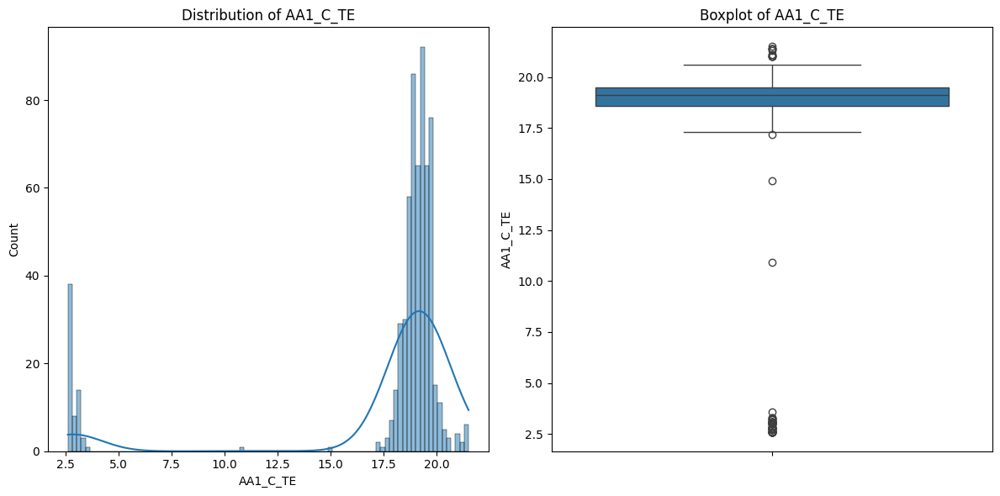


--- Summary Statistics for AA1_FBHT ---
count    640.000000
mean      37.608438
std        2.335470
min       28.800000
25%       38.300000
50%       38.300000
75%       38.400000
max       38.400000
Name: AA1_FBHT, dtype: float64


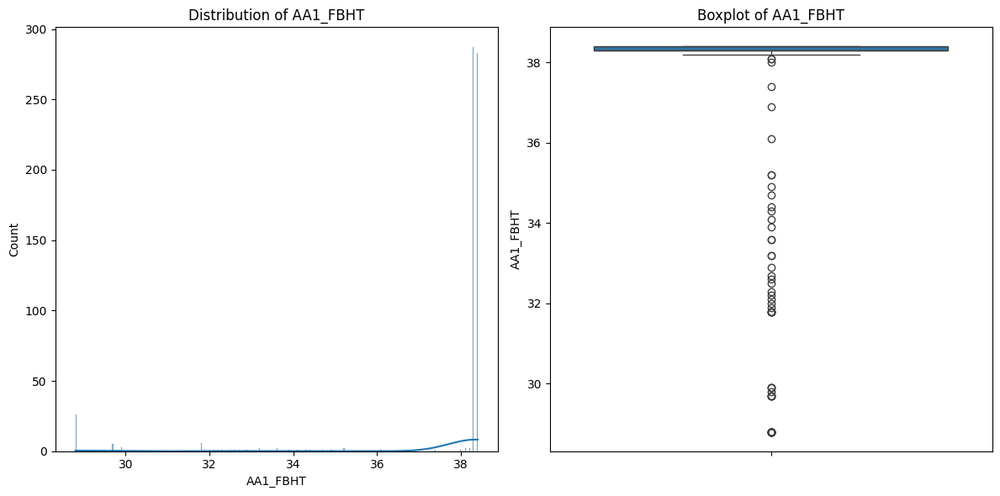


--- Summary Statistics for AA1_C_OP ---
count    640.000000
mean      21.008078
std        1.537974
min        9.620000
25%       20.190000
50%       21.150000
75%       22.120000
max       23.080000
Name: AA1_C_OP, dtype: float64


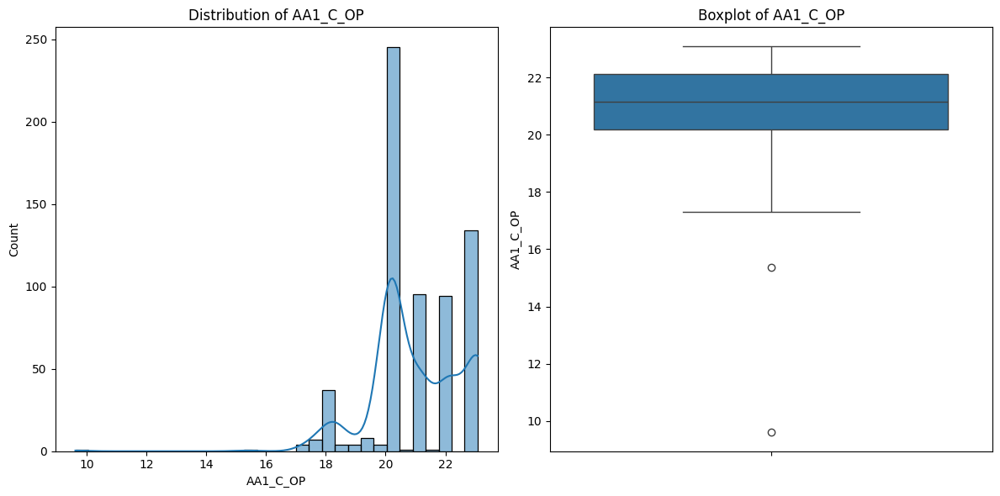


--- Summary Statistics for AA2 ---

--- Summary Statistics for AA2_91_9500062414 ---
count      640.000000
mean       569.717195
std       1193.826819
min          0.050000
25%          1.850000
50%          1.910000
75%       1457.000000
max      22703.000000
Name: AA2_91_9500062414, dtype: float64


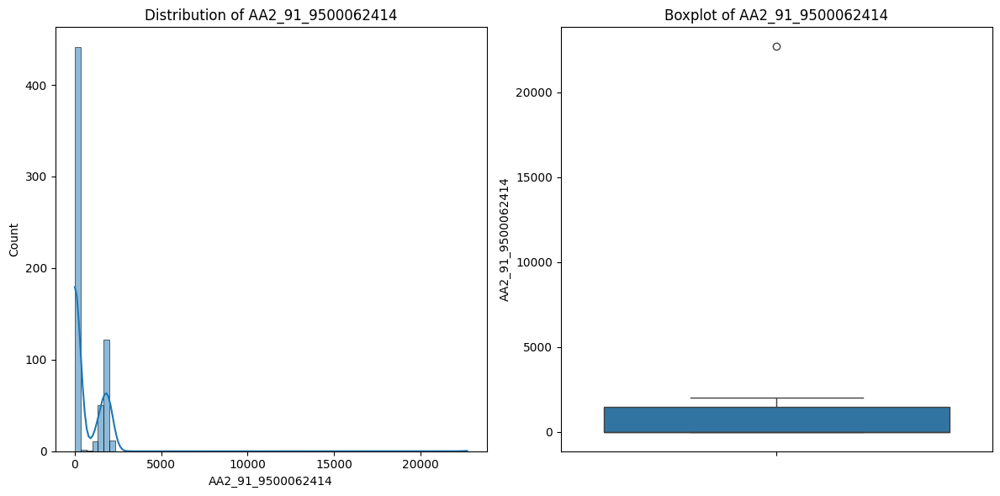


--- Summary Statistics for AA2_91_EP_NATURAL_GAS ---
count     640.000000
mean       13.344957
std       117.303133
min         0.026877
25%         1.056553
50%         1.096910
75%         1.124132
max      1226.000000
Name: AA2_91_EP_NATURAL_GAS, dtype: float64


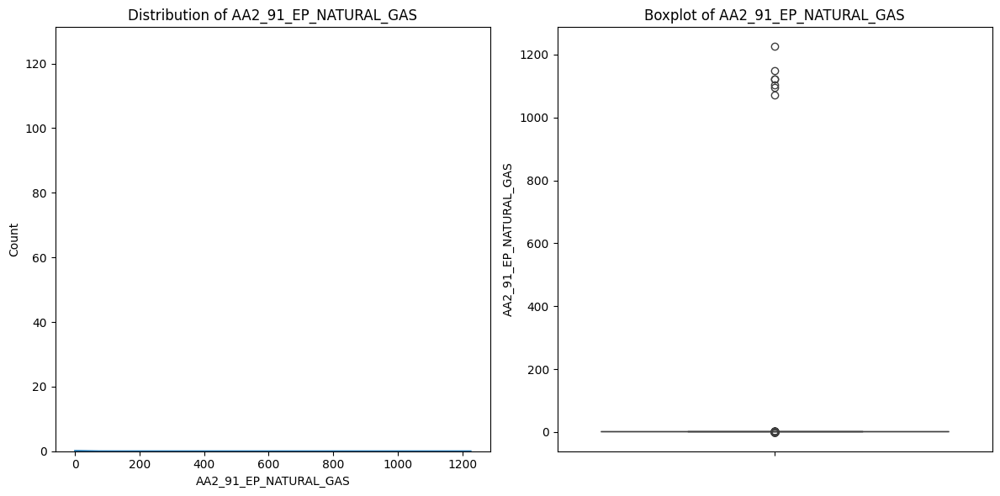


--- Summary Statistics for AA2_ANPR ---
count    640.000000
mean     250.059969
std       23.942075
min      136.110000
25%      237.170000
50%      247.240000
75%      271.552500
max      282.870000
Name: AA2_ANPR, dtype: float64


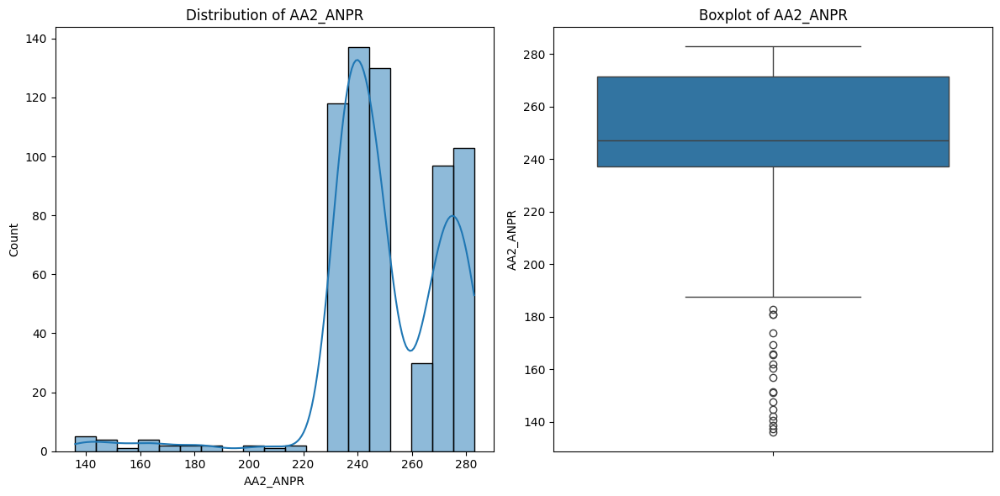


--- Summary Statistics for AA2_C_PR ---
count    640.000000
mean     154.838367
std        6.425726
min      140.740000
25%      151.615000
50%      152.915000
75%      154.232500
max      182.270000
Name: AA2_C_PR, dtype: float64


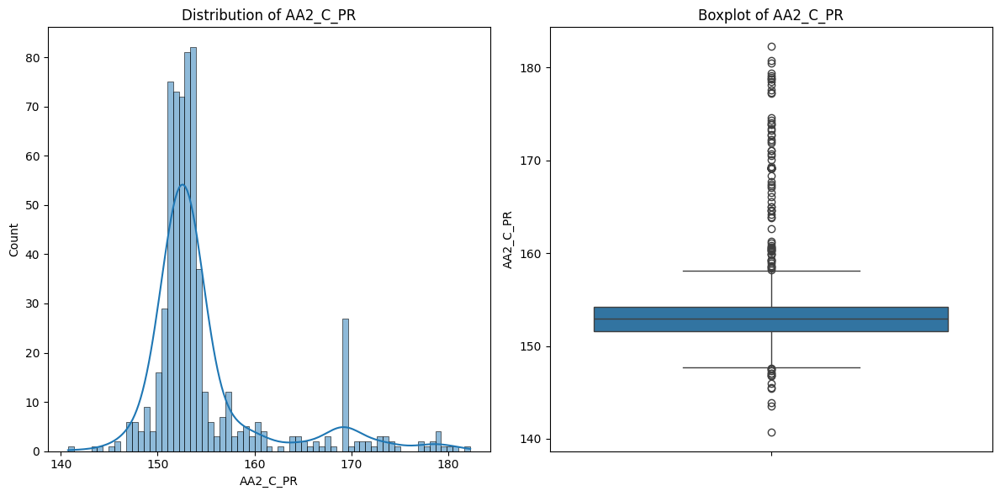


--- Summary Statistics for AA2_FBHP ---
count    640.000000
mean     244.339547
std        8.904108
min      231.010000
25%      236.972500
50%      242.810000
75%      251.567500
max      262.260000
Name: AA2_FBHP, dtype: float64


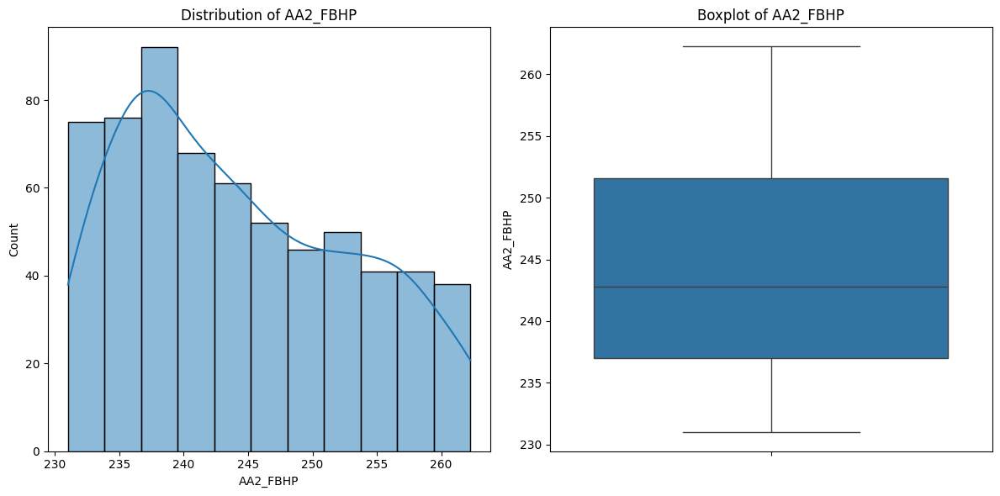


--- Summary Statistics for AA2_ANTP ---
count    640.000000
mean       6.524453
std        1.692305
min        3.500000
25%        4.800000
50%        7.050000
75%        7.900000
max       10.300000
Name: AA2_ANTP, dtype: float64


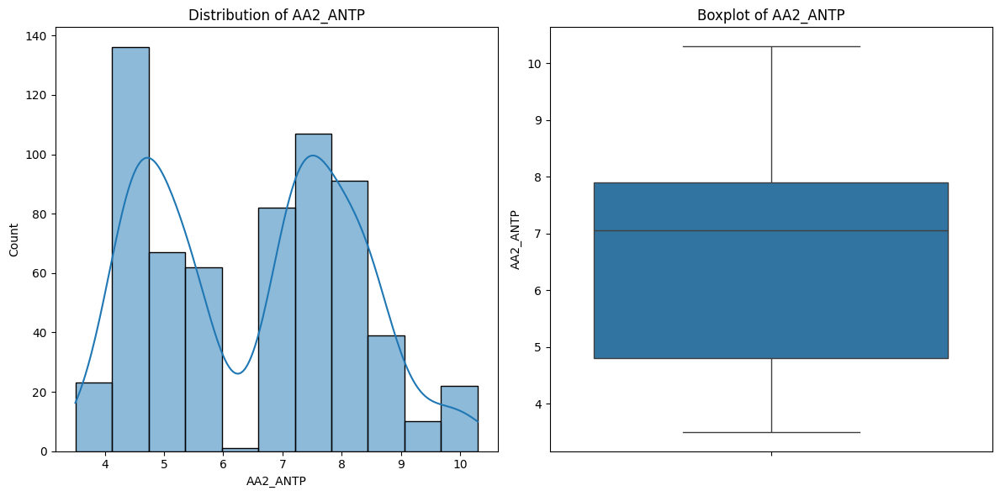


--- Summary Statistics for AA2_C_TE ---
count    640.000000
mean      18.850859
std        3.154232
min        3.000000
25%       18.800000
50%       19.400000
75%       19.900000
max       22.800000
Name: AA2_C_TE, dtype: float64


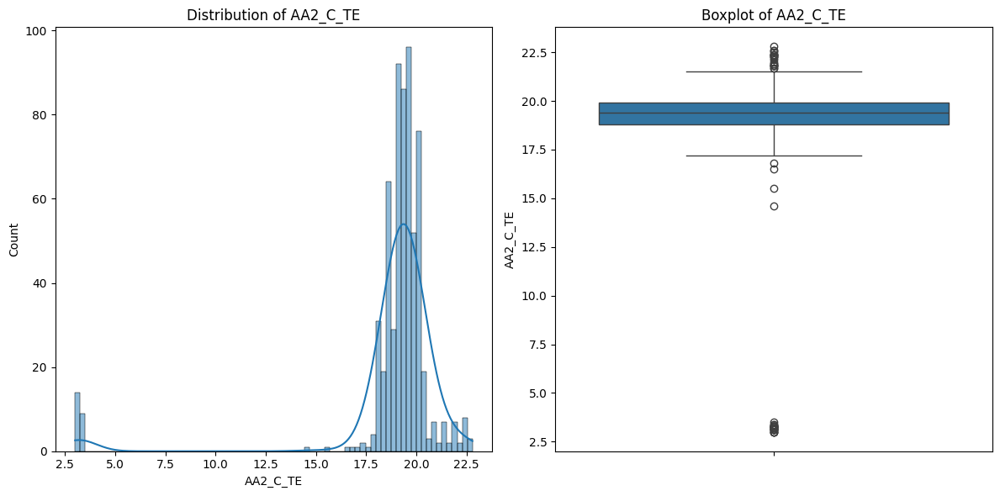


--- Summary Statistics for AA2_FBHT ---
count    640.000000
mean      36.482969
std        0.914382
min       30.000000
25%       36.600000
50%       36.700000
75%       36.700000
max       36.800000
Name: AA2_FBHT, dtype: float64


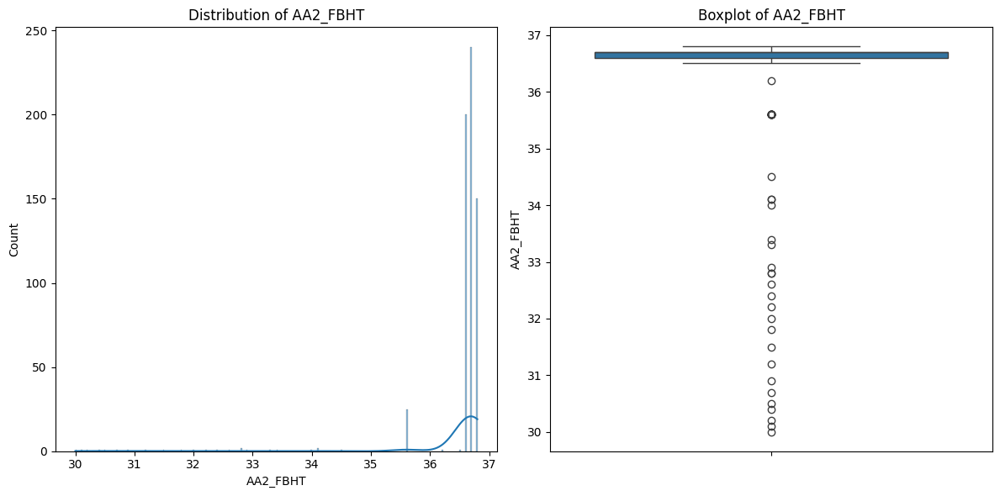


--- Summary Statistics for AA2_C_OP ---
count    640.000000
mean      30.036086
std        3.771458
min        0.970000
25%       28.160000
50%       30.100000
75%       31.555000
max       34.950000
Name: AA2_C_OP, dtype: float64


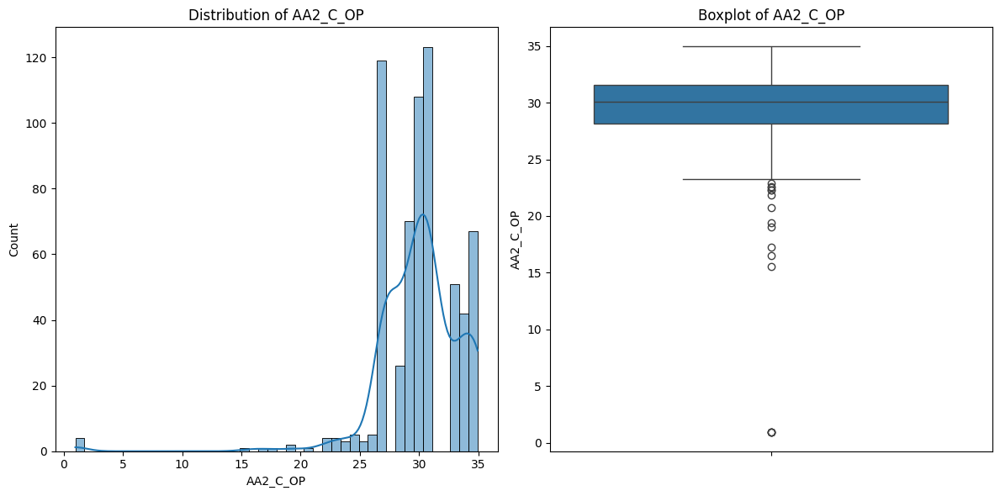


--- Summary Statistics for AA3 ---

--- Summary Statistics for AA3_91_9500062414 ---
count      640.000000
mean       947.059078
std       2028.490128
min          0.880000
25%          2.980000
50%          3.140000
75%       2377.000000
max      39384.000000
Name: AA3_91_9500062414, dtype: float64


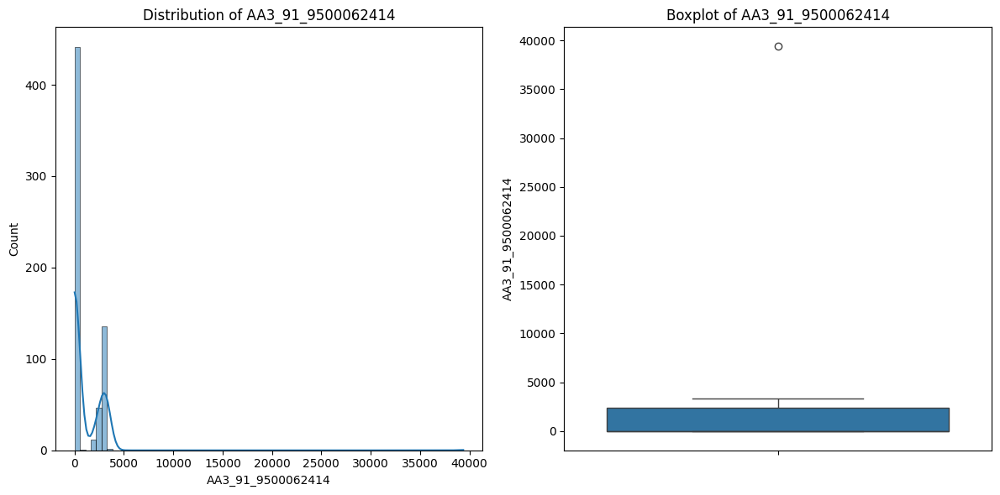


--- Summary Statistics for AA3_91_EP_NATURAL_GAS ---
count     640.000000
mean       15.986894
std       161.646002
min         0.000814
25%         1.733825
50%         1.828840
75%         1.855630
max      1883.000000
Name: AA3_91_EP_NATURAL_GAS, dtype: float64


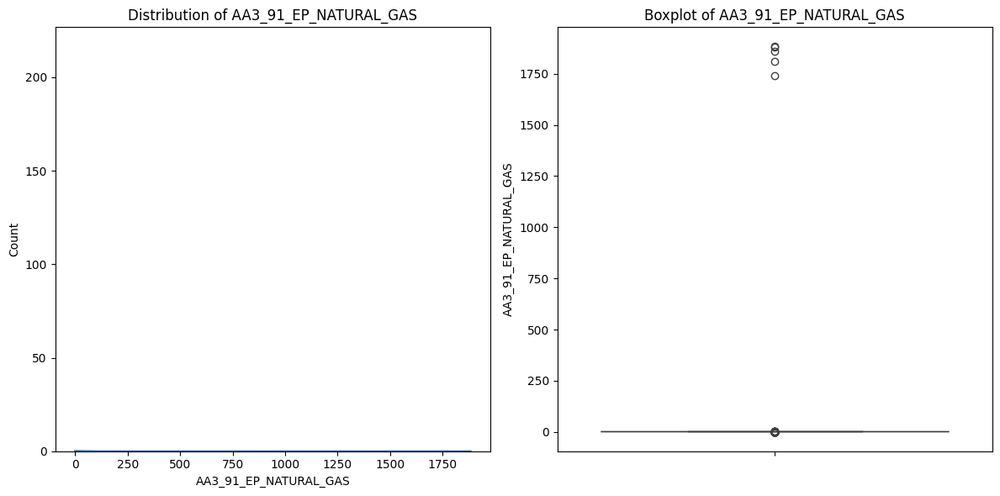


--- Summary Statistics for AA3_ANPR ---
count    640.000000
mean     293.640102
std       18.634736
min      222.890000
25%      282.517500
50%      288.290000
75%      312.320000
max      331.000000
Name: AA3_ANPR, dtype: float64


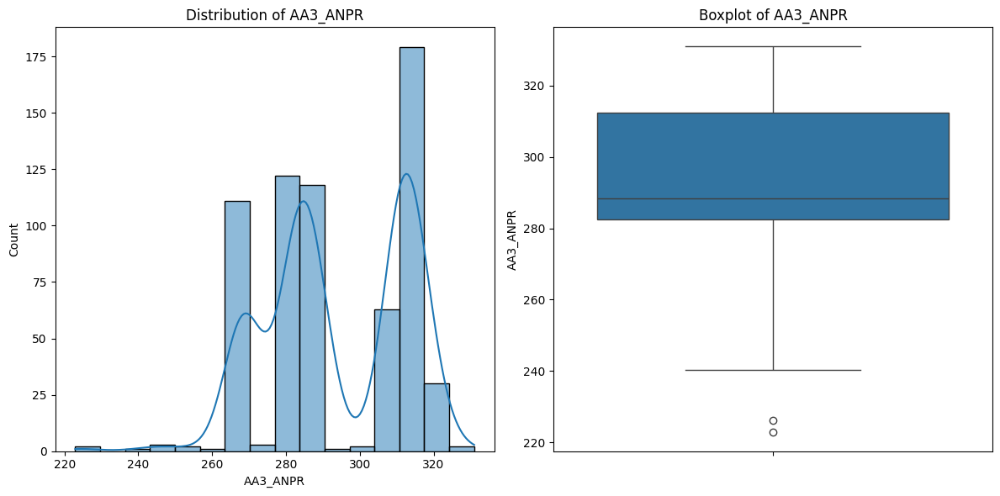


--- Summary Statistics for AA3_C_PR ---
count    640.000000
mean     130.720719
std        5.313043
min      123.180000
25%      128.107500
50%      129.250000
75%      130.112500
max      151.400000
Name: AA3_C_PR, dtype: float64


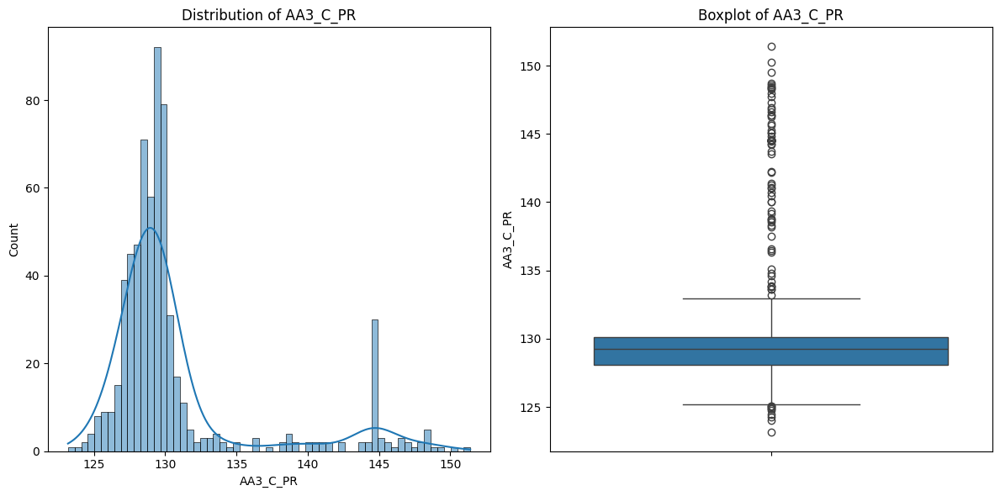


--- Summary Statistics for AA3_FBHP ---
count    640.000000
mean     304.879359
std        8.694263
min      291.270000
25%      297.495000
50%      303.900000
75%      311.337500
max      322.390000
Name: AA3_FBHP, dtype: float64


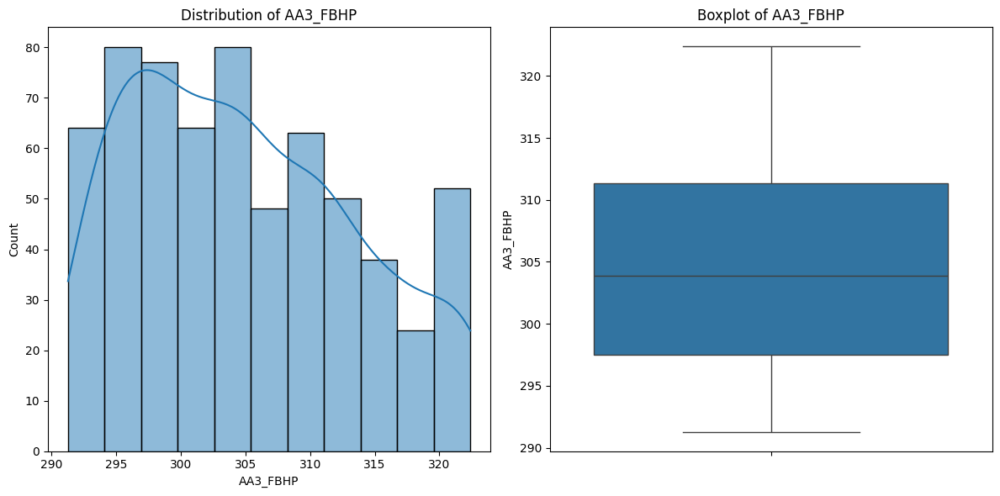


--- Summary Statistics for AA3_ANTP ---
count    640.000000
mean      14.650234
std        2.901599
min        6.100000
25%       13.700000
50%       15.400000
75%       16.625000
max       27.800000
Name: AA3_ANTP, dtype: float64


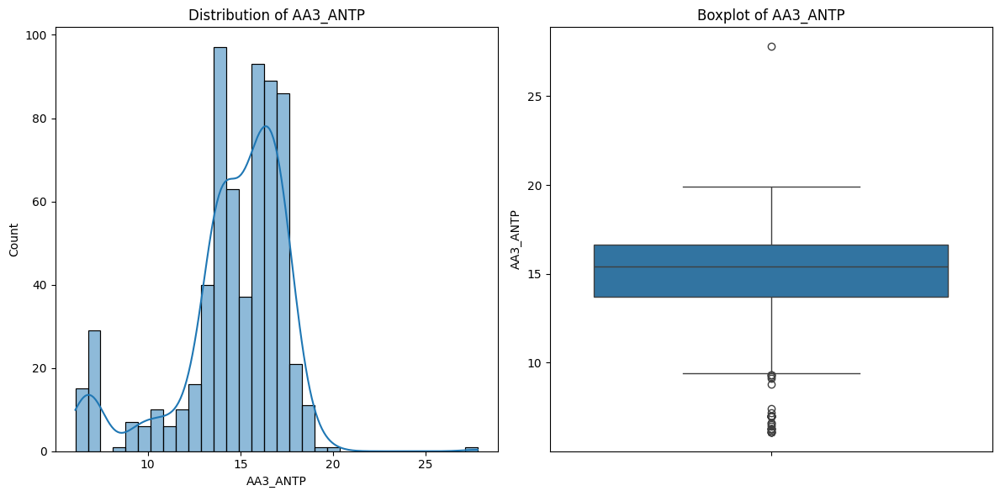


--- Summary Statistics for AA3_C_TE ---
count    640.000000
mean      56.219844
std       12.381099
min        5.100000
25%       58.800000
50%       59.900000
75%       60.300000
max       61.200000
Name: AA3_C_TE, dtype: float64


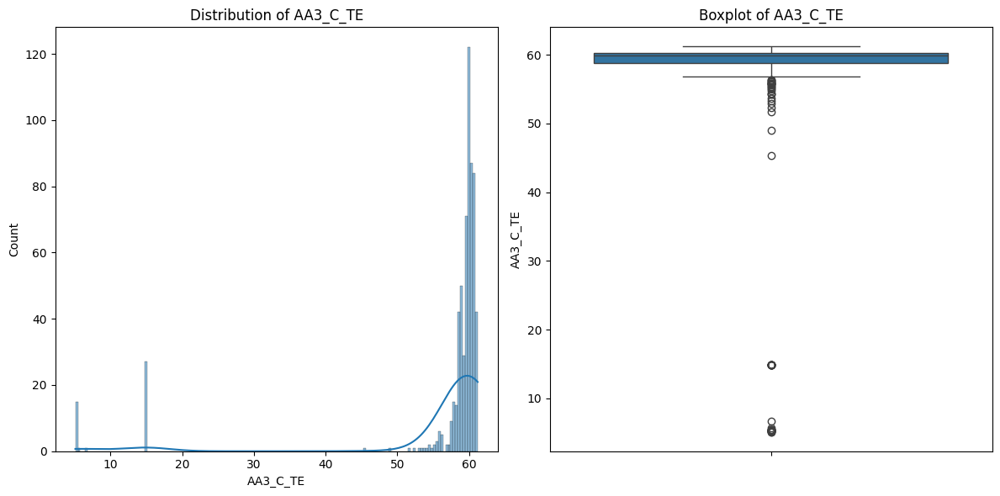


--- Summary Statistics for AA3_FBHT ---
count    640.000000
mean      92.716406
std        0.350358
min       89.900000
25%       92.700000
50%       92.800000
75%       92.800000
max       93.000000
Name: AA3_FBHT, dtype: float64


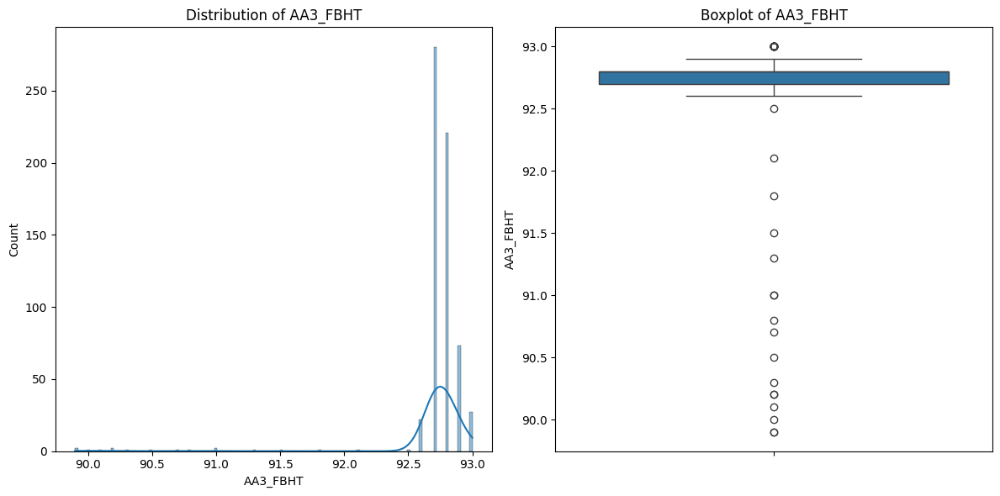


--- Summary Statistics for AA3_C_OP ---
count    640.000000
mean      37.180391
std        6.680646
min        4.810000
25%       37.500000
50%       39.420000
75%       40.380000
max       42.310000
Name: AA3_C_OP, dtype: float64


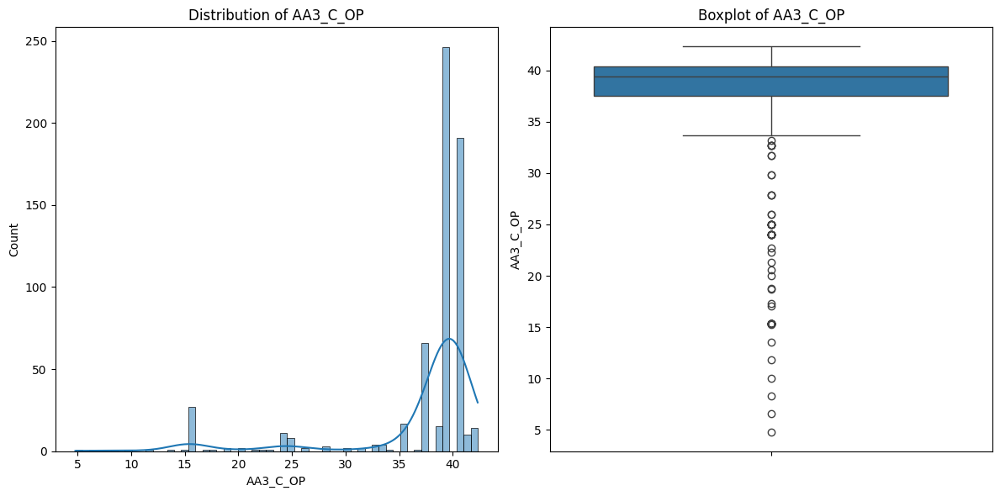


--- Summary Statistics for AA4 ---

--- Summary Statistics for AA4_91_9500062414 ---
count     640.000000
mean      579.550391
std       875.699018
min         0.850000
25%         2.070000
50%         2.140000
75%      1618.000000
max      2222.000000
Name: AA4_91_9500062414, dtype: float64


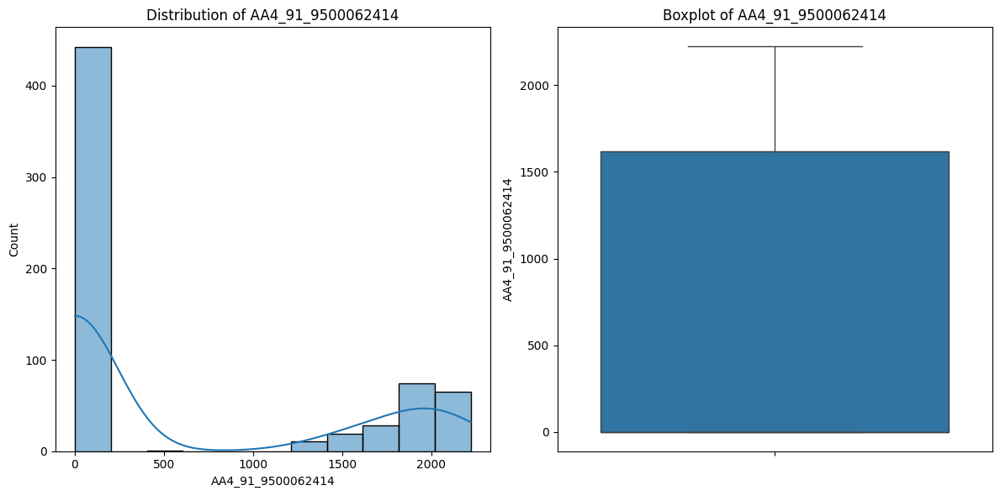


--- Summary Statistics for AA4_91_EP_NATURAL_GAS ---
count     640.000000
mean       14.419067
std       126.627700
min         0.127751
25%         1.136005
50%         1.217240
75%         1.242620
max      1286.000000
Name: AA4_91_EP_NATURAL_GAS, dtype: float64


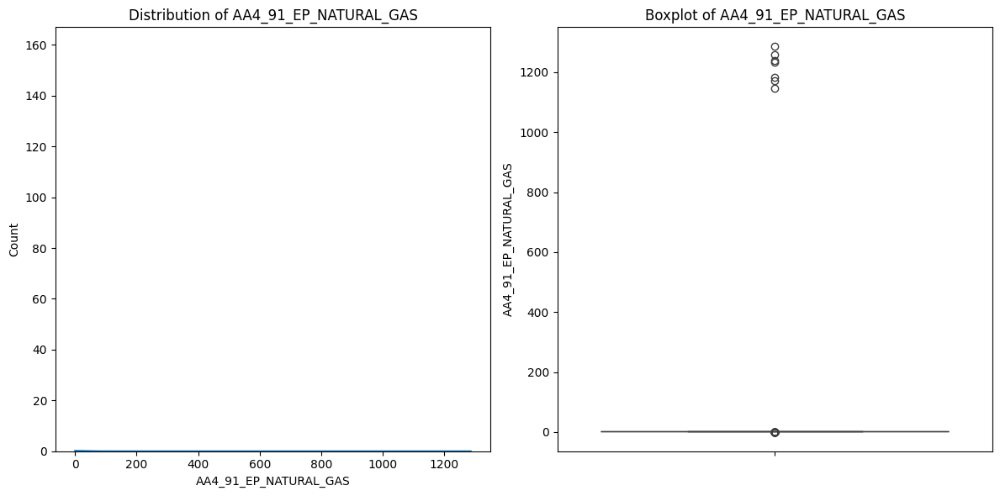


--- Summary Statistics for AA4_ANPR ---
count    640.000000
mean     212.331305
std       34.545049
min      175.600000
25%      179.180000
50%      221.245000
75%      244.545000
max      271.920000
Name: AA4_ANPR, dtype: float64


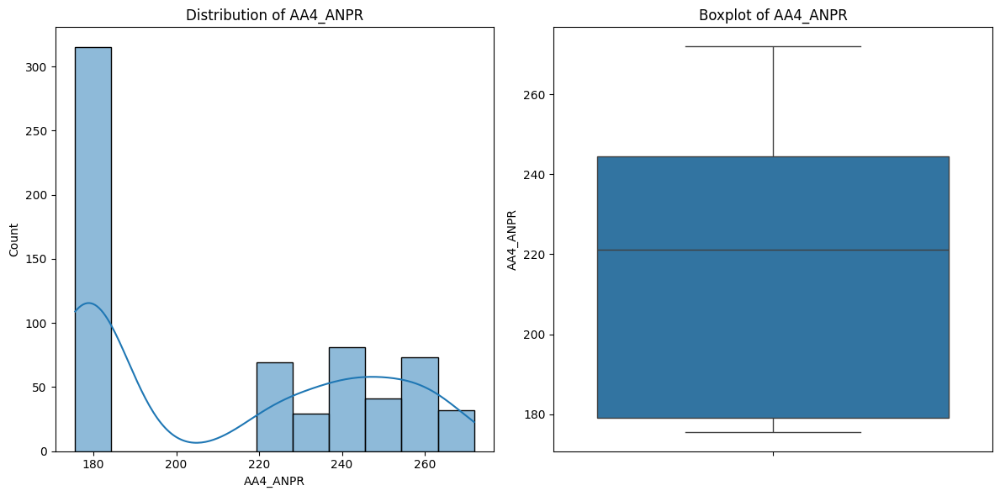


--- Summary Statistics for AA4_C_PR ---
count    640.000000
mean     142.776430
std        5.923521
min      133.120000
25%      139.987500
50%      141.105000
75%      142.052500
max      164.650000
Name: AA4_C_PR, dtype: float64


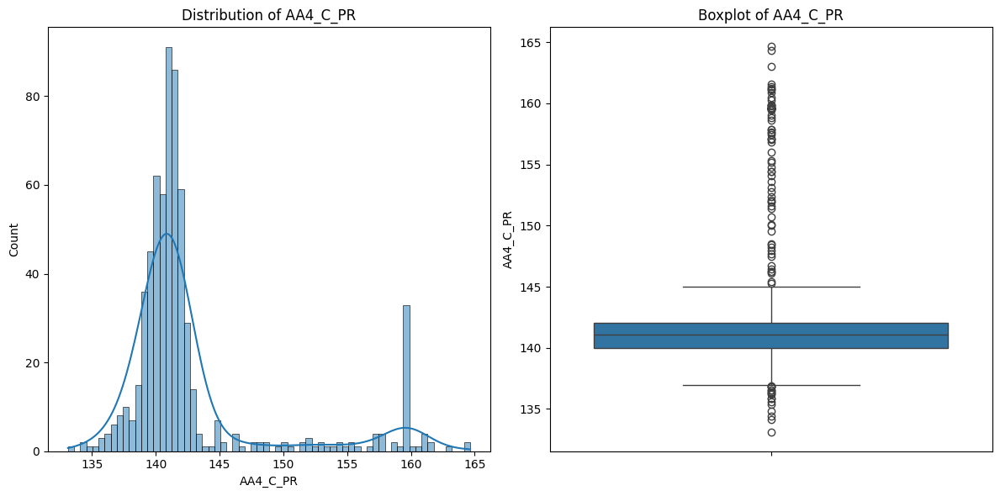


--- Summary Statistics for AA4_FBHP ---
count    640.000000
mean     236.488547
std        9.069887
min      220.730000
25%      228.867500
50%      237.375000
75%      242.997500
max      254.810000
Name: AA4_FBHP, dtype: float64


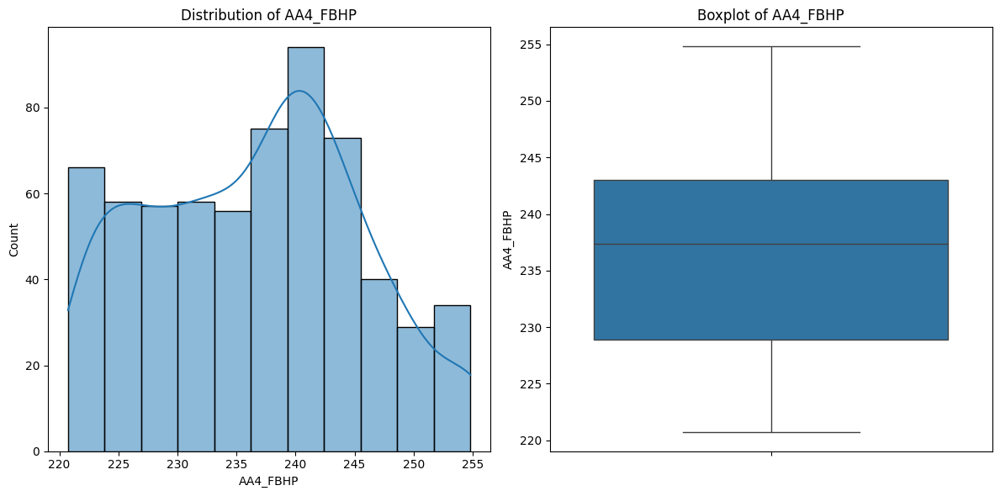


--- Summary Statistics for AA4_ANTP ---
count    640.000000
mean      10.963750
std        2.916388
min        4.100000
25%       10.700000
50%       11.400000
75%       13.100000
max       18.100000
Name: AA4_ANTP, dtype: float64


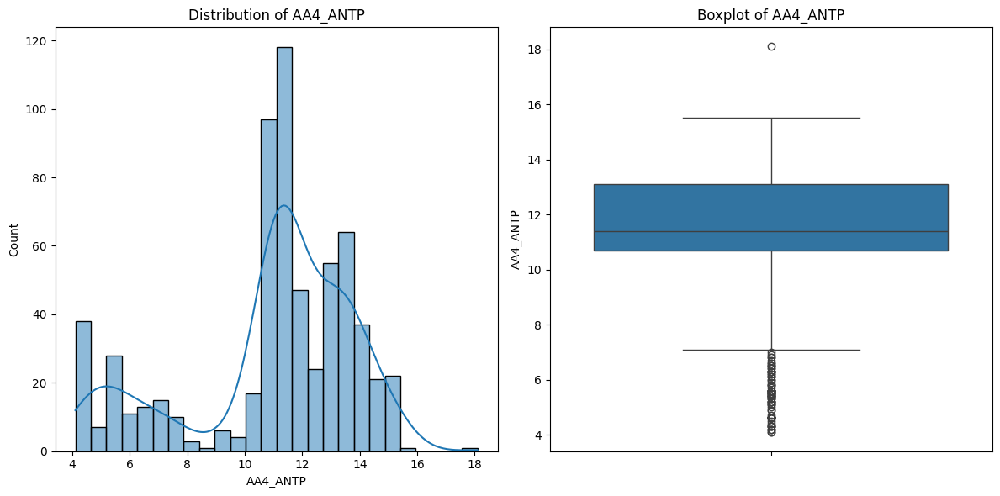


--- Summary Statistics for AA4_C_TE ---
count    640.000000
mean      26.895000
std        5.735318
min        1.300000
25%       27.700000
50%       28.400000
75%       28.900000
max       30.500000
Name: AA4_C_TE, dtype: float64


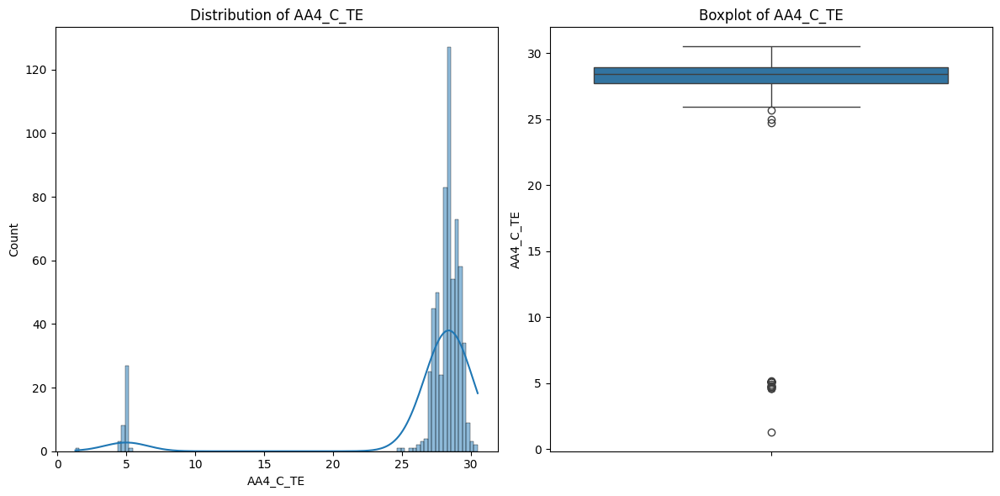


--- Summary Statistics for AA4_FBHT ---
count    640.000000
mean      47.575156
std        2.327241
min       37.200000
25%       48.000000
50%       48.100000
75%       48.300000
max       48.400000
Name: AA4_FBHT, dtype: float64


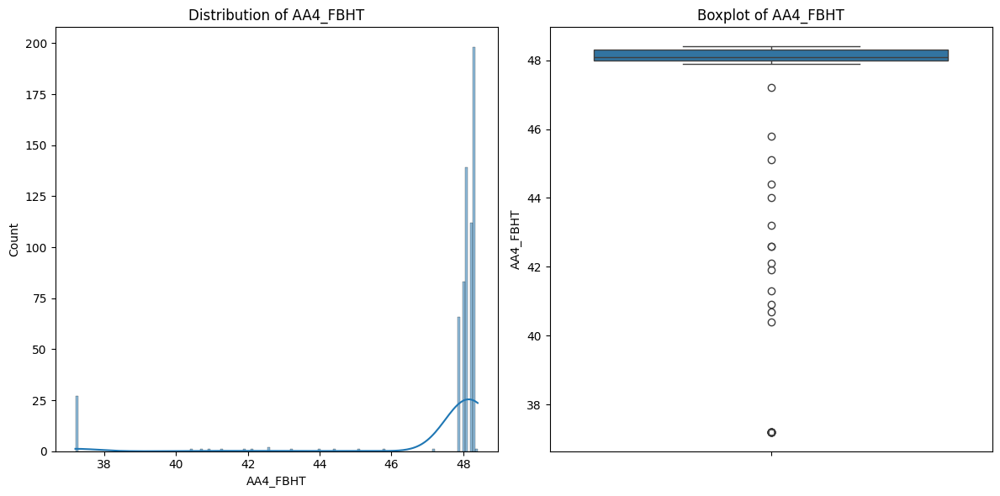


--- Summary Statistics for AA4_C_OP ---
count    640.000000
mean      33.245797
std        3.023950
min       20.950000
25%       34.290000
50%       34.290000
75%       34.290000
max       35.240000
Name: AA4_C_OP, dtype: float64


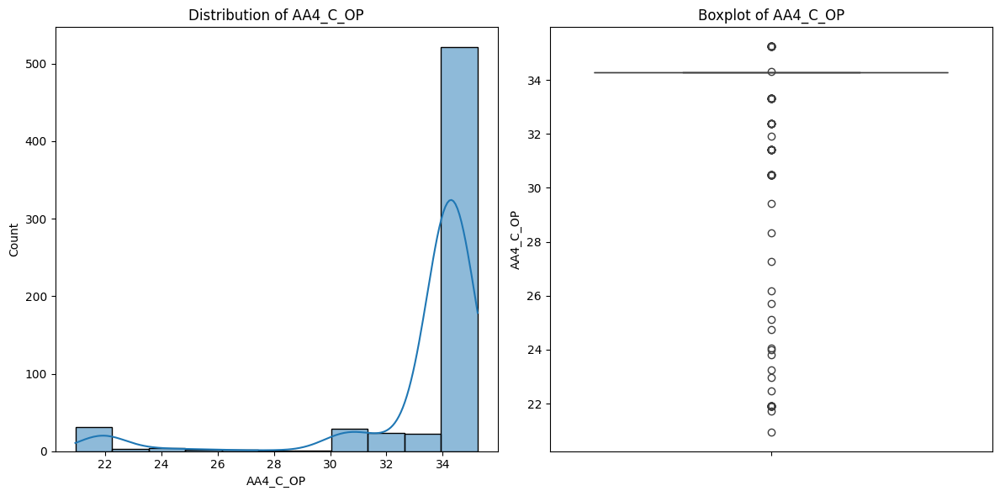


--- Summary Statistics for AA5 ---

--- Summary Statistics for AA5_91_9500062414 ---
count      640.000000
mean       687.072094
std       1531.753988
min          0.130000
25%          2.140000
50%          2.190000
75%       1578.000000
max      30604.000000
Name: AA5_91_9500062414, dtype: float64


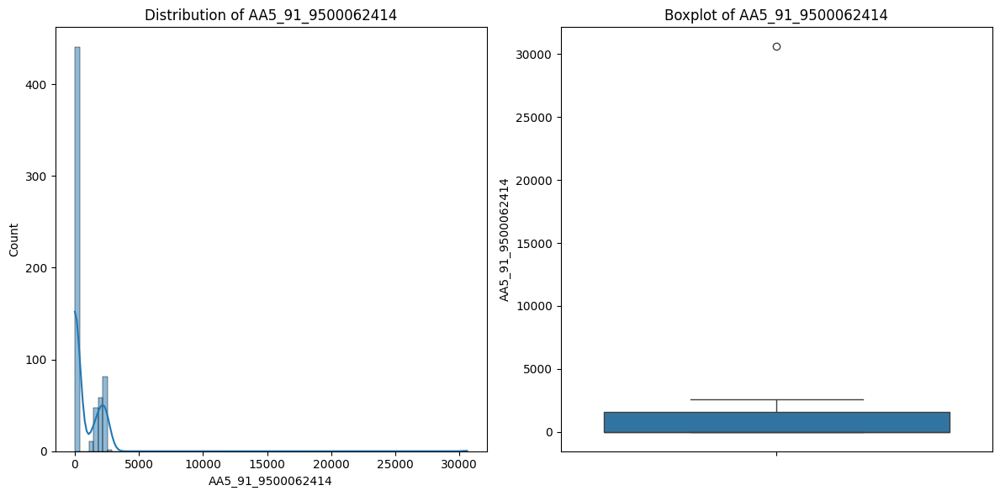


--- Summary Statistics for AA5_91_EP_NATURAL_GAS ---
count     640.000000
mean        8.940674
std        98.089768
min         0.076988
25%         1.206420
50%         1.245645
75%         1.410743
max      1443.000000
Name: AA5_91_EP_NATURAL_GAS, dtype: float64


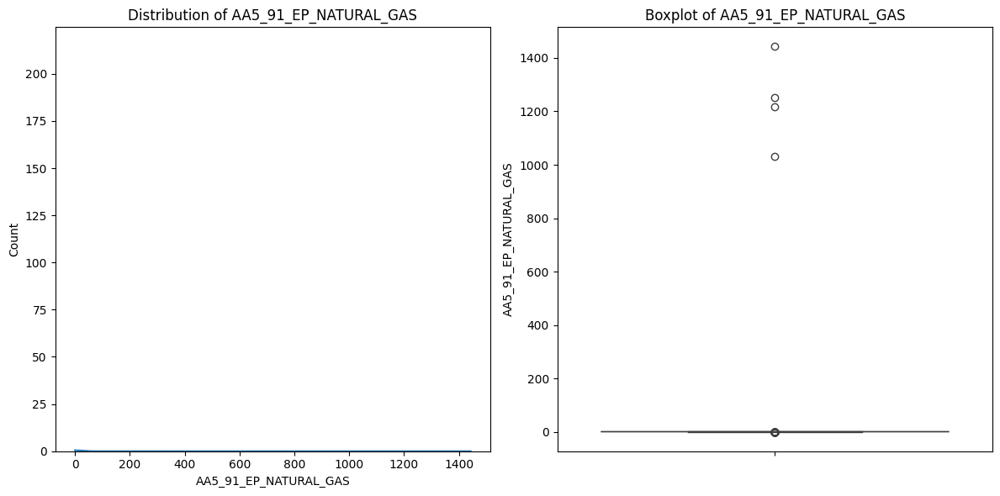


--- Summary Statistics for AA5_ANPR ---
count    640.000000
mean     237.353687
std       11.268865
min      171.140000
25%      231.552500
50%      236.070000
75%      240.580000
max      271.050000
Name: AA5_ANPR, dtype: float64


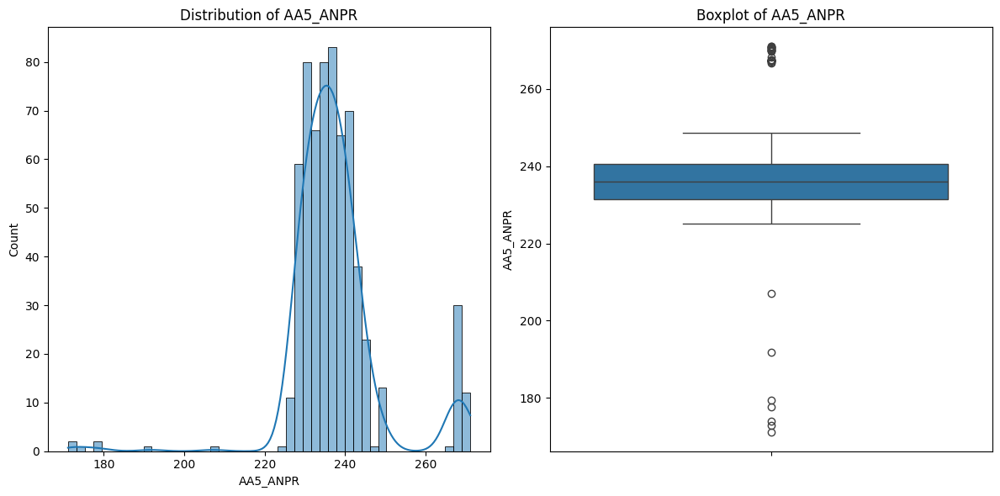


--- Summary Statistics for AA5_C_PR ---
count    640.000000
mean     149.760914
std        6.626417
min      136.810000
25%      146.397500
50%      147.635000
75%      149.700000
max      176.090000
Name: AA5_C_PR, dtype: float64


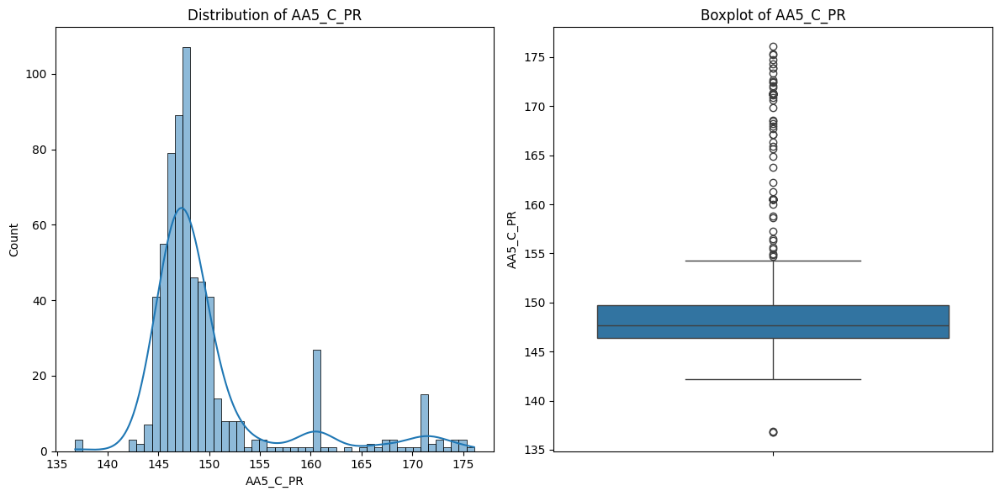


--- Summary Statistics for AA5_FBHP ---
count    640.000000
mean     244.242656
std        5.872981
min      234.630000
25%      239.210000
50%      243.895000
75%      248.537500
max      255.620000
Name: AA5_FBHP, dtype: float64


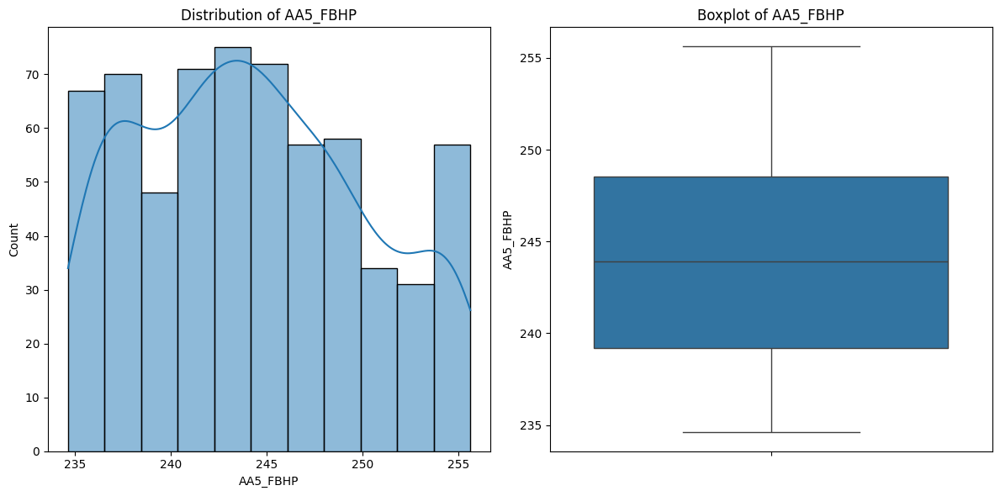


--- Summary Statistics for AA5_ANTP ---
count    640.000000
mean       5.824688
std        0.631775
min        3.000000
25%        5.700000
50%        5.900000
75%        6.200000
max        7.700000
Name: AA5_ANTP, dtype: float64


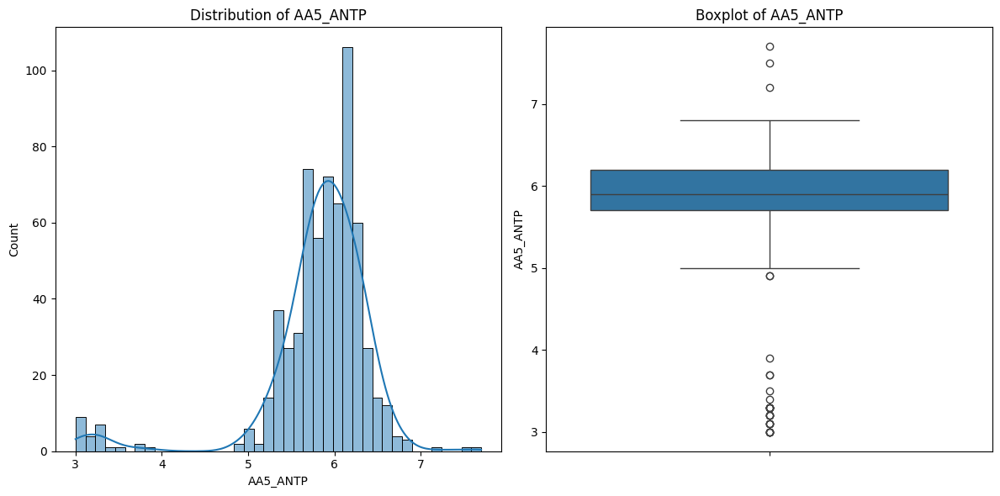


--- Summary Statistics for AA5_C_TE ---
count    640.000000
mean      11.346641
std        1.861747
min        2.700000
25%       11.000000
50%       11.300000
75%       12.200000
max       15.800000
Name: AA5_C_TE, dtype: float64


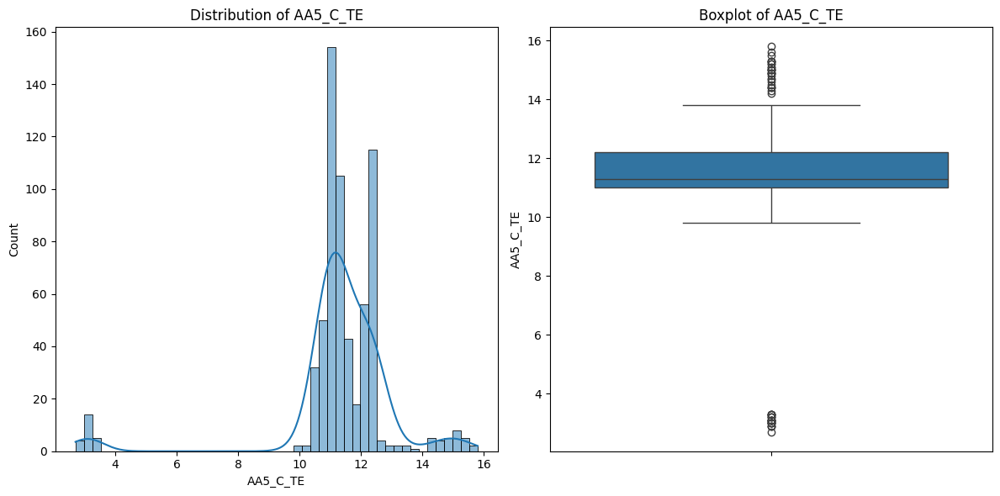


--- Summary Statistics for AA5_FBHT ---
count    640.000000
mean      28.884531
std        1.014339
min       21.600000
25%       29.000000
50%       29.100000
75%       29.100000
max       29.200000
Name: AA5_FBHT, dtype: float64


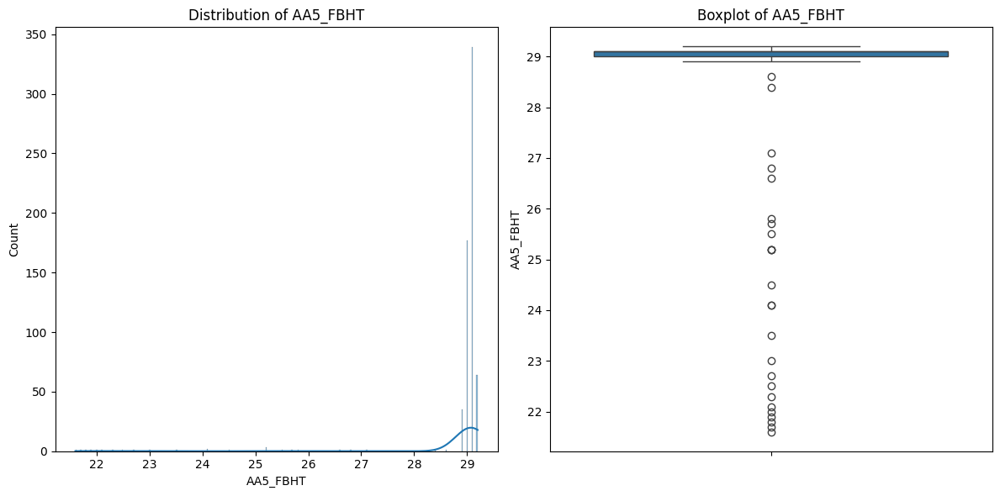


--- Summary Statistics for AA5_C_OP ---
count    640.000000
mean      30.583797
std        2.993461
min       17.310000
25%       28.850000
50%       29.810000
75%       33.650000
max       34.620000
Name: AA5_C_OP, dtype: float64


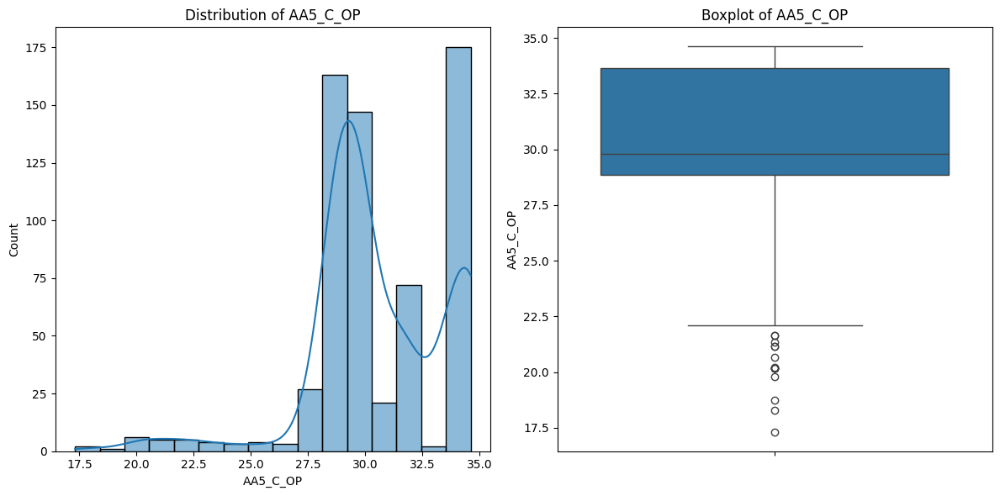

In [ ]:
# Key variables for each well
key_variables = ['91_9500062414', '91_EP_NATURAL_GAS', 'ANPR', 'C_PR', 'FBHP', 'ANTP', 'C_TE', 'FBHT', 'C_OP']

# Iterate through each well
for well in ['AA1', 'AA2', 'AA3', 'AA4', 'AA5']:
    print(f"\n--- Summary Statistics for {well} ---")
    for var in key_variables:
        column_name = f'{well}_{var}'
        print(f"\n--- Summary Statistics for {column_name} ---")
        print(df[column_name].describe())
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        sns.histplot(df[column_name], kde=True)
        plt.title(f'Distribution of {column_name}')
        plt.subplot(1, 2, 2)
        sns.boxplot(y=df[column_name])
        plt.title(f'Boxplot of {column_name}')
        plt.tight_layout()
        plt.show()

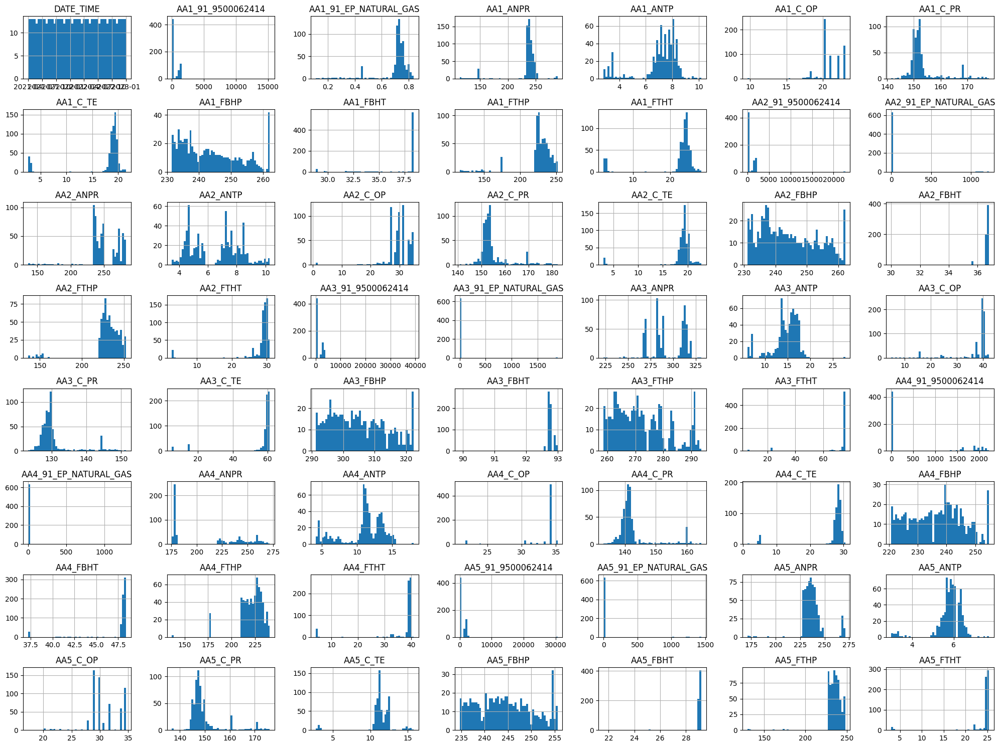

In [ ]:
# prompt: buatkan aku grafik histogram untuk semua kolom

df.hist(bins=50, figsize=(20, 15))
plt.tight_layout()
plt.show()


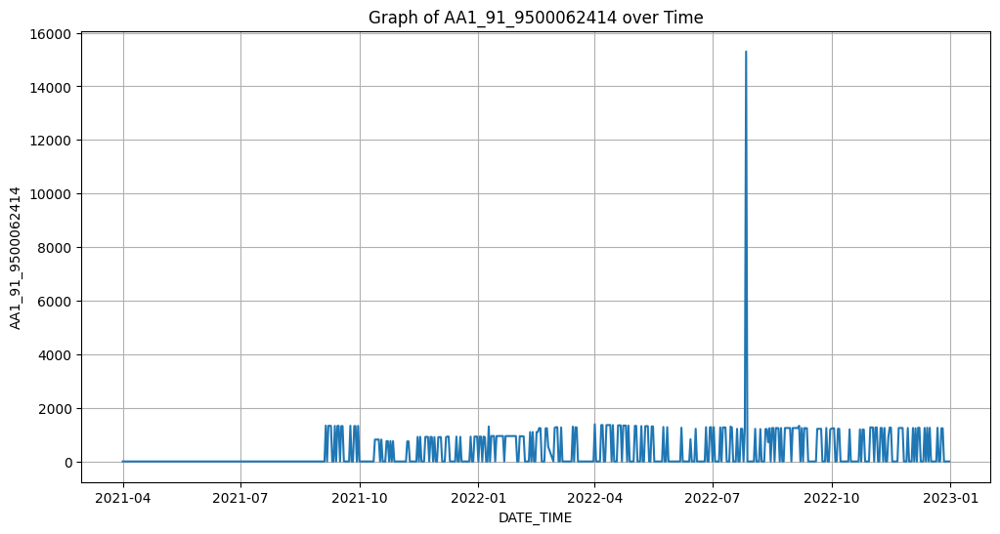

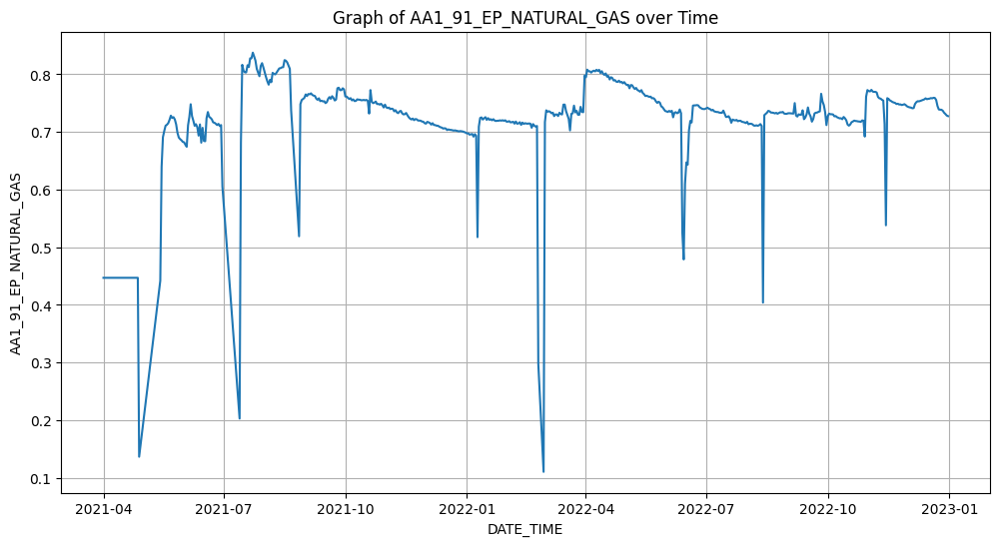

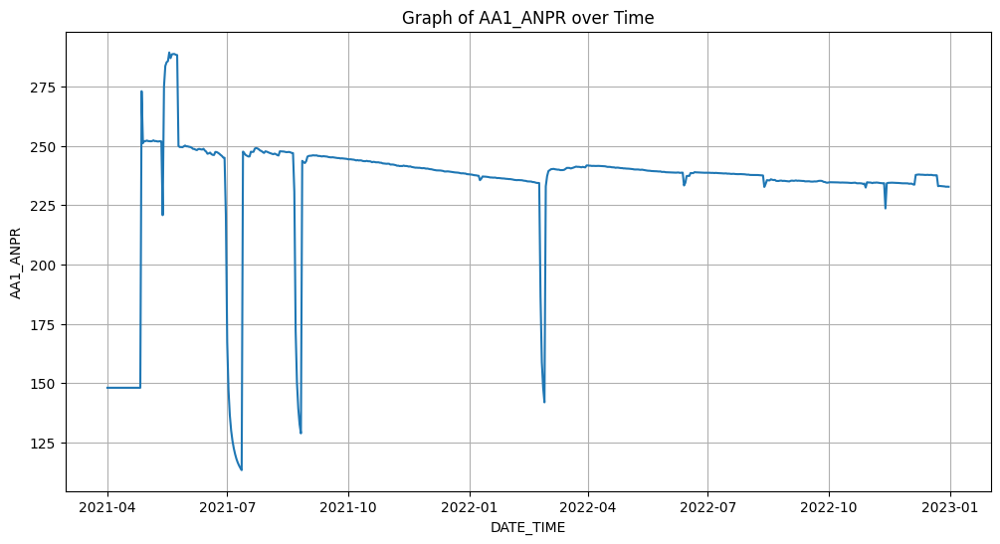

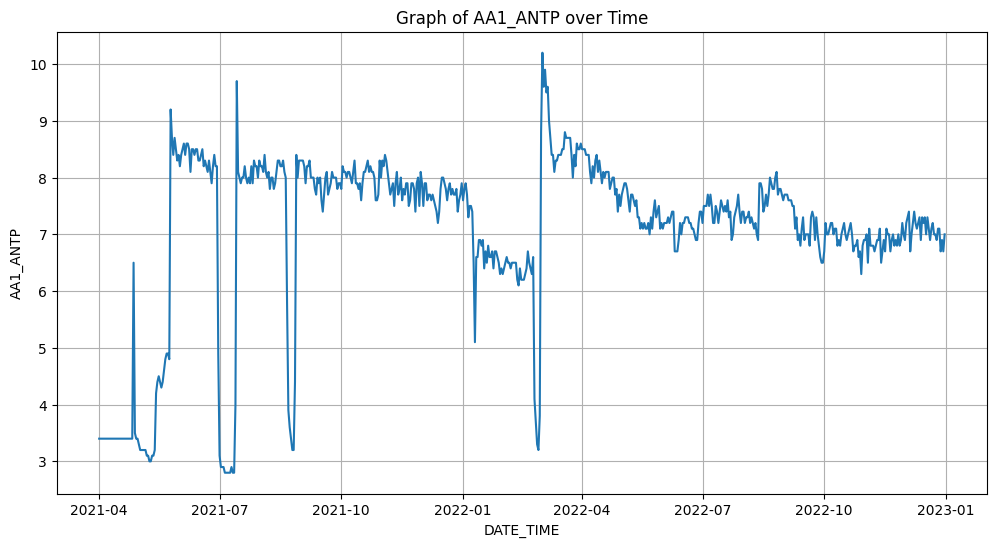

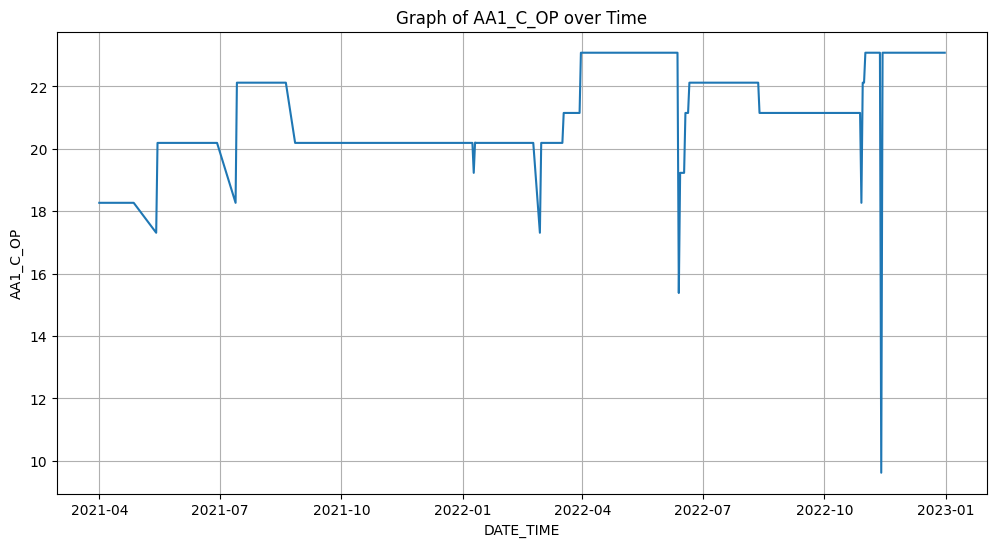

...

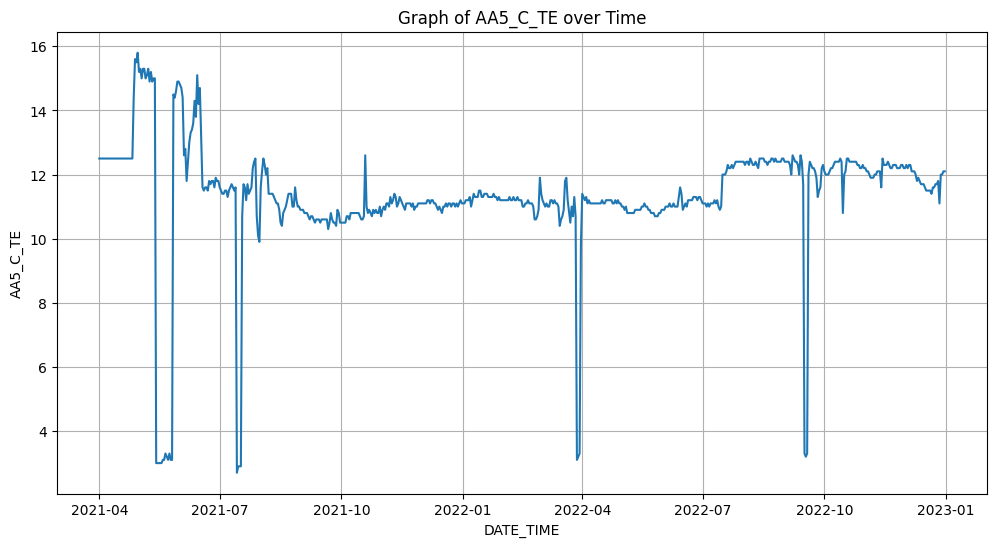

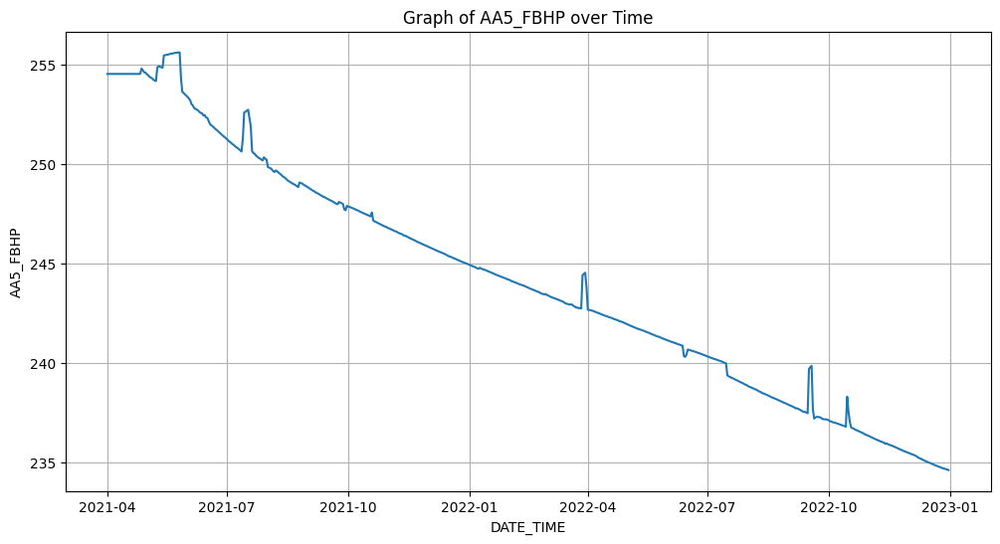

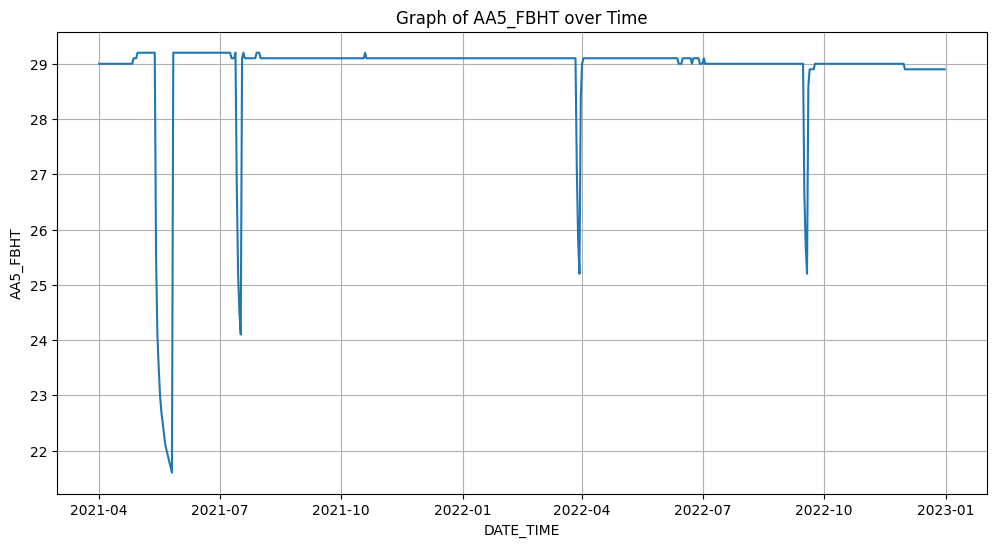

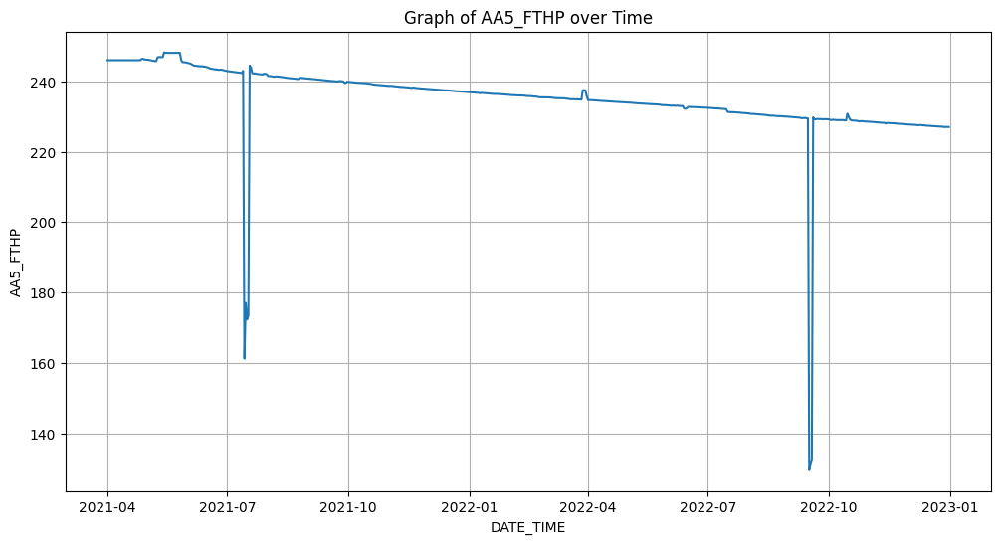

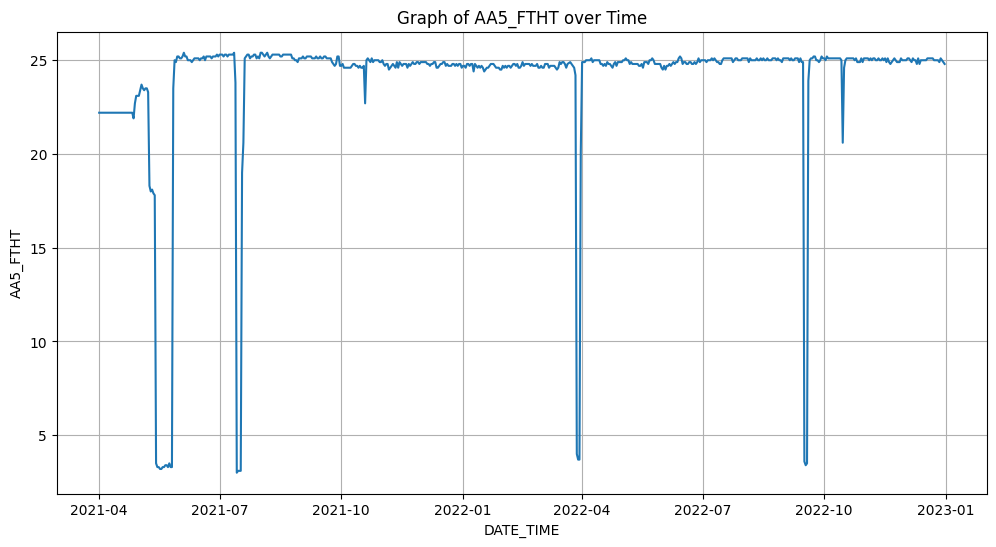

In [ ]:
# prompt: buat grafik berdasarkan waktunya ("DATE_TIME") untuk semua kolom

# Buat grafik berdasarkan waktu untuk semua kolom numerik
numerical_cols = df.select_dtypes(include=np.number).columns

for col in numerical_cols:
    plt.figure(figsize=(12, 6))
    plt.plot(df['DATE_TIME'], df[col])
    plt.title(f'Graph of {col} over Time')
    plt.xlabel('DATE_TIME')
    plt.ylabel(col)
    plt.grid(True)
    plt.show()


In [ ]:
# prompt: Hapus untuk semua kolom yang masih masuk ke outlier di boxplot
key_variables = ['91_9500062414', '91_EP_NATURAL_GAS', 'ANPR', 'C_PR', 'FBHP', 'ANTP', 'C_TE', 'FBHT', 'C_OP']

# Function to remove outliers using IQR
def remove_outliers_iqr(df, columns):
    for col in columns:
        if df[col].dtype in ['int64', 'float64']:
            Q1 = df[col].quantile(0.25)
            Q3 = df[col].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]
    return df

# Get numerical columns excluding DATE_TIME
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Remove outliers from the DataFrame based on the key variables for each well
for well in ['AA1', 'AA2', 'AA3', 'AA4', 'AA5']:
    print(f"Removing outliers for well: {well}")
    well_cols = [f'{well}_{var}' for var in key_variables if f'{well}_{var}' in numerical_cols]
    df = remove_outliers_iqr(df, well_cols)

print("\nShape after removing outliers based on key variables:", df.shape)
print("\nSample of data after removing outliers:")
print(df.head())

Removing outliers for well: AA1
Removing outliers for well: AA2
Removing outliers for well: AA3
Removing outliers for well: AA4
Removing outliers for well: AA5

Shape after removing outliers based on key variables: (171, 56)

Sample of data after removing outliers:
     DATE_TIME  AA1_91_9500062414  AA1_91_EP_NATURAL_GAS  AA1_ANPR  AA1_ANTP  \
227 2021-11-14               0.93               0.730324    241.46       7.8   
228 2021-11-15             919.00               0.730820    241.36       8.0   
229 2021-11-16               0.92               0.732891    241.20       7.6   
230 2021-11-17             921.00               0.728831    241.30       7.8   
231 2021-11-18               0.92               0.725368    241.07       7.7   

     AA1_C_OP  AA1_C_PR  AA1_C_TE  AA1_FBHP  AA1_FBHT  ...  \
227     20.19    152.89      19.0    246.30      38.4  ...   
228     20.19    152.24      18.9    246.24      38.4  ...   
229     20.19    152.00      18.7    246.19      38.4  ...   
230  

In [ ]:
df.shape

(171, 56)

In [ ]:
# prompt: lalu isi nilai outlier yang telah dihapus menggunakan metode interpolasi hingga jumlah barisnya sama dengan data sebelumnya

# The shape of the original DataFrame is 640 rows.
original_shape = 640

# Reindex the DataFrame after outlier removal to restore the original index range.
# This creates NaNs where rows were removed.
df_reindexed = df_cleaned.reindex(range(original_shape))

# Interpolate the missing values (NaNs) created by reindexing.
# This fills the gaps using linear interpolation.
df_interpolated = df_reindexed.interpolate(method='linear', limit_direction='both')

print(f"Shape after interpolation: {df_interpolated.shape}")
print("\nMissing values after interpolation:", df_interpolated.isnull().sum().sum())
print("\nSample of data after interpolation:")
print(df_interpolated.head())

# Now df_interpolated has the same number of rows as the original df (640)
# and the removed outlier values have been replaced by interpolated values.


Shape after interpolation: (640, 56)

Missing values after interpolation: 0

Sample of data after interpolation:
   DATE_TIME  AA1_91_9500062414  AA1_91_EP_NATURAL_GAS  AA1_ANPR  AA1_ANTP  \
0 2021-07-29                0.0                0.81439    246.95       8.2   
1 2021-07-29                0.0                0.81439    246.95       8.2   
2 2021-07-29                0.0                0.81439    246.95       8.2   
3 2021-07-29                0.0                0.81439    246.95       8.2   
4 2021-07-29                0.0                0.81439    246.95       8.2   

   AA1_C_OP  AA1_C_PR  AA1_C_TE  AA1_FBHP  AA1_FBHT  ...  \
0     22.12    150.75      18.1    253.02      38.4  ...   
1     22.12    150.75      18.1    253.02      38.4  ...   
2     22.12    150.75      18.1    253.02      38.4  ...   
3     22.12    150.75      18.1    253.02      38.4  ...   
4     22.12    150.75      18.1    253.02      38.4  ...   

   AA5_91_EP_NATURAL_GAS  AA5_ANPR  AA5_ANTP  AA5_C_OP  A


--- Summary Statistics for AA1 ---

--- Summary Statistics for AA1_91_9500062414 ---
count     171.000000
mean      448.057661
std       557.834635
min         0.910000
25%         1.250000
50%         1.330000
75%       949.000000
max      1361.000000
Name: AA1_91_9500062414, dtype: float64


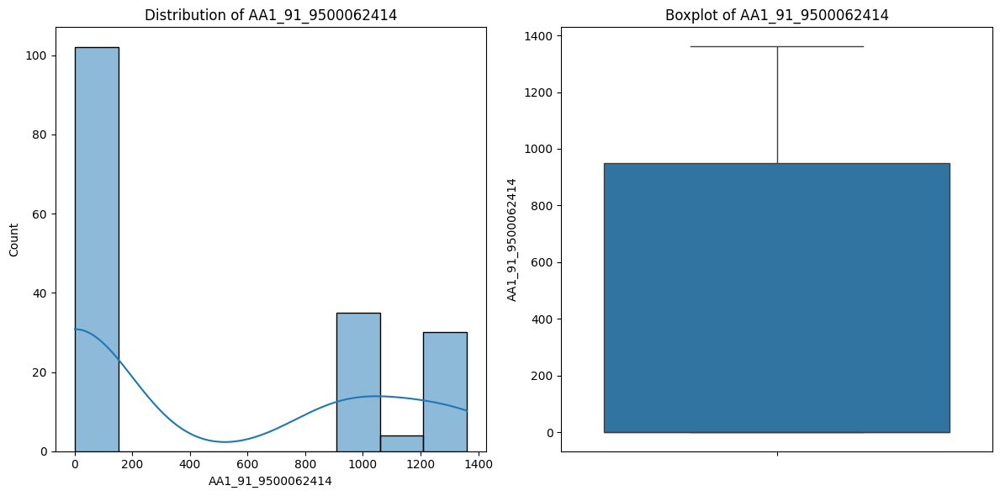


--- Summary Statistics for AA1_91_EP_NATURAL_GAS ---
count    171.000000
mean       0.739988
std        0.032675
min        0.691845
25%        0.715805
50%        0.727427
75%        0.764096
max        0.808015
Name: AA1_91_EP_NATURAL_GAS, dtype: float64


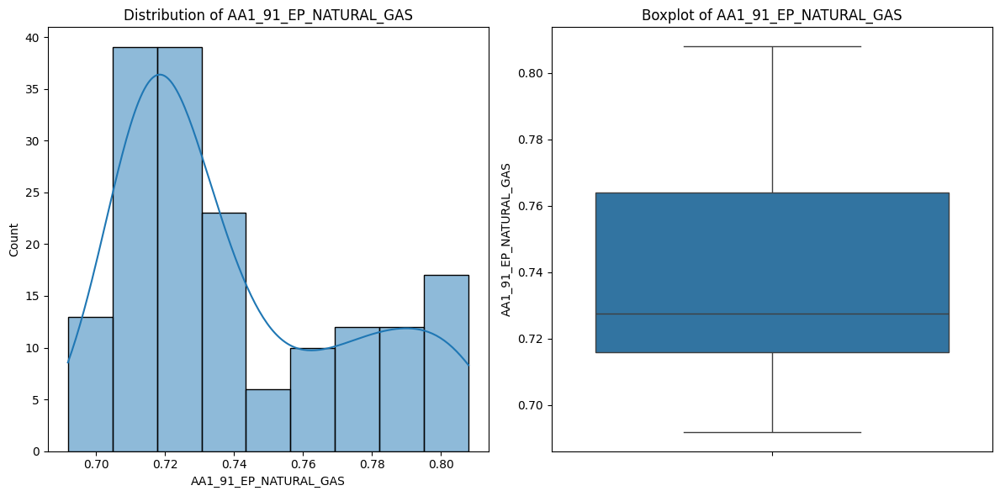


--- Summary Statistics for AA1_ANPR ---
count    171.000000
mean     238.875322
std        2.015715
min      234.280000
25%      237.985000
50%      239.310000
75%      240.410000
max      241.590000
Name: AA1_ANPR, dtype: float64


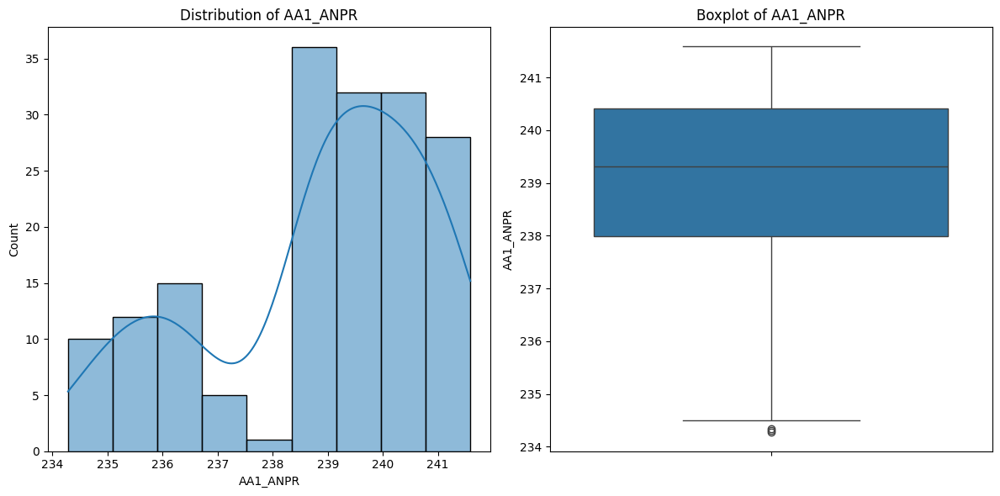


--- Summary Statistics for AA1_C_PR ---
count    171.000000
mean     151.316842
std        1.045809
min      149.030000
25%      150.525000
50%      151.490000
75%      152.125000
max      153.230000
Name: AA1_C_PR, dtype: float64


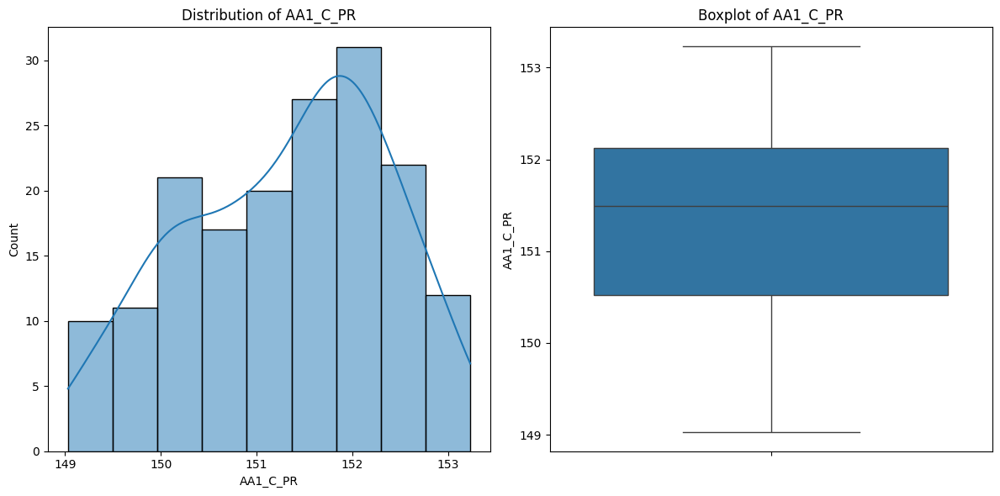


--- Summary Statistics for AA1_FBHP ---
count    171.000000
mean     241.067193
std        3.096285
min      236.440000
25%      238.100000
50%      241.380000
75%      243.765000
max      246.300000
Name: AA1_FBHP, dtype: float64


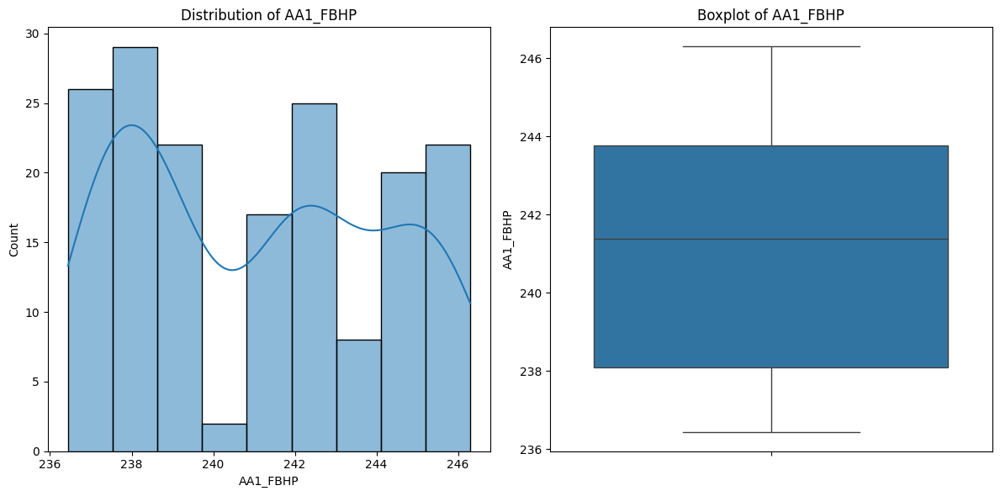


--- Summary Statistics for AA1_ANTP ---
count    171.000000
mean       7.408772
std        0.652402
min        6.100000
25%        6.900000
50%        7.500000
75%        7.900000
max        9.000000
Name: AA1_ANTP, dtype: float64


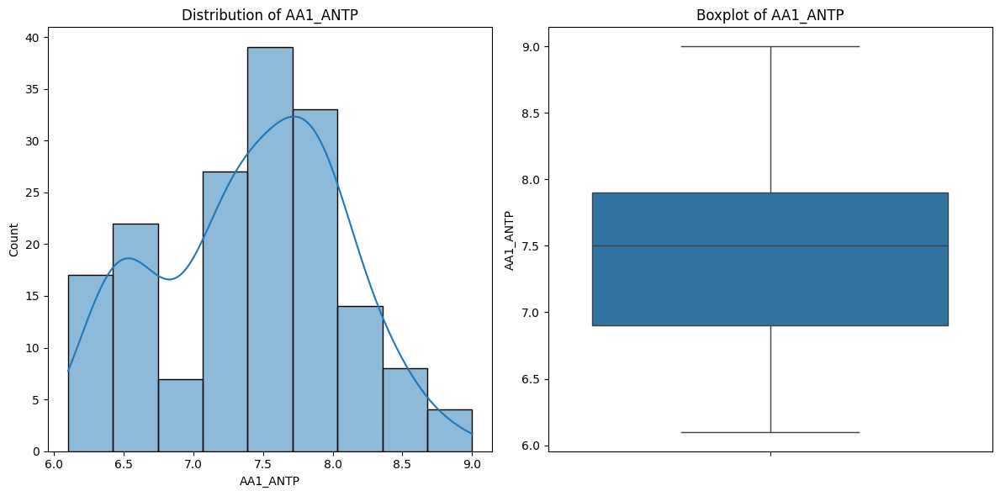


--- Summary Statistics for AA1_C_TE ---
count    171.000000
mean      19.089474
std        0.260328
min       18.500000
25%       18.900000
50%       19.100000
75%       19.300000
max       19.600000
Name: AA1_C_TE, dtype: float64


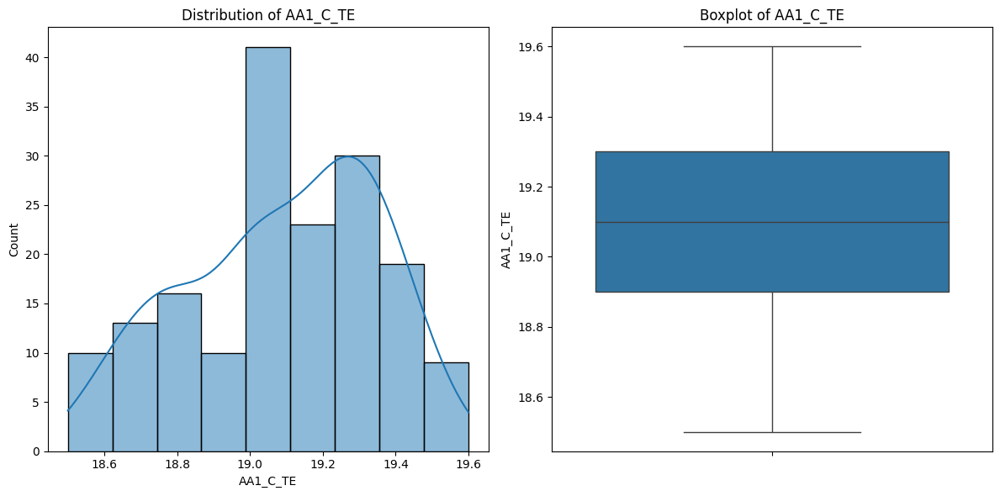


--- Summary Statistics for AA1_FBHT ---
count    171.000000
mean      38.348538
std        0.050125
min       38.300000
25%       38.300000
50%       38.300000
75%       38.400000
max       38.400000
Name: AA1_FBHT, dtype: float64


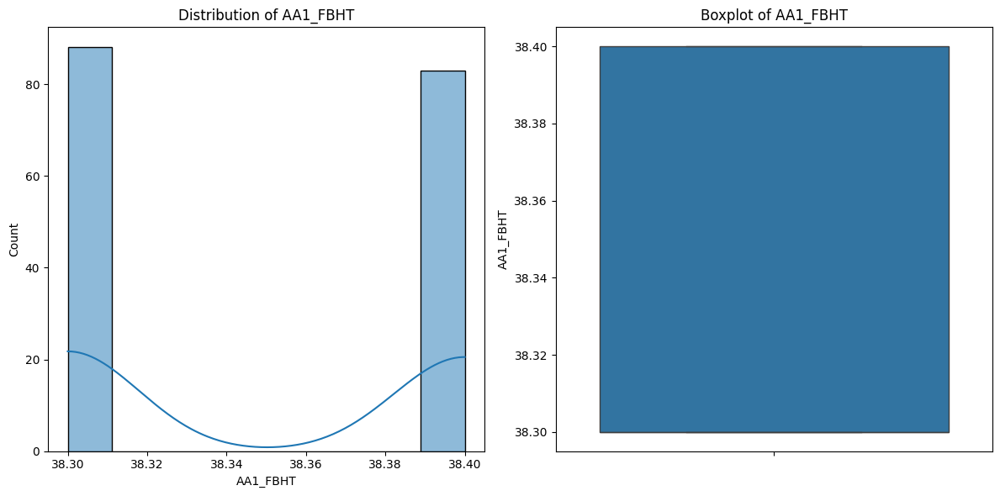


--- Summary Statistics for AA1_C_OP ---
count    171.000000
mean      21.435088
std        1.389000
min       20.190000
25%       20.190000
50%       20.190000
75%       23.080000
max       23.080000
Name: AA1_C_OP, dtype: float64


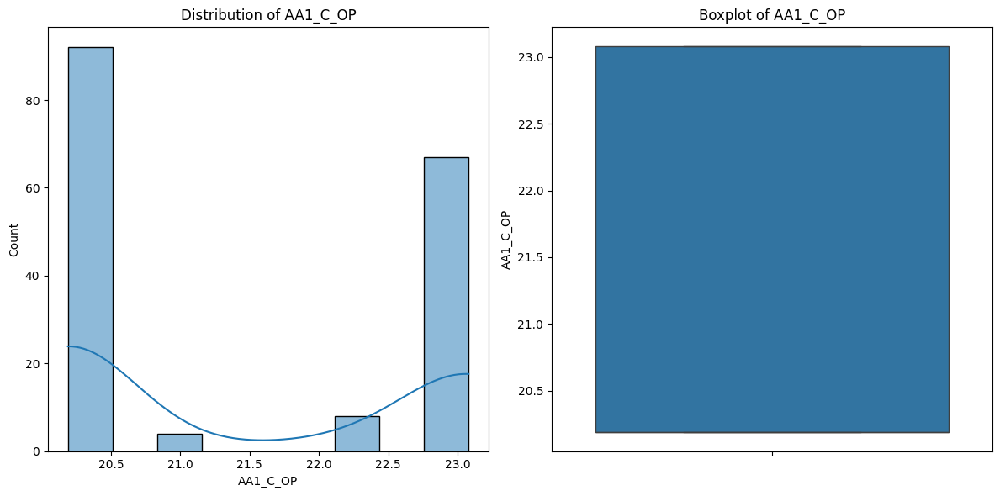


--- Summary Statistics for AA2 ---

--- Summary Statistics for AA2_91_9500062414 ---
count     171.000000
mean      673.427544
std       831.568242
min         1.400000
25%         1.890000
50%         1.920000
75%      1478.000000
max      1958.000000
Name: AA2_91_9500062414, dtype: float64


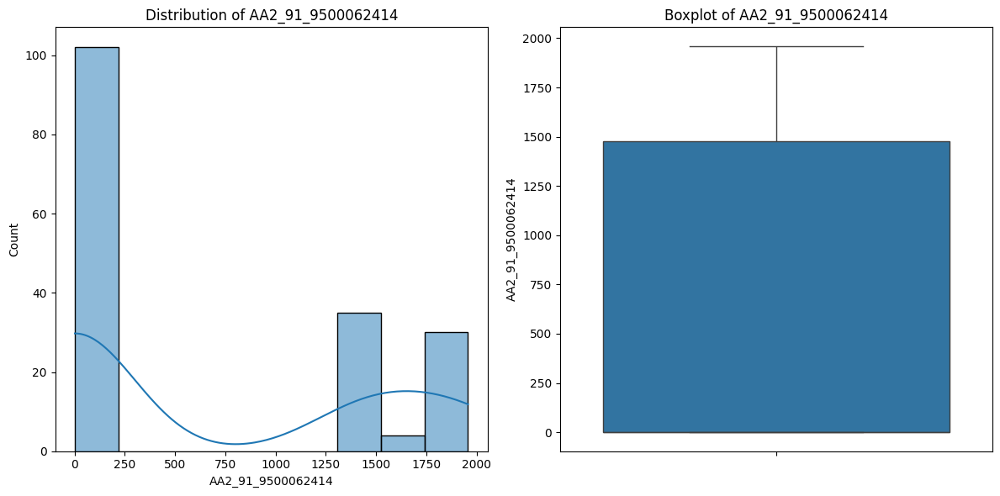


--- Summary Statistics for AA2_91_EP_NATURAL_GAS ---
count    171.000000
mean       1.113532
std        0.012647
min        1.074530
25%        1.109520
50%        1.117560
75%        1.122800
max        1.130830
Name: AA2_91_EP_NATURAL_GAS, dtype: float64


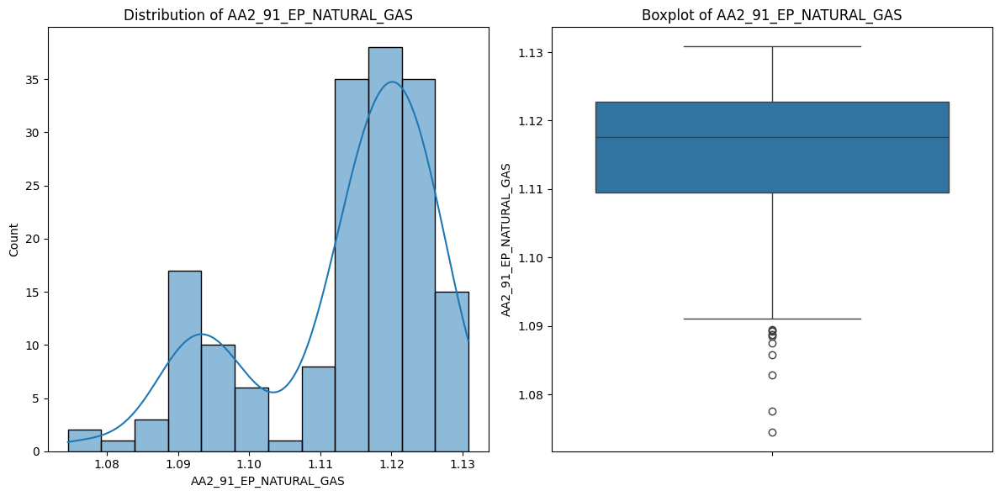


--- Summary Statistics for AA2_ANPR ---
count    171.000000
mean     248.578538
std       10.859124
min      236.380000
25%      242.885000
50%      247.410000
75%      248.515000
max      277.650000
Name: AA2_ANPR, dtype: float64


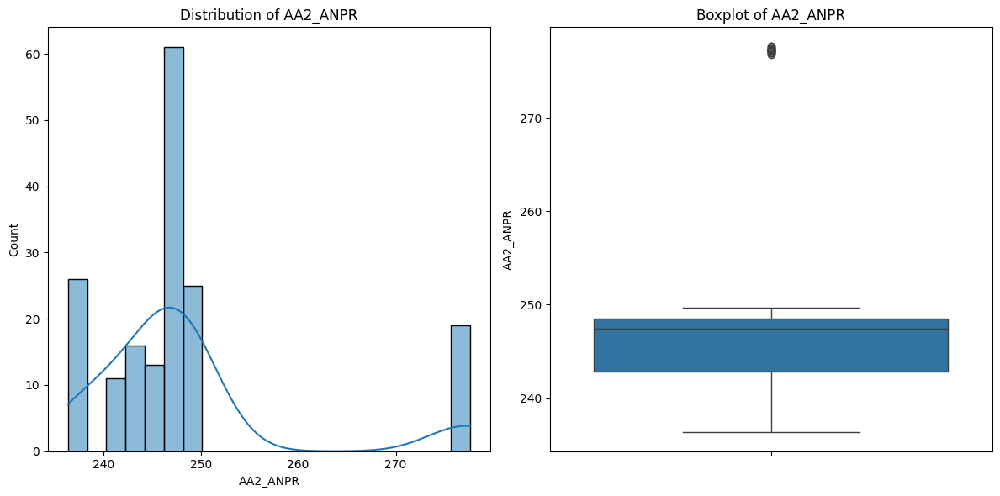


--- Summary Statistics for AA2_C_PR ---
count    171.000000
mean     152.723860
std        1.041476
min      150.410000
25%      151.965000
50%      152.820000
75%      153.515000
max      154.650000
Name: AA2_C_PR, dtype: float64


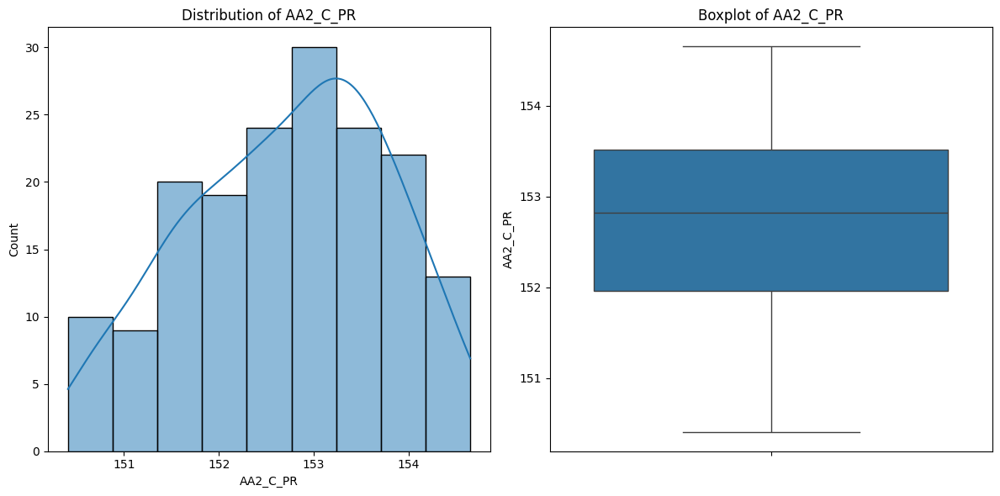


--- Summary Statistics for AA2_FBHP ---
count    171.000000
mean     242.007778
std        3.025499
min      237.290000
25%      239.340000
50%      241.730000
75%      244.600000
max      247.350000
Name: AA2_FBHP, dtype: float64


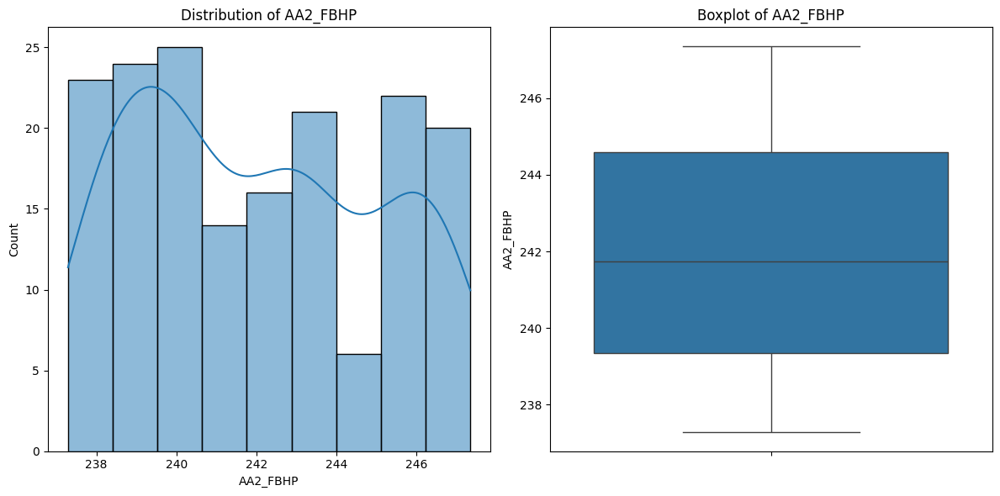


--- Summary Statistics for AA2_ANTP ---
count    171.000000
mean       5.625146
std        1.278192
min        3.900000
25%        4.700000
50%        5.300000
75%        5.600000
max        9.700000
Name: AA2_ANTP, dtype: float64


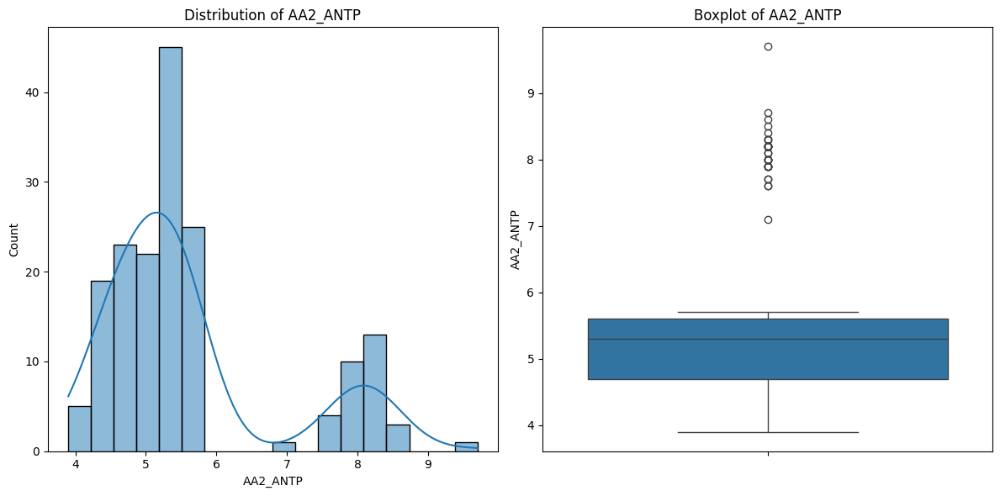


--- Summary Statistics for AA2_C_TE ---
count    171.000000
mean      19.288889
std        0.209325
min       18.600000
25%       19.100000
50%       19.300000
75%       19.500000
max       19.600000
Name: AA2_C_TE, dtype: float64


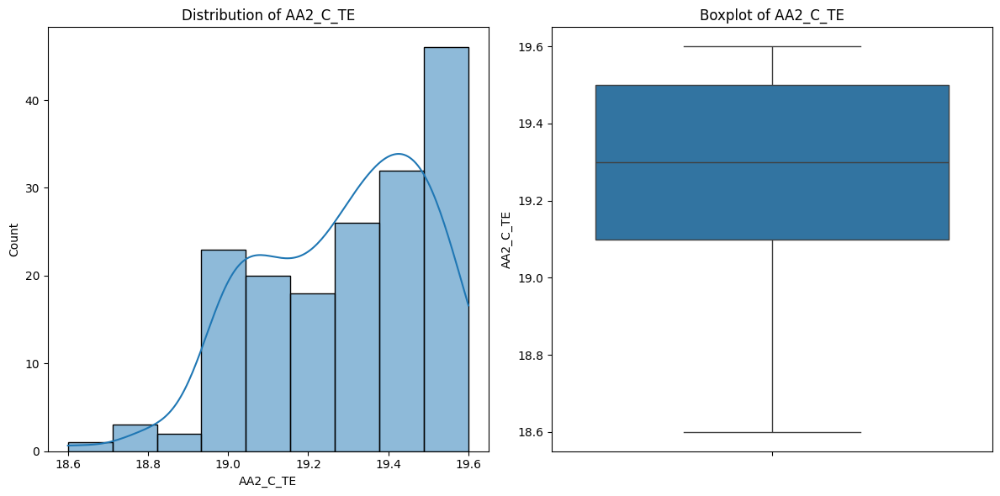


--- Summary Statistics for AA2_FBHT ---
count    171.000000
mean      36.680117
std        0.040029
min       36.600000
25%       36.700000
50%       36.700000
75%       36.700000
max       36.700000
Name: AA2_FBHT, dtype: float64


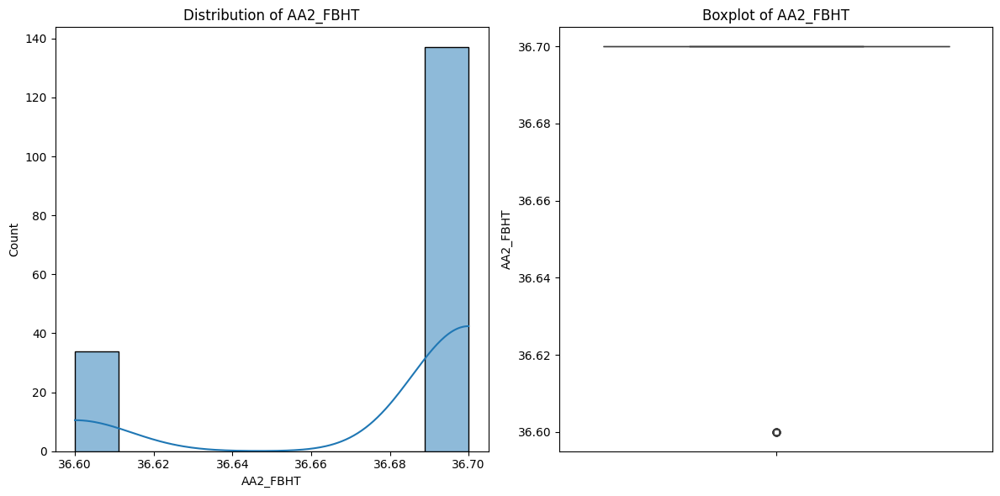


--- Summary Statistics for AA2_C_OP ---
count    171.000000
mean      30.258772
std        0.927837
min       24.270000
25%       29.130000
50%       30.100000
75%       31.070000
max       31.070000
Name: AA2_C_OP, dtype: float64


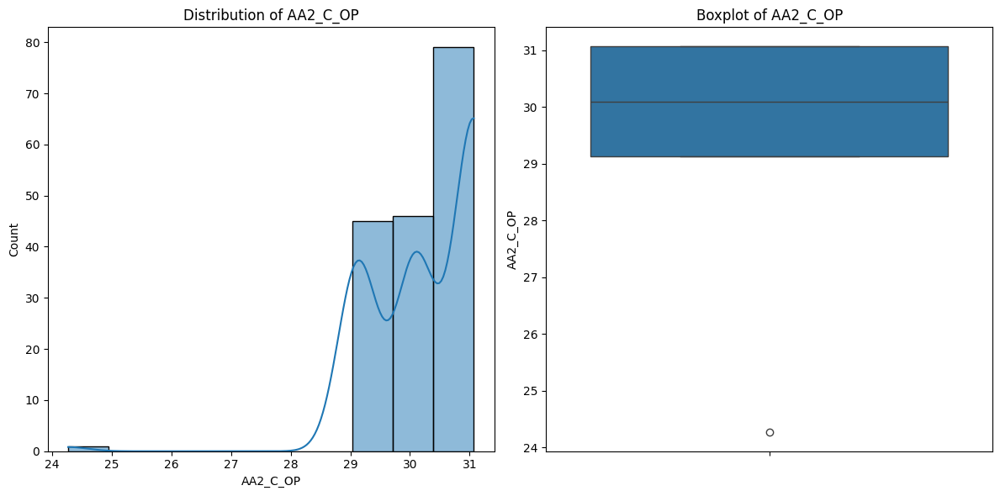


--- Summary Statistics for AA3 ---

--- Summary Statistics for AA3_91_9500062414 ---
count     171.000000
mean     1104.804737
std      1365.993361
min         2.300000
25%         3.130000
50%         3.200000
75%      2377.000000
max      3217.000000
Name: AA3_91_9500062414, dtype: float64


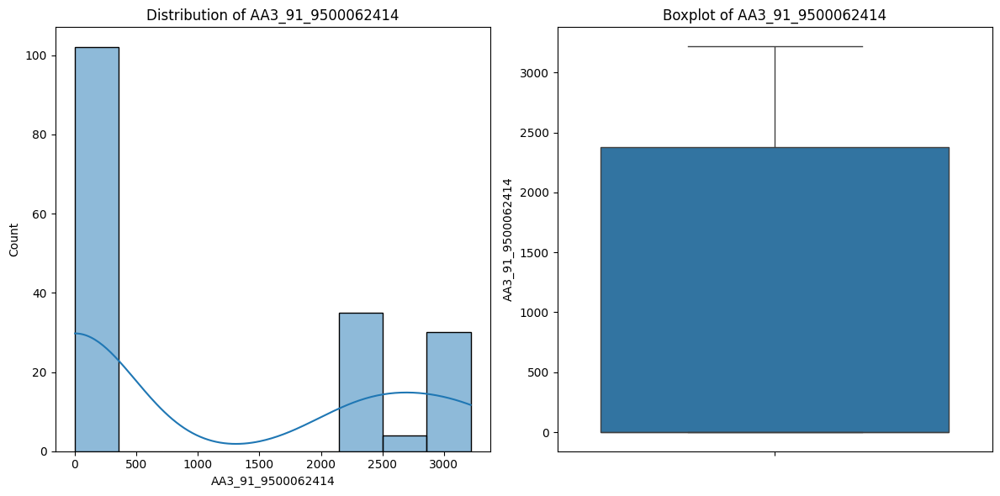


--- Summary Statistics for AA3_91_EP_NATURAL_GAS ---
count    171.000000
mean       1.835630
std        0.023106
min        1.789990
25%        1.811995
50%        1.832750
75%        1.856440
max        1.887790
Name: AA3_91_EP_NATURAL_GAS, dtype: float64


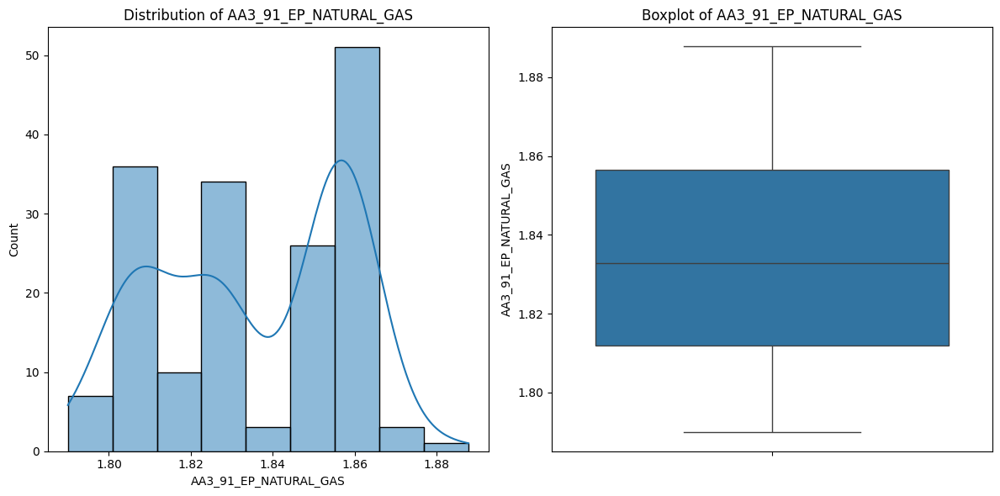


--- Summary Statistics for AA3_ANPR ---
count    171.000000
mean     299.139825
std       13.149079
min      282.900000
25%      283.800000
50%      308.250000
75%      311.620000
max      314.210000
Name: AA3_ANPR, dtype: float64


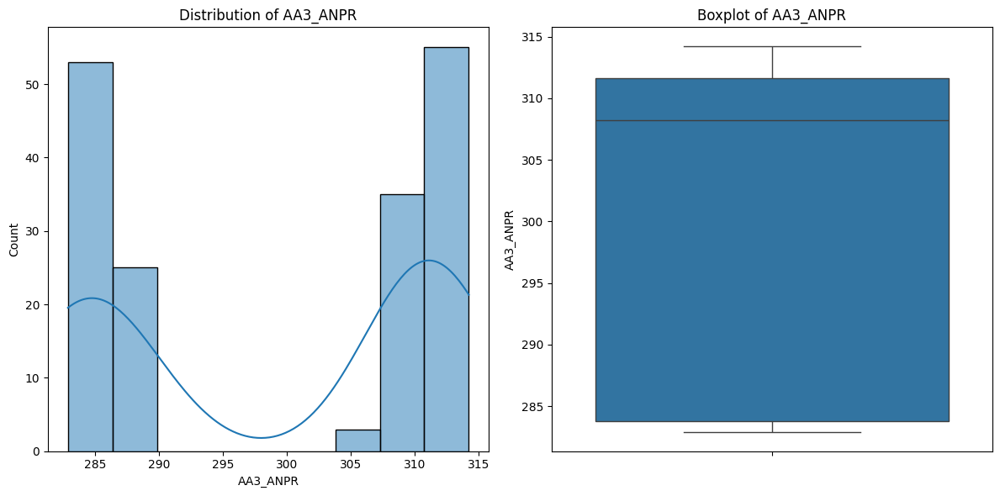


--- Summary Statistics for AA3_C_PR ---
count    171.000000
mean     128.845848
std        1.007324
min      126.800000
25%      127.965000
50%      128.930000
75%      129.715000
max      130.730000
Name: AA3_C_PR, dtype: float64


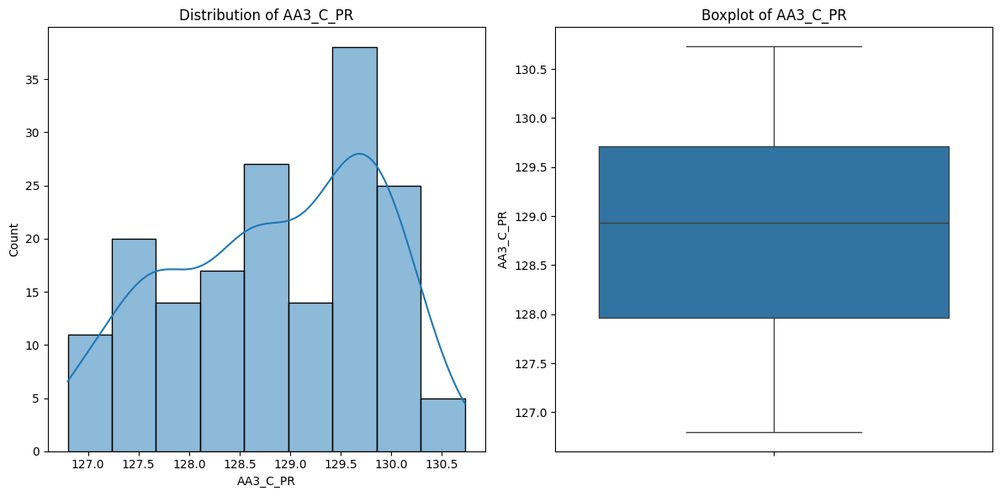


--- Summary Statistics for AA3_FBHP ---
count    171.000000
mean     302.986433
std        2.837496
min      298.270000
25%      300.440000
50%      303.020000
75%      305.075000
max      307.800000
Name: AA3_FBHP, dtype: float64


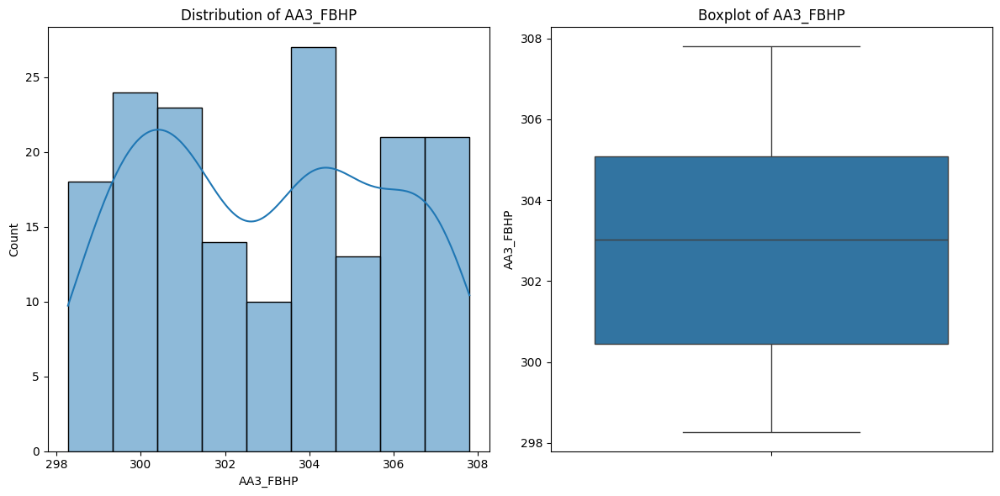


--- Summary Statistics for AA3_ANTP ---
count    171.000000
mean      14.723977
std        1.558415
min       10.500000
25%       13.600000
50%       14.100000
75%       16.500000
max       18.300000
Name: AA3_ANTP, dtype: float64


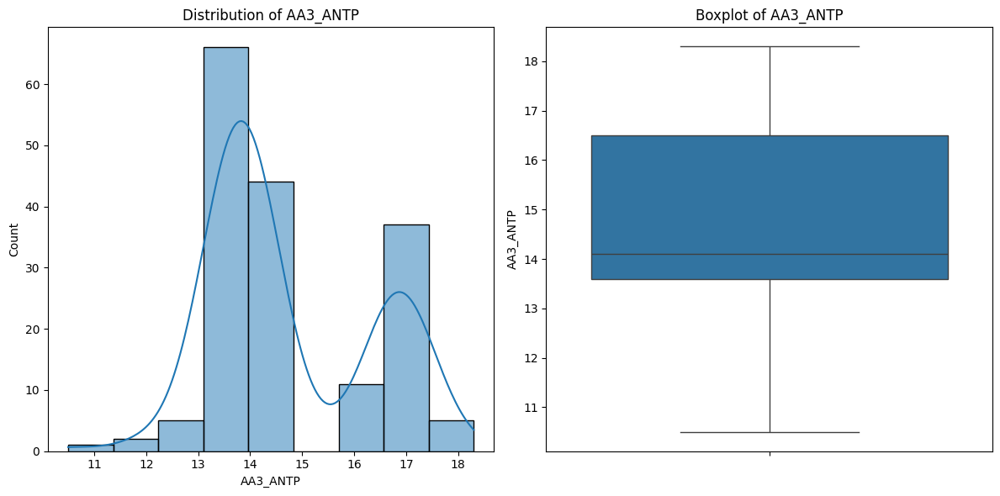


--- Summary Statistics for AA3_C_TE ---
count    171.000000
mean      59.911111
std        0.258604
min       59.300000
25%       59.800000
50%       60.000000
75%       60.100000
max       60.500000
Name: AA3_C_TE, dtype: float64


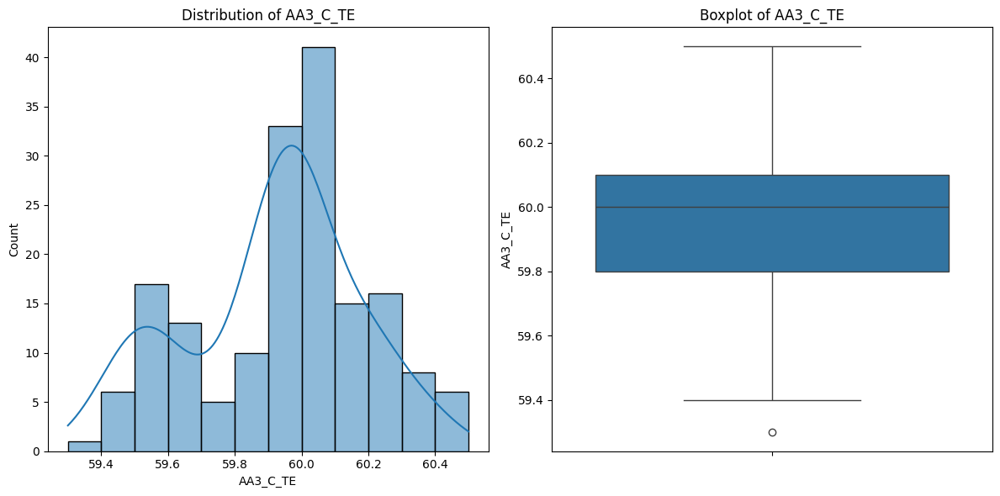


--- Summary Statistics for AA3_FBHT ---
count    171.000000
mean      92.747953
std        0.050105
min       92.700000
25%       92.700000
50%       92.700000
75%       92.800000
max       92.800000
Name: AA3_FBHT, dtype: float64


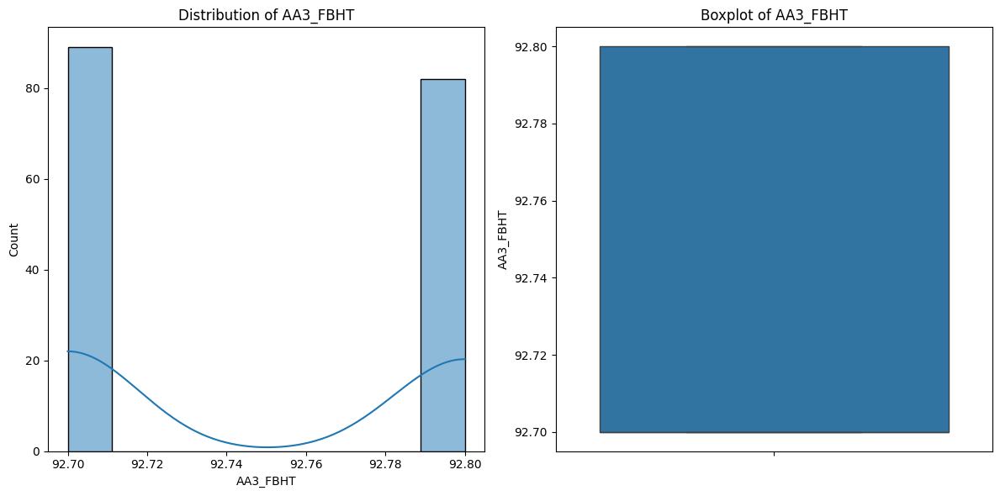


--- Summary Statistics for AA3_C_OP ---
count    171.000000
mean      39.627719
std        0.396462
min       39.420000
25%       39.420000
50%       39.420000
75%       39.420000
max       40.380000
Name: AA3_C_OP, dtype: float64


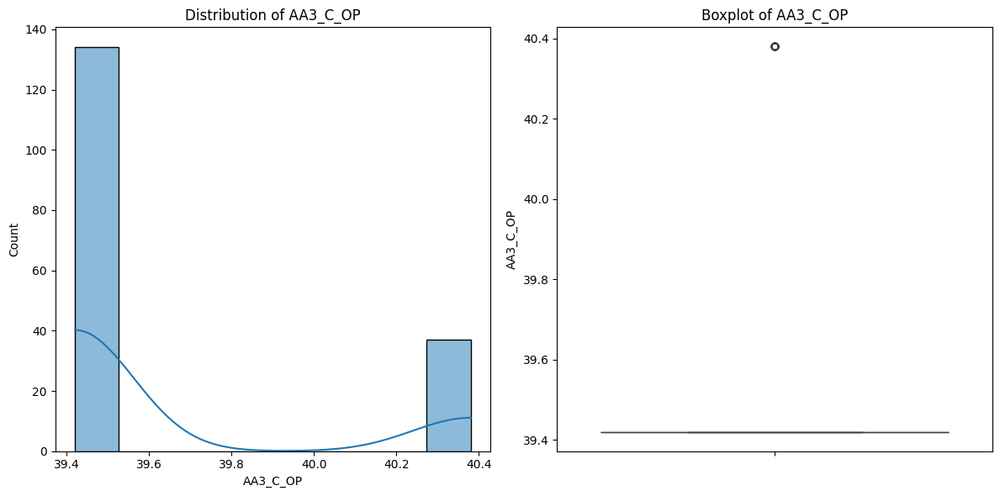


--- Summary Statistics for AA4 ---

--- Summary Statistics for AA4_91_9500062414 ---
count     171.000000
mean      742.250292
std       915.292146
min         1.580000
25%         2.080000
50%         2.090000
75%      1620.000000
max      2158.000000
Name: AA4_91_9500062414, dtype: float64


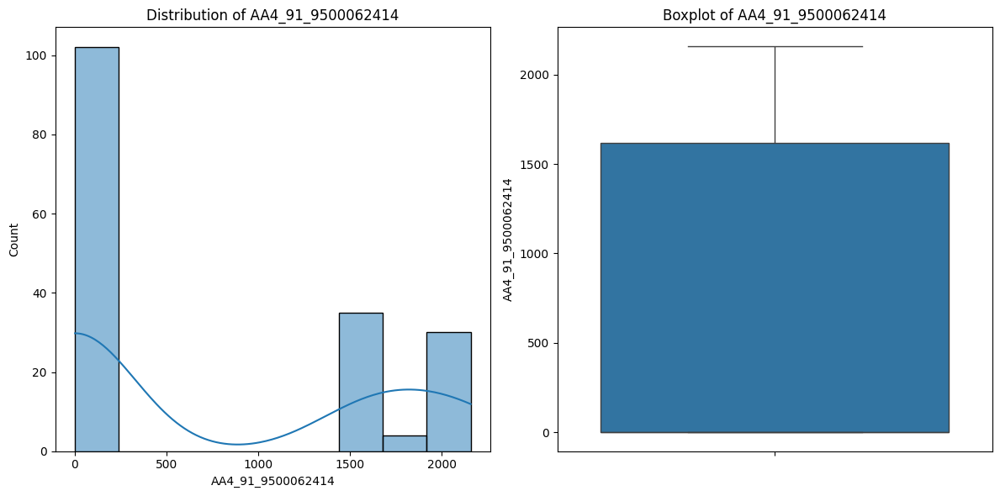


--- Summary Statistics for AA4_91_EP_NATURAL_GAS ---
count    171.000000
mean       1.230943
std        0.013328
min        1.194230
25%        1.223520
50%        1.230080
75%        1.242920
max        1.259420
Name: AA4_91_EP_NATURAL_GAS, dtype: float64


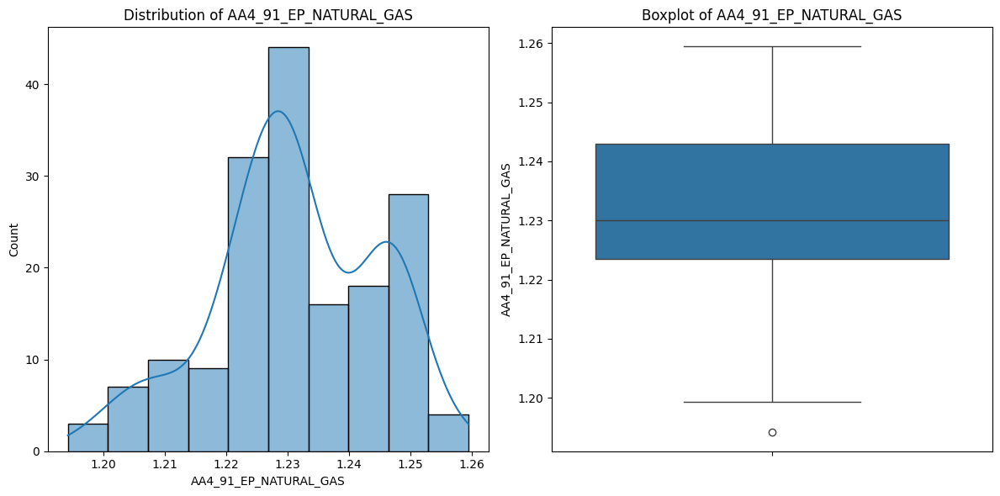


--- Summary Statistics for AA4_ANPR ---
count    171.000000
mean     207.259532
std       27.038381
min      178.250000
25%      178.440000
50%      221.910000
75%      231.980000
max      244.380000
Name: AA4_ANPR, dtype: float64


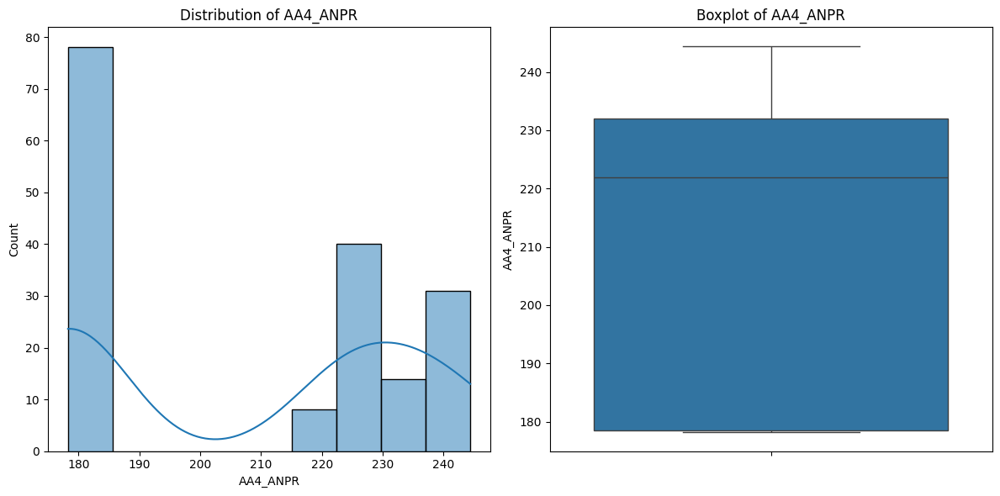


--- Summary Statistics for AA4_C_PR ---
count    171.000000
mean     140.964035
std        1.064457
min      138.580000
25%      140.005000
50%      141.140000
75%      141.860000
max      142.830000
Name: AA4_C_PR, dtype: float64


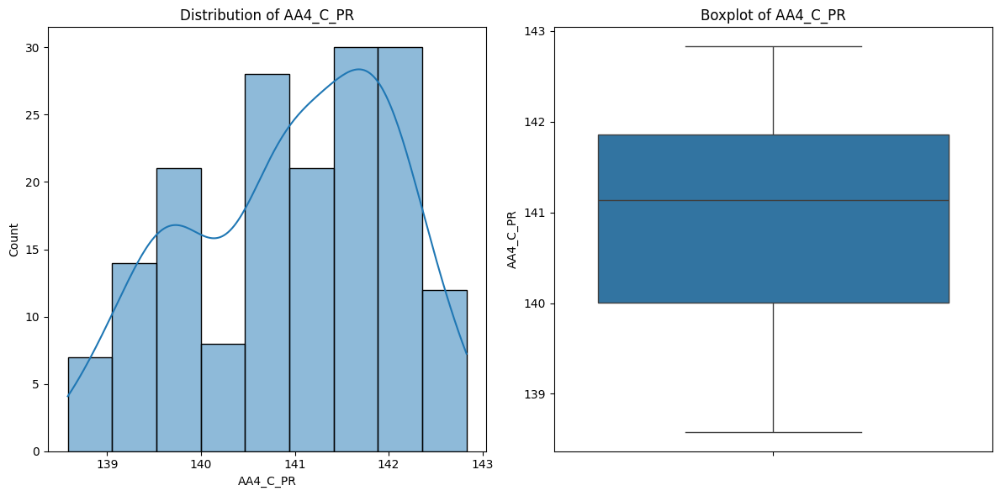


--- Summary Statistics for AA4_FBHP ---
count    171.000000
mean     235.902515
std        3.174206
min      230.060000
25%      233.080000
50%      236.400000
75%      238.855000
max      240.480000
Name: AA4_FBHP, dtype: float64


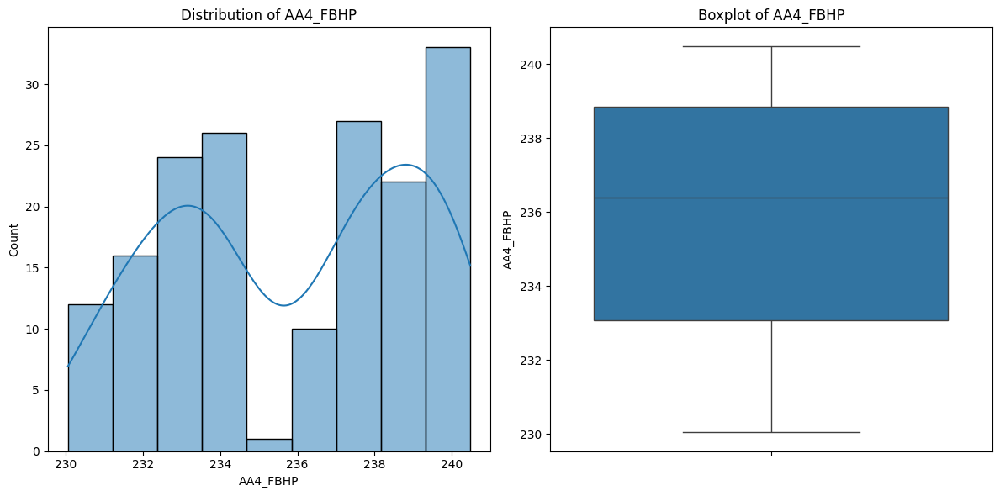


--- Summary Statistics for AA4_ANTP ---
count    171.000000
mean      12.255556
std        1.421975
min       10.400000
25%       11.100000
50%       11.400000
75%       13.500000
max       15.400000
Name: AA4_ANTP, dtype: float64


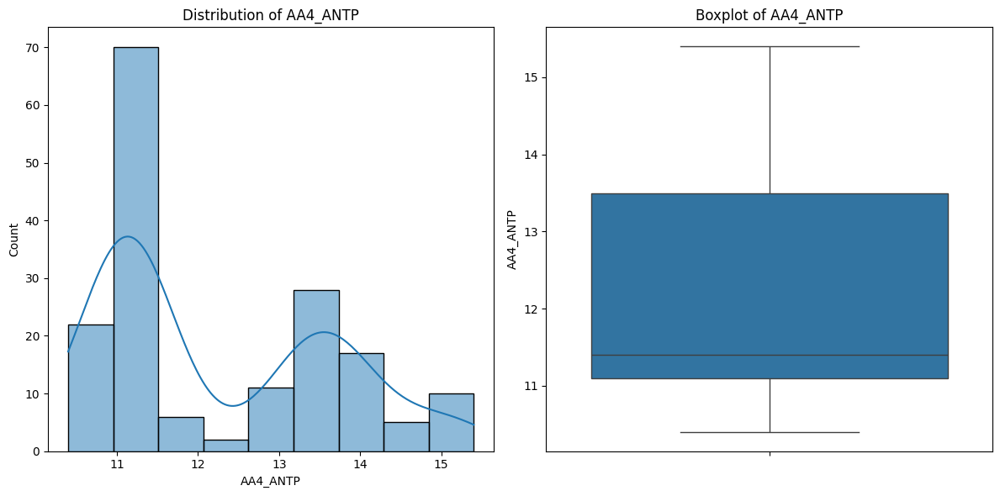


--- Summary Statistics for AA4_C_TE ---
count    171.000000
mean      28.301754
std        0.207640
min       27.800000
25%       28.100000
50%       28.300000
75%       28.400000
max       28.900000
Name: AA4_C_TE, dtype: float64


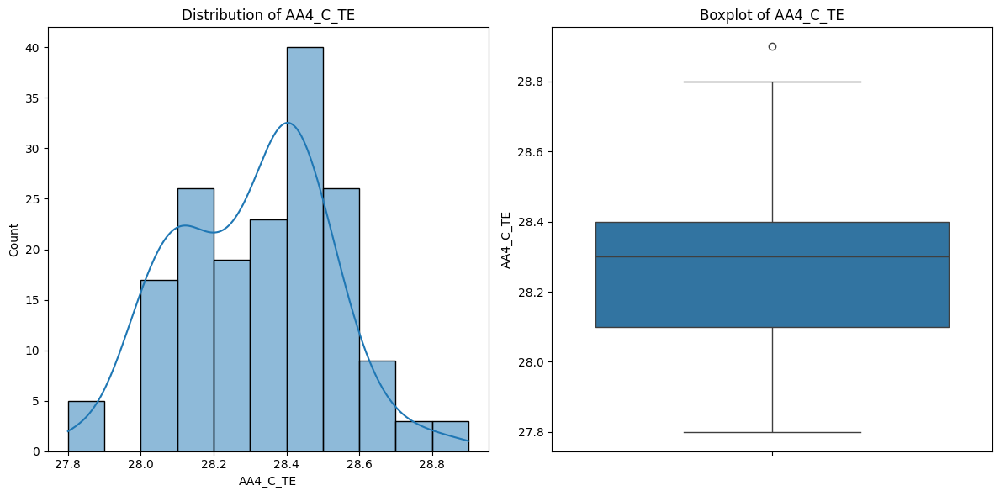


--- Summary Statistics for AA4_FBHT ---
count    171.000000
mean      48.195906
std        0.093530
min       48.100000
25%       48.100000
50%       48.200000
75%       48.300000
max       48.300000
Name: AA4_FBHT, dtype: float64


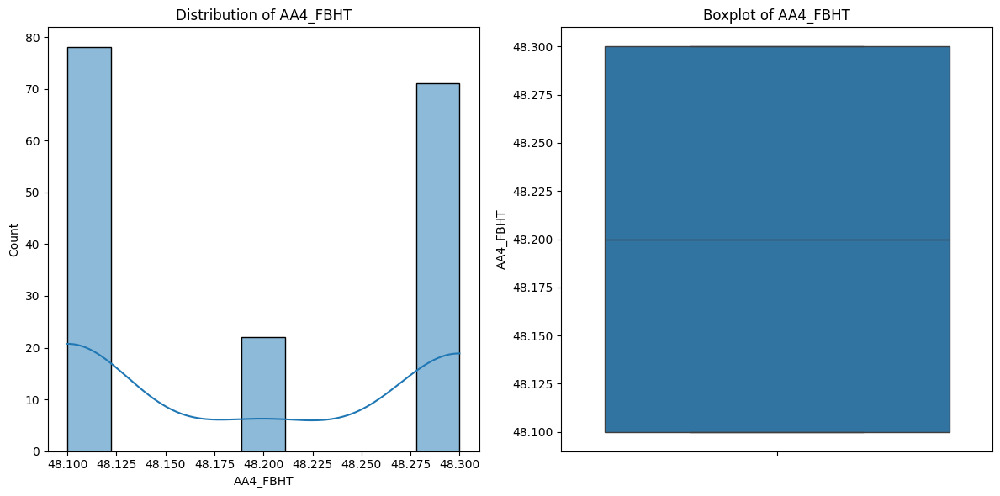


--- Summary Statistics for AA4_C_OP ---
count    1.710000e+02
mean     3.429000e+01
std      2.850518e-14
min      3.429000e+01
25%      3.429000e+01
50%      3.429000e+01
75%      3.429000e+01
max      3.429000e+01
Name: AA4_C_OP, dtype: float64


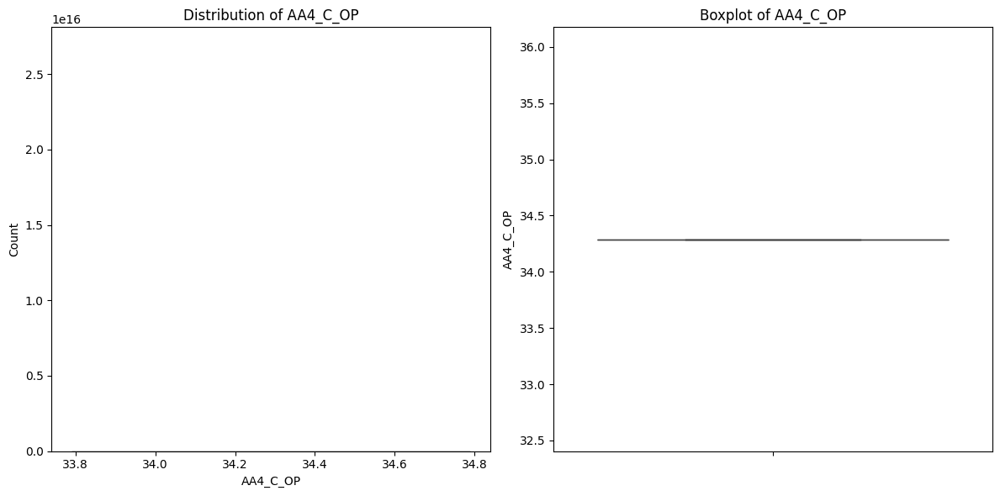


--- Summary Statistics for AA5 ---

--- Summary Statistics for AA5_91_9500062414 ---
count     171.000000
mean      737.806023
std       912.799156
min         1.560000
25%         2.090000
50%         2.130000
75%      1578.000000
max      2158.000000
Name: AA5_91_9500062414, dtype: float64


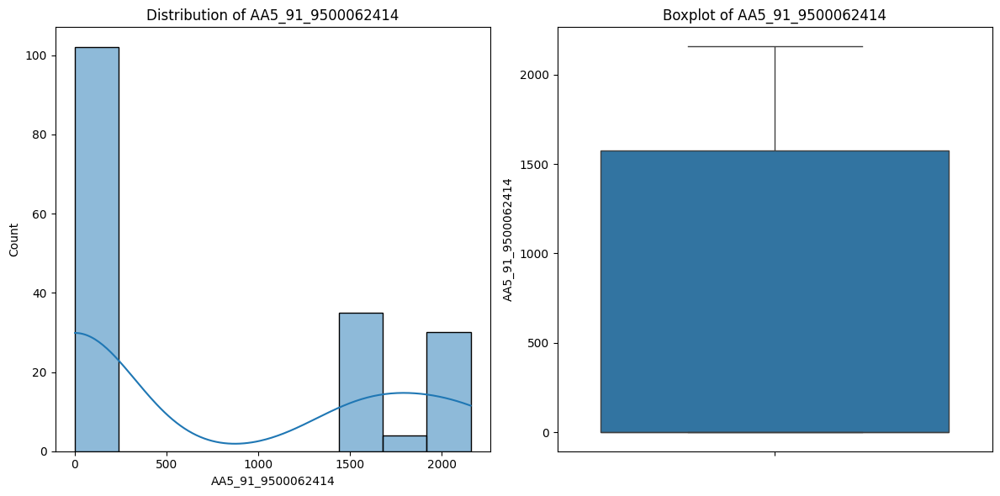


--- Summary Statistics for AA5_91_EP_NATURAL_GAS ---
count    171.000000
mean       1.225671
std        0.019583
min        1.185490
25%        1.204260
50%        1.227190
75%        1.242260
max        1.254970
Name: AA5_91_EP_NATURAL_GAS, dtype: float64


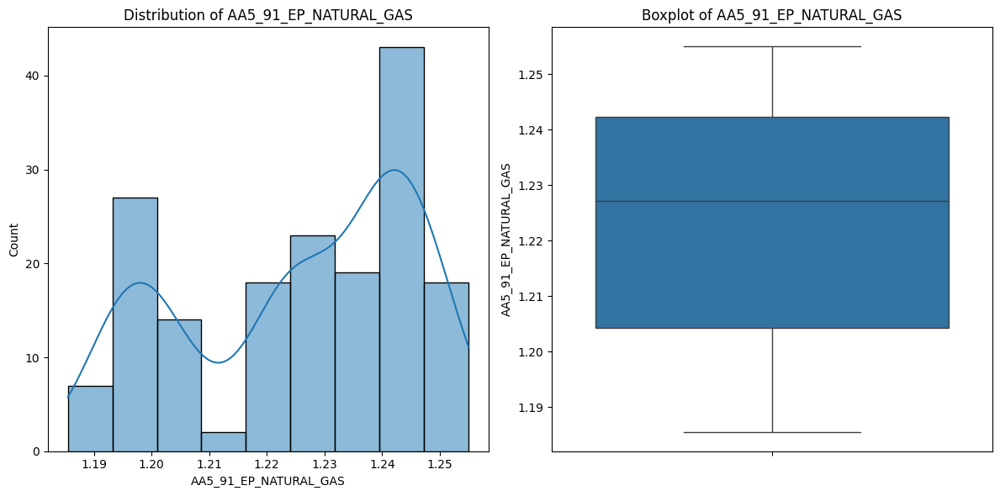


--- Summary Statistics for AA5_ANPR ---
count    171.000000
mean     235.591754
std        1.730100
min      232.580000
25%      234.040000
50%      235.510000
75%      236.975000
max      238.550000
Name: AA5_ANPR, dtype: float64


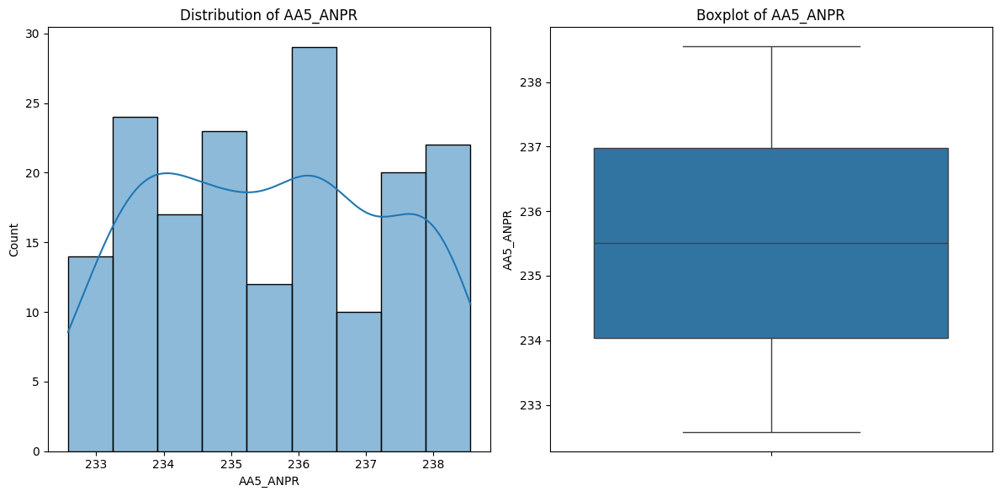


--- Summary Statistics for AA5_C_PR ---
count    171.000000
mean     146.639006
std        1.007950
min      144.510000
25%      145.815000
50%      146.650000
75%      147.480000
max      148.710000
Name: AA5_C_PR, dtype: float64


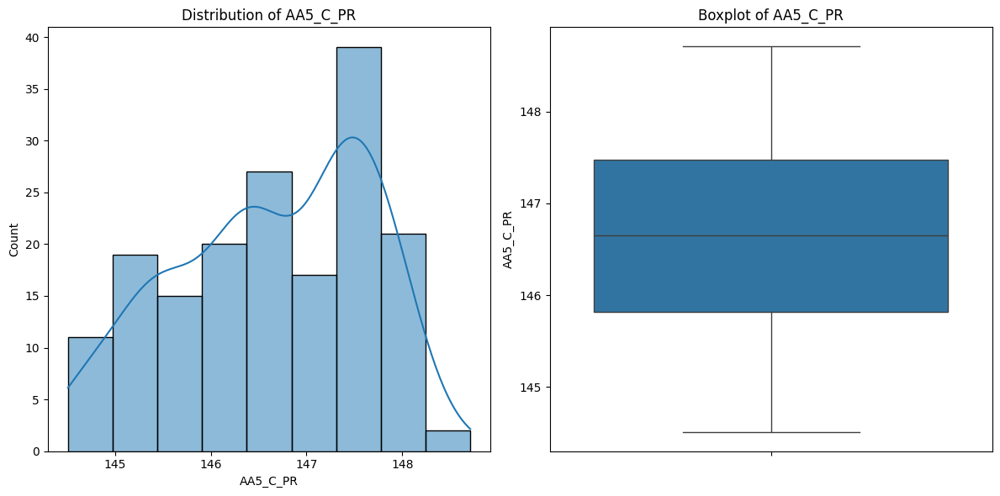


--- Summary Statistics for AA5_FBHP ---
count    171.000000
mean     243.339532
std        1.789511
min      240.320000
25%      241.775000
50%      243.260000
75%      244.790000
max      246.390000
Name: AA5_FBHP, dtype: float64


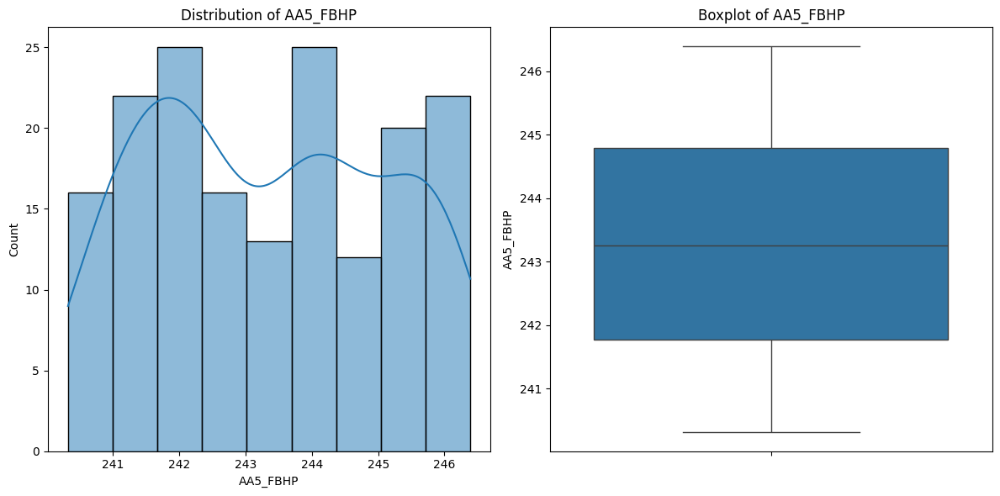


--- Summary Statistics for AA5_ANTP ---
count    171.000000
mean       5.907018
std        0.390562
min        4.900000
25%        5.700000
50%        5.900000
75%        6.200000
max        6.700000
Name: AA5_ANTP, dtype: float64


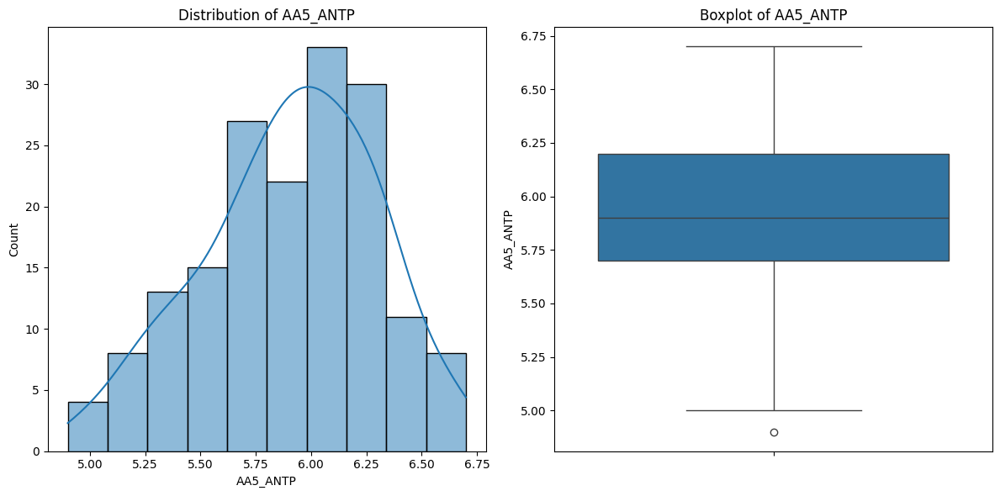


--- Summary Statistics for AA5_C_TE ---
count    171.000000
mean      11.096491
std        0.144261
min       10.800000
25%       11.000000
50%       11.100000
75%       11.200000
max       11.400000
Name: AA5_C_TE, dtype: float64


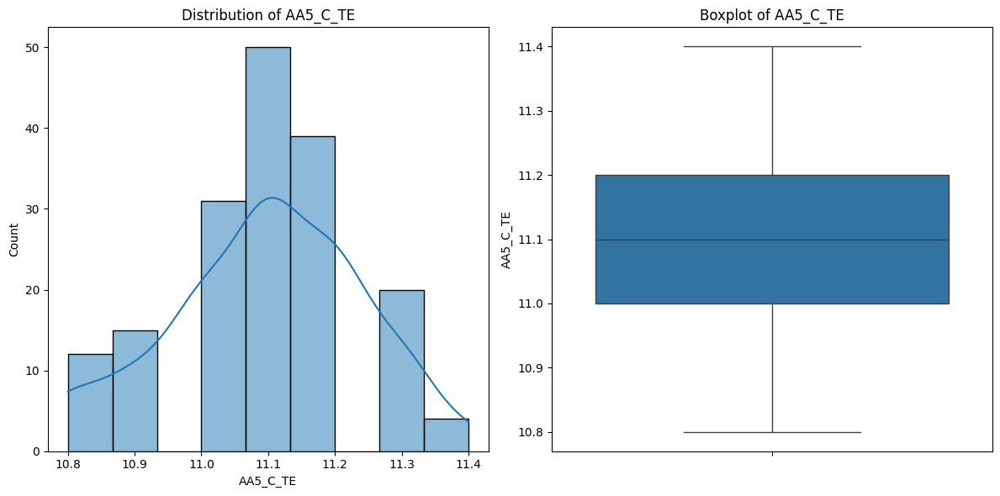


--- Summary Statistics for AA5_FBHT ---
count    1.710000e+02
mean     2.910000e+01
std      1.068944e-14
min      2.910000e+01
25%      2.910000e+01
50%      2.910000e+01
75%      2.910000e+01
max      2.910000e+01
Name: AA5_FBHT, dtype: float64


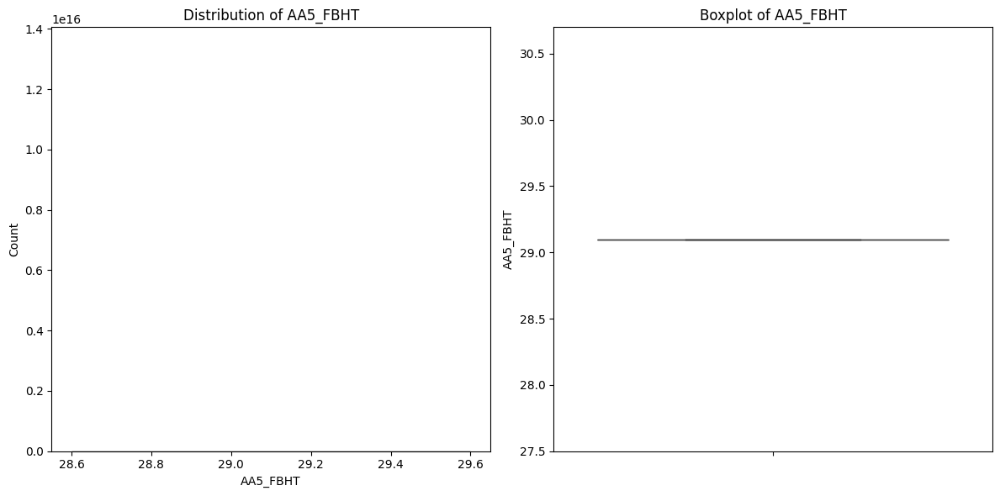


--- Summary Statistics for AA5_C_OP ---
count    171.000000
mean      29.287895
std        0.479554
min       28.850000
25%       28.850000
50%       28.850000
75%       29.810000
max       29.810000
Name: AA5_C_OP, dtype: float64


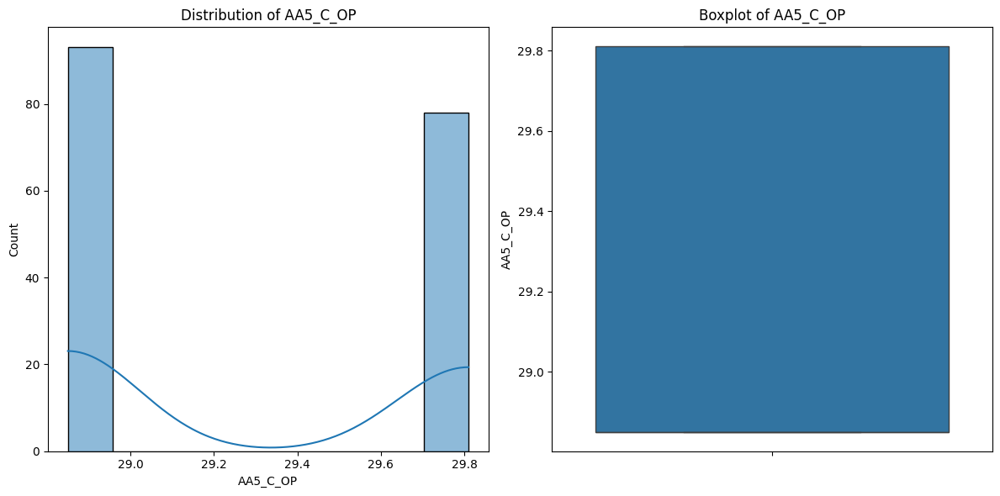

In [ ]:
# Key variables for each well
key_variables = ['91_9500062414', '91_EP_NATURAL_GAS', 'ANPR', 'C_PR', 'FBHP', 'ANTP', 'C_TE', 'FBHT', 'C_OP']

# Iterate through each well
for well in ['AA1', 'AA2', 'AA3', 'AA4', 'AA5']:
    print(f"\n--- Summary Statistics for {well} ---")
    for var in key_variables:
        column_name = f'{well}_{var}'
        print(f"\n--- Summary Statistics for {column_name} ---")
        print(df[column_name].describe())
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        sns.histplot(df[column_name], kde=True)
        plt.title(f'Distribution of {column_name}')
        plt.subplot(1, 2, 2)
        sns.boxplot(y=df[column_name])
        plt.title(f'Boxplot of {column_name}')
        plt.tight_layout()
        plt.show()

In [ ]:
df.shape

(171, 56)

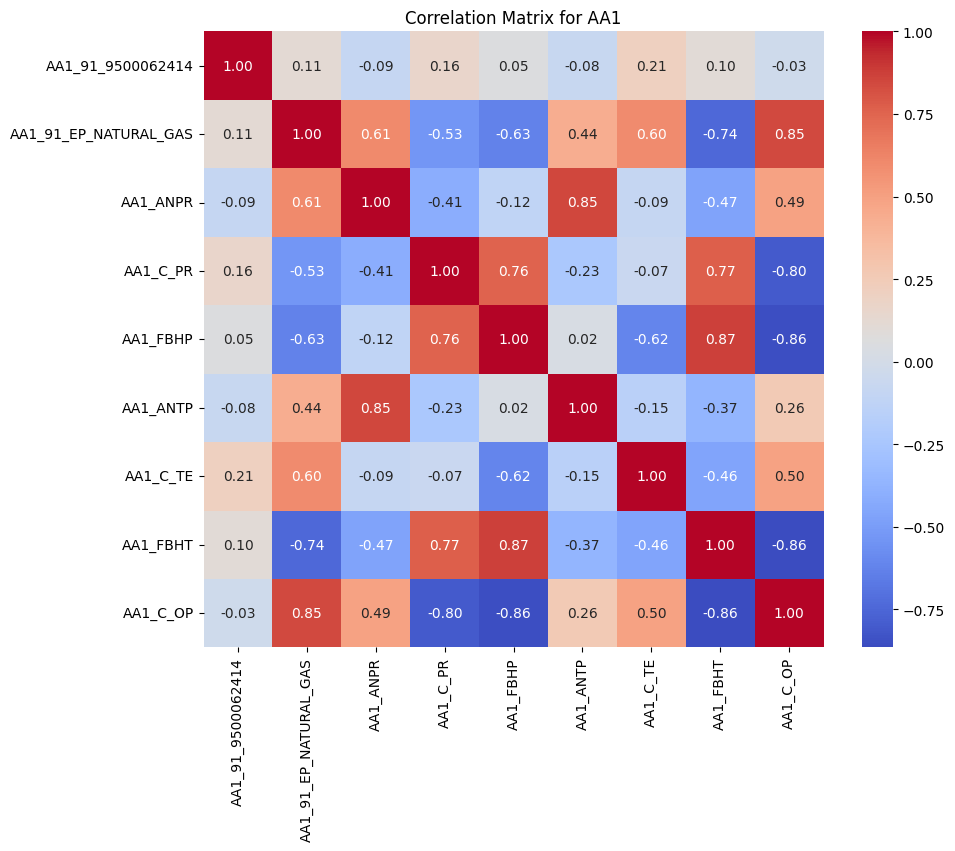

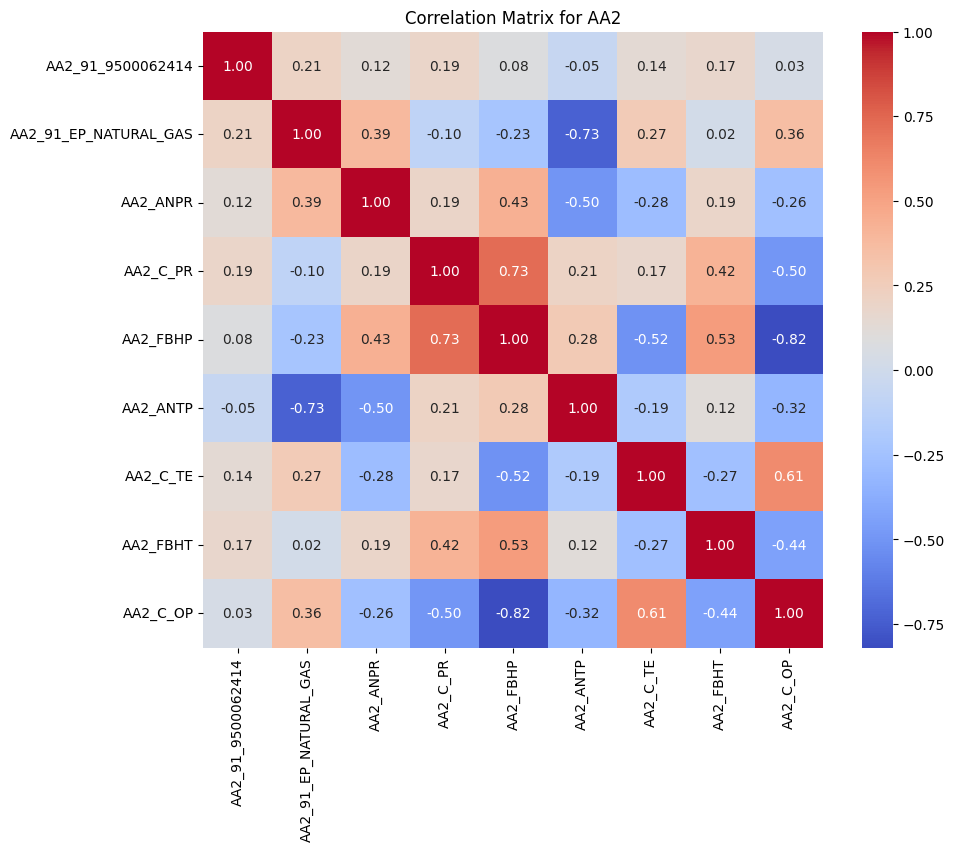

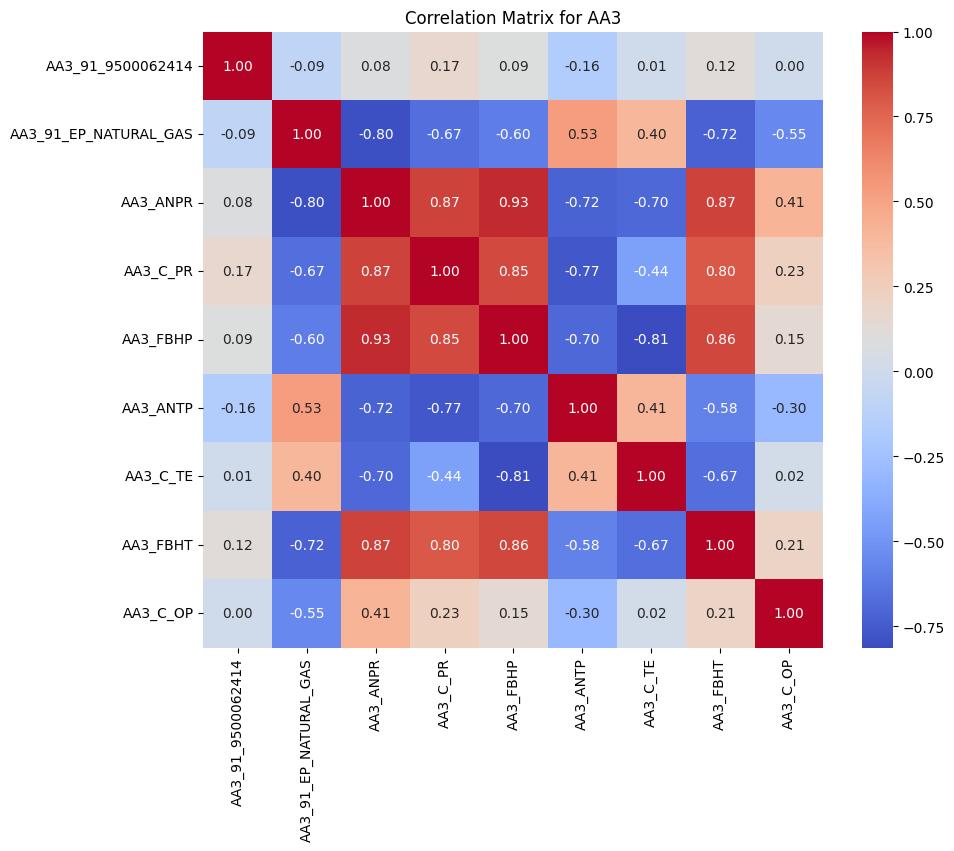

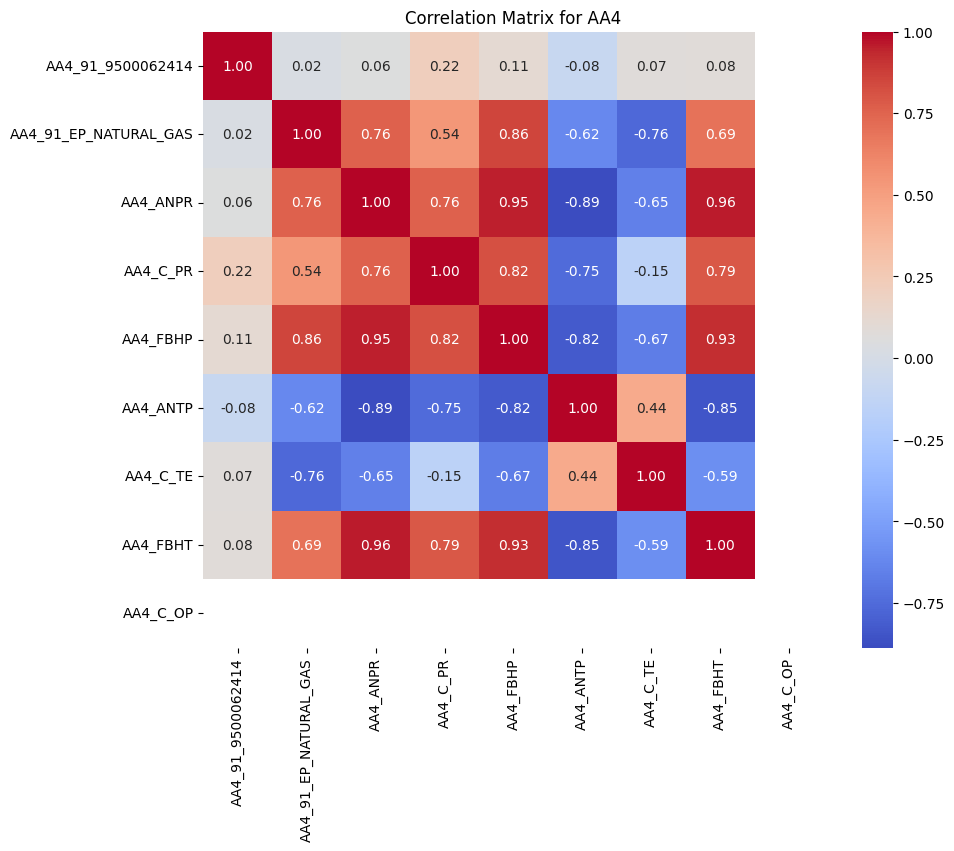

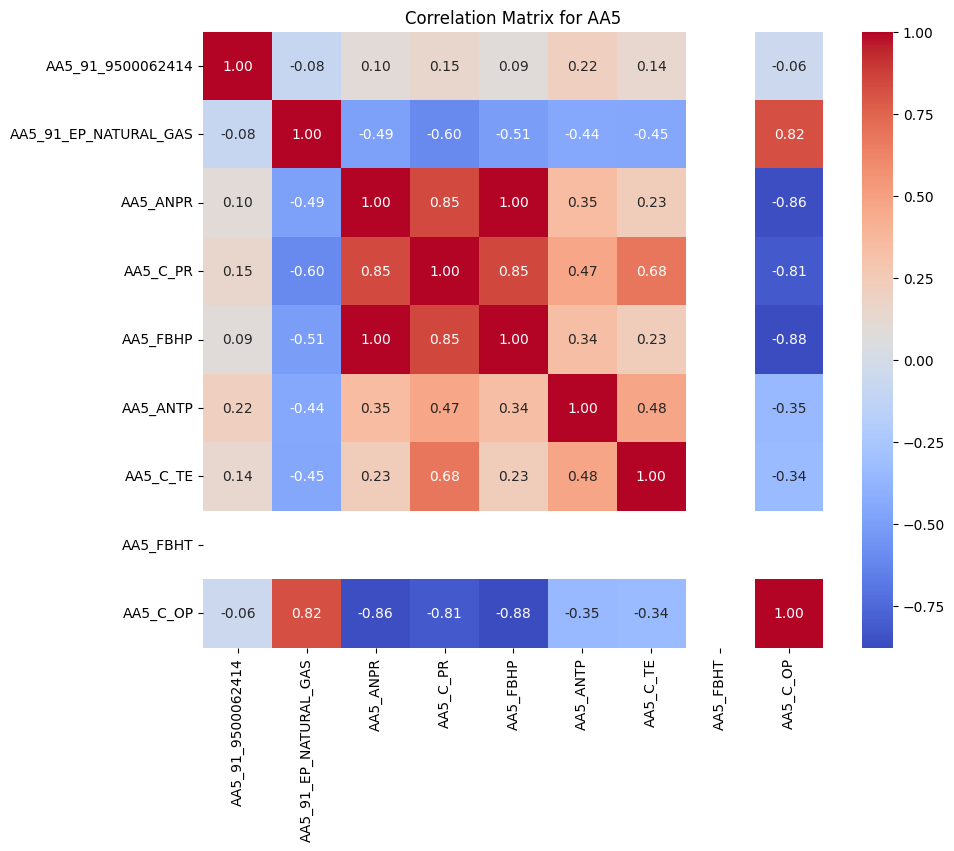

In [ ]:
# Iterate through each well
for well in ['AA1', 'AA2', 'AA3', 'AA4', 'AA5']:
    well_data = df[[f'{well}_{var}' for var in key_variables]]
    correlation_matrix = well_data.corr()
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
    plt.title(f'Correlation Matrix for {well}')
    plt.savefig(f'{well}_heatmap.png') # Save the heatmap
    plt.show()

# Making a model

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
import xgboost as xgb
from sklearn.svm import SVR

# Function to create and evaluate models for each well
def evaluate_models(X, y, well_name):
    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Scale the features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Initialize models
    models = {
        'Linear Regression': LinearRegression(),
        'Random Forest': RandomForestRegressor(random_state=42),
        'XGBoost': xgb.XGBRegressor(random_state=42),
        'Gradient Boosting': GradientBoostingRegressor(random_state=42),
        'SVR': SVR(kernel='rbf')
    }

    results = {}

    # Train and evaluate each model
    for name, model in models.items():
        model.fit(X_train_scaled, y_train)
        y_pred = model.predict(X_test_scaled)
        mse = mean_squared_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_test, y_pred)

        # Cross validation score
        cv_scores = cross_val_score(model, X_train_scaled, y_train, cv=5, scoring='r2')

        results[name] = {
            'RMSE': rmse,
            'R2': r2,
            'CV_R2_mean': cv_scores.mean(),
            'CV_R2_std': cv_scores.std(),
            'model': model,
            'scaler': scaler
        }

    print(f"\nResults for {well_name}:")
    for name, metrics in results.items():
        print(f"\n{name}:")
        print(f"RMSE: {metrics['RMSE']:.4f}")
        print(f"R2 Score: {metrics['R2']:.4f}")
        print(f"Cross-val R2: {metrics['CV_R2_mean']:.4f} (+/- {metrics['CV_R2_std']*2:.4f})")

    return results

# Prepare data for each well
wells = {
    'AA1': {
        'features': ['AA1_91_9500062414', 'AA1_ANPR', 'AA1_ANTP', 'AA1_C_OP', 'AA1_C_PR',
                    'AA1_C_TE', 'AA1_FBHP', 'AA1_FBHT', 'AA1_FTHP', 'AA1_FTHT'],
        'target': 'AA1_91_EP_NATURAL_GAS'
    },
    'AA2': {
        'features': ['AA2_91_9500062414', 'AA2_ANPR', 'AA2_ANTP', 'AA2_C_OP', 'AA2_C_PR',
                    'AA2_C_TE', 'AA2_FBHP', 'AA2_FBHT', 'AA2_FTHP', 'AA2_FTHT'],
        'target': 'AA2_91_EP_NATURAL_GAS'
    },
    'AA3': {
        'features': ['AA3_91_9500062414', 'AA3_ANPR', 'AA3_ANTP', 'AA3_C_OP', 'AA3_C_PR',
                    'AA3_C_TE', 'AA3_FBHP', 'AA3_FBHT', 'AA3_FTHP', 'AA3_FTHT'],
        'target': 'AA3_91_EP_NATURAL_GAS'
    },
    'AA4': {
        'features': ['AA4_91_9500062414', 'AA4_ANPR', 'AA4_ANTP', 'AA4_C_OP', 'AA4_C_PR',
                    'AA4_C_TE', 'AA4_FBHP', 'AA4_FBHT', 'AA4_FTHP', 'AA4_FTHT'],
        'target': 'AA4_91_EP_NATURAL_GAS'
    },
    'AA5': {
        'features': ['AA5_91_9500062414', 'AA5_ANPR', 'AA5_ANTP', 'AA5_C_OP', 'AA5_C_PR',
                    'AA5_C_TE', 'AA5_FBHP', 'AA5_FBHT', 'AA5_FTHP', 'AA5_FTHT'],
        'target': 'AA5_91_EP_NATURAL_GAS'
    }
}

# Train and evaluate models for each well
all_results = {}
for well_name, well_data in wells.items():
    X = df[well_data['features']]
    y = df[well_data['target']]
    all_results[well_name] = evaluate_models(X, y, well_name)


Results for AA1:

Linear Regression:
RMSE: 0.0078
R2 Score: 0.9428
Cross-val R2: 0.8924 (+/- 0.1508)

Random Forest:
RMSE: 0.0021
R2 Score: 0.9959
Cross-val R2: 0.9793 (+/- 0.0229)

XGBoost:
RMSE: 0.0036
R2 Score: 0.9880
Cross-val R2: 0.9726 (+/- 0.0251)

Gradient Boosting:
RMSE: 0.0026
R2 Score: 0.9936
Cross-val R2: 0.9793 (+/- 0.0251)

SVR:
RMSE: 0.0335
R2 Score: -0.0667
Cross-val R2: -0.1451 (+/- 0.2637)

Results for AA2:

Linear Regression:
RMSE: 0.0064
R2 Score: 0.6377
Cross-val R2: -2.2375 (+/- 11.3379)

Random Forest:
RMSE: 0.0023
R2 Score: 0.9537
Cross-val R2: 0.8675 (+/- 0.1609)

XGBoost:
RMSE: 0.0029
R2 Score: 0.9277
Cross-val R2: 0.8534 (+/- 0.1633)

Gradient Boosting:
RMSE: 0.0026
R2 Score: 0.9401
Cross-val R2: 0.8747 (+/- 0.1223)

SVR:
RMSE: 0.0155
R2 Score: -1.1041
Cross-val R2: -0.9168 (+/- 1.1484)

Results for AA3:

Linear Regression:
RMSE: 0.0057
R2 Score: 0.9328
Cross-val R2: 0.8734 (+/- 0.0681)

Random Forest:
RMSE: 0.0038
R2 Score: 0.9698
Cross-val R2: 0.8463 (+/- 


Model terbaik untuk Sumur AA1: Random Forest


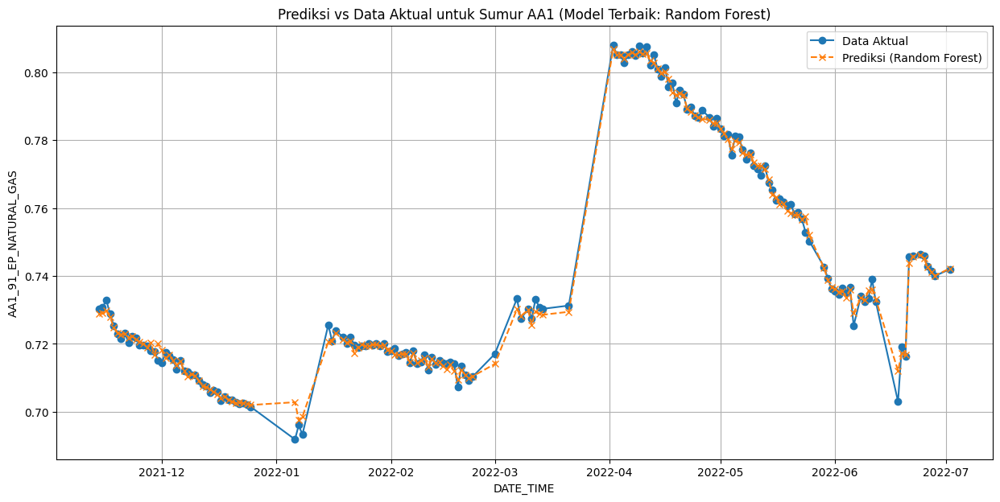


Model terbaik untuk Sumur AA2: Random Forest


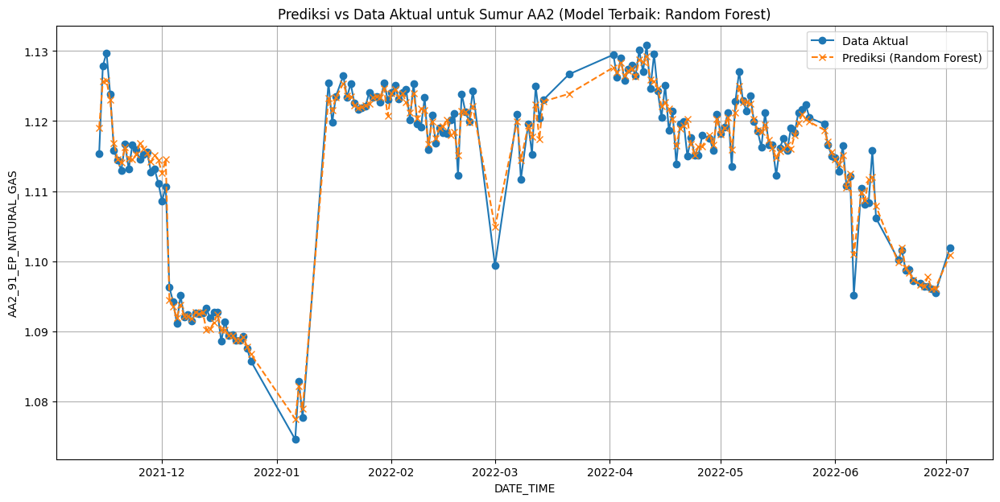


Model terbaik untuk Sumur AA3: Random Forest


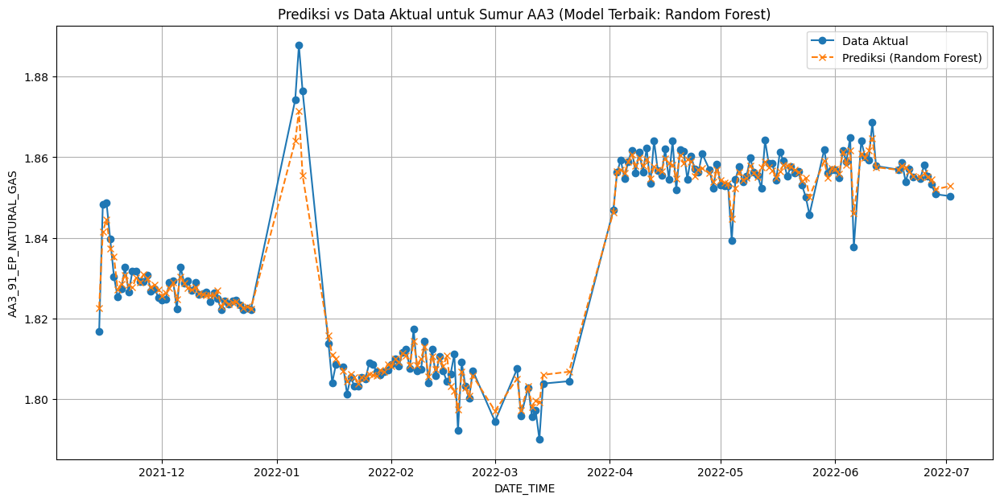


Model terbaik untuk Sumur AA4: Random Forest


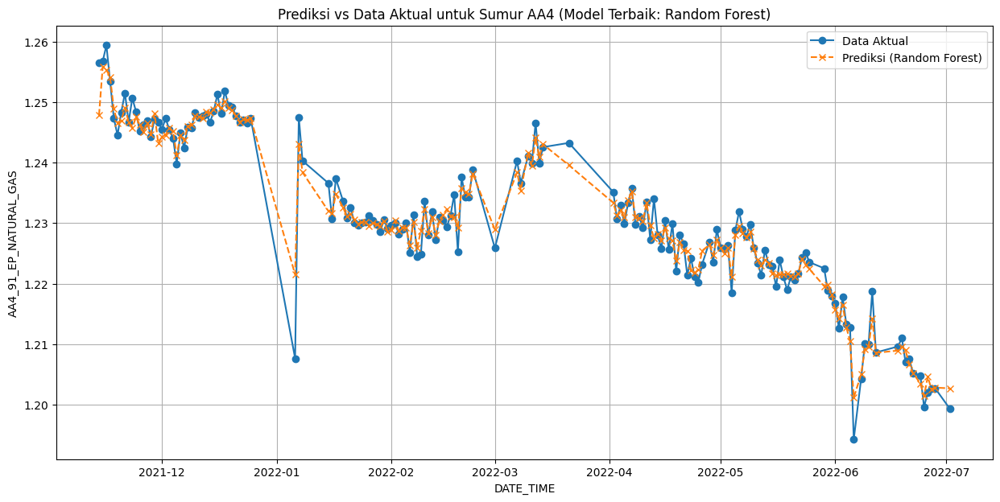


Model terbaik untuk Sumur AA5: Random Forest


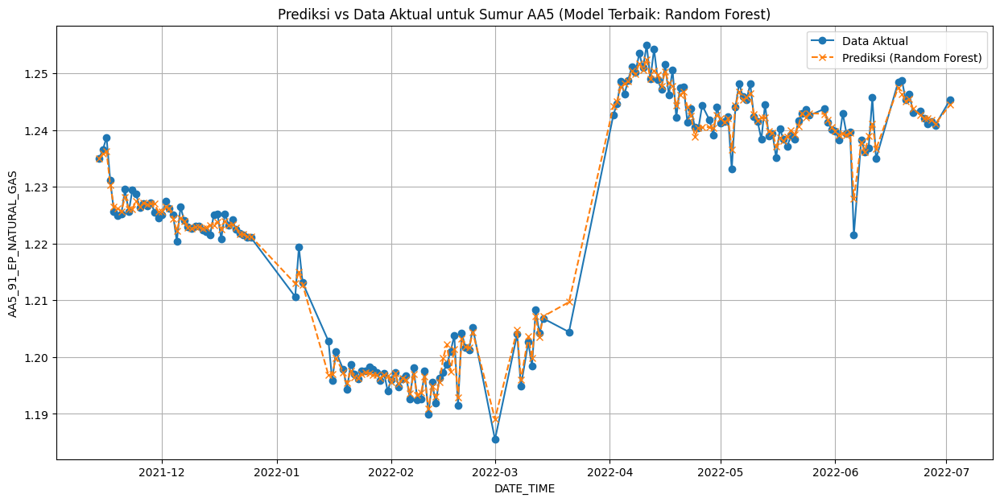

In [ ]:
# prompt: Buatkan grafik yang dapat melihatkan grafik prediksi dan data aktual dengan hasil RMSE paling kecil dan r^2 paling besar

# Function to find the best model based on RMSE and R2
def find_best_model(results):
    best_model_name = None
    best_rmse = float('inf')
    best_r2 = -float('inf')

    for name, metrics in results.items():
        if metrics['RMSE'] < best_rmse and metrics['R2'] > best_r2:
            best_rmse = metrics['RMSE']
            best_r2 = metrics['R2']
            best_model_name = name
        elif metrics['RMSE'] == best_rmse and metrics['R2'] > best_r2:
            best_r2 = metrics['R2']
            best_model_name = name
        elif metrics['RMSE'] < best_rmse and metrics['R2'] == best_r2:
             best_rmse = metrics['RMSE']
             best_model_name = name


    return best_model_name

# Function to plot actual vs predicted values for the best model
def plot_best_model_prediction(df, well_name, best_model_name, model_info):
    X = df[wells[well_name]['features']]
    y = df[wells[well_name]['target']]

    # Use the trained model and scaler from the results
    best_model = model_info['model']
    scaler = model_info['scaler']

    # Scale the features
    X_scaled = scaler.transform(X)

    # Get predictions on the entire dataset (for plotting)
    y_pred = best_model.predict(X_scaled)

    plt.figure(figsize=(15, 7))
    plt.plot(df['DATE_TIME'], y, label='Data Aktual', marker='o', linestyle='-')
    plt.plot(df['DATE_TIME'], y_pred, label=f'Prediksi ({best_model_name})', marker='x', linestyle='--')
    plt.title(f'Prediksi vs Data Aktual untuk Sumur {well_name} (Model Terbaik: {best_model_name})')
    plt.xlabel('DATE_TIME')
    plt.ylabel(f'{well_name}_91_EP_NATURAL_GAS')
    plt.legend()
    plt.grid(True)
    plt.show()

# Iterate through each well, find the best model, and plot the results
for well_name, results in all_results.items():
    best_model_name = find_best_model(results)
    print(f"\nModel terbaik untuk Sumur {well_name}: {best_model_name}")

    # Get the model and scaler info for the best model
    best_model_info = results[best_model_name]

    # Plot the actual vs predicted for the best model
    plot_best_model_prediction(df, well_name, best_model_name, best_model_info)


In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import xgboost as xgb
from sklearn.preprocessing import StandardScaler

# Create future dates for prediction
start_date = pd.to_datetime('2023-01-01')
end_date = pd.to_datetime('2023-12-31')
future_dates = pd.date_range(start=start_date, end=end_date, freq='D')
print("Generating predictions for period:", start_date.strftime('%Y-%m-%d'), "to", end_date.strftime('%Y-%m-%d'))

# Dictionary to store predictions for each well
predictions_dict = {}

# Train XGBoost model and make predictions for each well
for well_prefix in ['AA1', 'AA2', 'AA3', 'AA4', 'AA5']:
    print(f"\nTraining XGBoost model for {well_prefix}")

    # Select features and target for current well
    features = [f"{well_prefix}_91_9500062414", f"{well_prefix}_ANPR", f"{well_prefix}_ANTP",
                f"{well_prefix}_C_OP", f"{well_prefix}_C_PR", f"{well_prefix}_C_TE",
                f"{well_prefix}_FBHP", f"{well_prefix}_FBHT", f"{well_prefix}_FTHP",
                f"{well_prefix}_FTHT"]
    target = f"{well_prefix}_91_EP_NATURAL_GAS"

    X = df[features]
    y = df[target]

    # Scale the features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Train XGBoost model on all data
    model = xgb.XGBRegressor(n_estimators=100, random_state=42)
    model.fit(X_scaled, y)

    # Generate synthetic future features based on historical patterns
    # Using mean values from last 30 days as a baseline
    last_30_days = X.tail(30).mean()

    # Create future features matrix
    n_days = len(future_dates)
    future_features = np.tile(last_30_days.values, (n_days, 1))

    # Add some random variation to make it more realistic
    np.random.seed(42)
    variation = np.random.normal(0, 0.1, future_features.shape)
    future_features = future_features * (1 + variation)

    # Scale future features
    future_features_scaled = scaler.transform(future_features)

    # Make predictions
    predictions = model.predict(future_features_scaled)

    # Store predictions
    predictions_dict[well_prefix] = predictions

# Create DataFrame with predictions
forecast_df = pd.DataFrame(index=future_dates)
for well_prefix in predictions_dict.keys():
    forecast_df[f"{well_prefix}_91_EP_NATURAL_GAS"] = predictions_dict[well_prefix]

# Save forecasts to CSV
forecast_df.to_csv('gas_production_forecast_2023.csv')
print("\nForecast summary:")
print(forecast_df.describe())

# Display first few rows of predictions
print("\nFirst few days of predictions:")
print(forecast_df.head())

Generating predictions for period: 2023-01-01 to 2023-12-31

Training XGBoost model for AA1


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(



Training XGBoost model for AA2


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(



Training XGBoost model for AA3


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(



Training XGBoost model for AA4


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(



Training XGBoost model for AA5

Forecast summary:
       AA1_91_EP_NATURAL_GAS  AA2_91_EP_NATURAL_GAS  AA3_91_EP_NATURAL_GAS  \
count             365.000000             365.000000             365.000000   
mean                0.675792               0.834986               1.583789   
std                 0.096824               0.276117               0.216297   
min                 0.417927               0.308431               1.103402   
25%                 0.605075               0.583980               1.367931   
50%                 0.689793               0.723768               1.640676   
75%                 0.751941               1.139940               1.782022   
max                 0.825347               1.220867               1.879238   

       AA4_91_EP_NATURAL_GAS  AA5_91_EP_NATURAL_GAS  
count             365.000000             365.000000  
mean                0.788530               1.204788  
std                 0.263482               0.225138  
min                 0.438106  

In [ ]:
df_predcited = pd.read_csv('gas_production_forecast_2023.csv')
df_predcited.head()

,Unnamed: 0,AA1_91_EP_NATURAL_GAS,AA2_91_EP_NATURAL_GAS,AA3_91_EP_NATURAL_GAS,AA4_91_EP_NATURAL_GAS,AA5_91_EP_NATURAL_GAS
0,2023-01-01,0.689748,1.154929,1.829255,1.198295,1.420421
1,2023-01-02,0.701271,0.898185,1.367598,0.957504,1.172460
2,2023-01-03,0.632544,1.125019,1.339913,0.791590,1.193423
3,2023-01-04,0.751028,0.559983,1.643971,0.563910,1.248140
4,2023-01-05,0.773955,0.899087,1.360142,1.072500,1.150960


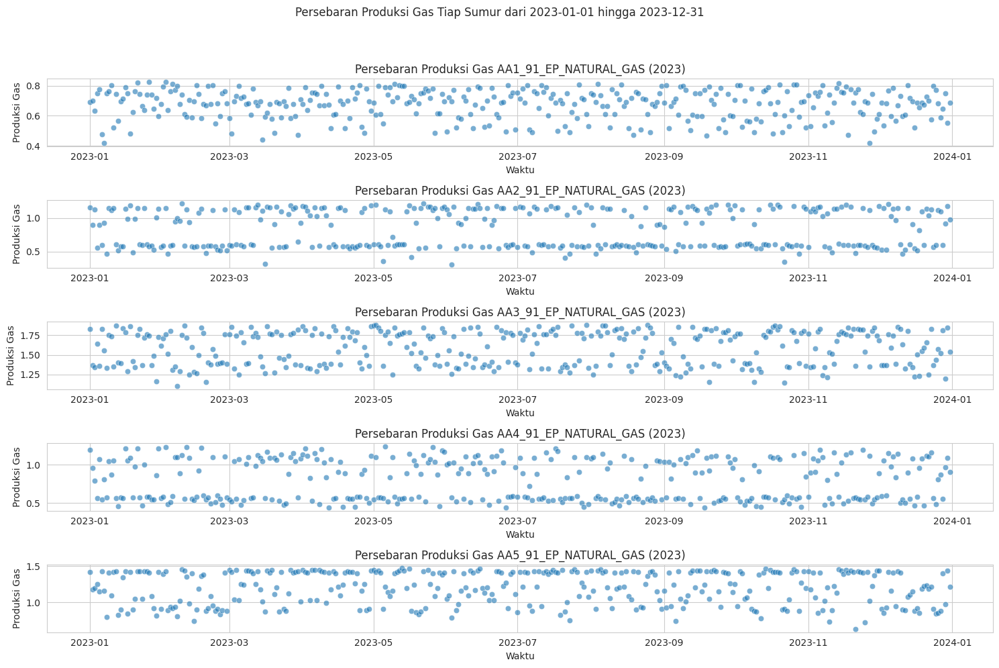

In [ ]:
# prompt: Buat grafik persebaran untuk setiap waktu dari hasil gas produksi tiap sumur dari tahun 2023-01-01  sampai 2023-12-31

# Filter data for the specified date range
start_date = pd.to_datetime('2023-01-01')
end_date = pd.to_datetime('2023-12-31')
df_predcited['Unnamed: 0'] = pd.to_datetime(df_predcited['Unnamed: 0'])
forecast_df_filtered = df_predcited[(df_predcited['Unnamed: 0'] >= start_date) & (df_predcited['Unnamed: 0'] <= end_date)].copy()

# Rename the date column for clarity
forecast_df_filtered.rename(columns={'Unnamed: 0': 'DATE_TIME'}, inplace=True)

# Get the list of well columns (gas production)
well_columns = [col for col in forecast_df_filtered.columns if '_91_EP_NATURAL_GAS' in col]

# Create scatter plots for each well's gas production over time
plt.figure(figsize=(15, 10))

for i, well_col in enumerate(well_columns):
    plt.subplot(len(well_columns), 1, i + 1)
    sns.scatterplot(data=forecast_df_filtered, x='DATE_TIME', y=well_col, alpha=0.6)
    plt.title(f'Persebaran Produksi Gas {well_col} (2023)')
    plt.xlabel('Waktu')
    plt.ylabel('Produksi Gas')
    plt.grid(True)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap

plt.suptitle('Persebaran Produksi Gas Tiap Sumur dari 2023-01-01 hingga 2023-12-31', y=1.02)
plt.show()